# Telegram Analysis

## Prepare environment

In [1]:
"""
Set flag to true, if you work in visual studio code (connected to custom docker)
Set flag to false, if you work in browser (jupyter notebook ui from custom docker)
"""
C_LOCAL                 = True

"""
Set flag to true, if you want process no long term running tasks and take spot check from data
"""
C_SHORT_RUN             = False
C_NUMBER_SAMPLES        = 1000 #only if C_SHORT_RUN set to true and if you dont use cache

"""
Resolve new urls?
Set flag to false, if you dont want to resolve new urls
"""
C_RESOLVE_NEW_URLS      = False

"""
Load DataSets (global)
Ava:    ["dataSet0", "dataSet1", "dataSet1a", "dataSet2"]
Htdocs: ["dataSet0", "dataSet1a", "dataSet2"]
Req:    ["dataSet0]
"""
C_LOAD_DATASET          = ["dataSet0", "dataSet1", "dataSet1a", "dataSet2"]

"""
Load Piplelines? (HuggingFace transformers)
"""
C_LOAD_PIPELINES        = True
C_PIPELINE_DATASET      = ["dataSet0"]

"""
Time Plot Freq
e.g. 1M = 1 Month
e.g. 1W = 1 Week
e.g. 1D = 1 Day
"""
C_TIME_PLOT_FREQ        = "1D"

"""
Cache?
Set C_USE_CACHE_FILE to "", if you want to use no cache!
Set C_NEW_CACHE_FILE to "", if you want to create no cache!
Please set only one value!
Please create new cache if you change params above
# e.g
# - local-run-temp.pkl          (Short run, with hf, with htdocs-datasets) - deprecated
# - local-run-ht-temp.pkl       (Long run, without hf, with htdocs-datasets) - deprecated
# - long-run-server-21-01.pkl   (Long run, with hf, with htdocs-datasets) - deprecated
#
# - long-run-server-28-01.pkl   (Long run, with hf, with htdocs-datasets, updated with sen-pipe-2)
# - long-run-server-07-02.pkl   (Long run, with hf, with all datasets, updated with sen-pipe-2)
# - local-run-28-01.pkl         (Short run, with hf, with htdocs-datasets, updated with sen-pipe-2)
# - test.pkl                    (Test file)
"""
#e.g. data-cache.pkl
C_USE_CACHE_FILE        = "long-run-server-07-02.pkl"
C_NEW_CACHE_FILE        = ""

In [2]:
# Import default libs
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import time

# Import url libs
from urllib.parse import urlparse
from collections import Counter
import requests

# File Handler Lib
from pathlib import Path

# Set graph widget (used by jupyter notebook)
#%matplotlib notebook   #interactive graphs
%matplotlib inline

In [3]:
# Install and import Graph Lib
import networkx as nx
#! pip install pydot

In [4]:
# Install and import  JSON Lib
#! pip install demjson
import demjson
#import json

In [5]:
# Install and import Natural Language Toolkit
#! pip install nltk
import nltk

# Ngrams
import re
from nltk.util import ngrams

# Stopwords
nltk.download("stopwords")
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package stopwords to /home/jovyan/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /home/jovyan/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /home/jovyan/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [6]:
# Gensim and pyLDAvis
#! pip install gensim
#! pip install pyLDAvis

import gensim

from gensim.utils import simple_preprocess

import gensim.corpora as corpora

from pprint import pprint

import pyLDAvis.gensim
import pickle 
import pyLDAvis

import os

# TODO Set to ignore?
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.simplefilter("once")

# SET TOKENIZERS_PARALLELISM
os.environ["TOKENIZERS_PARALLELISM"] = "false"

In [7]:
# Install and import demoji
# Dont exists on conda
import sys
!{sys.executable} -m pip install demoji

import demoji
demoji.download_codes()

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


... OK

 (Got response in 0.39 seconds)

Writing emoji data to /home/jovyan/.demoji/codes.json ...

... OK

In [8]:
# Install and import WordCloud
#! pip install wordcloud
from wordcloud import WordCloud

/opt/conda/lib/python3.8/site-packages/wordcloud/wordcloud.py:35: ResourceWarning: unclosed file <_io.TextIOWrapper name='/opt/conda/lib/python3.8/site-packages/wordcloud/stopwords' mode='r' encoding='UTF-8'>
  STOPWORDS = set(map(str.strip, open(os.path.join(FILE, 'stopwords')).readlines()))


In [9]:
#!{sys.executable} -m pip install lxml
from lxml.html import fromstring

In [10]:
# Bert and co.
import torch
from transformers import AutoTokenizer, AutoModelForTokenClassification, pipeline

/opt/conda/lib/python3.8/site-packages/packaging/version.py:127: DeprecationWarning: Creating a LegacyVersion has been deprecated and will be removed in the next major release
  warnings.warn(


In [11]:
# Install Hanover Tagger
# Dont exists on conda
!{sys.executable} -m pip install HanTa
from HanTa import HanoverTagger as ht

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [12]:
# TODO: Install via conda
!{sys.executable} -m pip install textblob-de
from textblob_de import TextBlobDE as TextBlob

In [13]:
# Show all columns (pandas hides columns by default)
pd.set_option('display.max_columns', None)

In [14]:
# Set plot style
# TODO: Test different style
plt.style.use('ggplot')

In [15]:
# Set env vars
if(C_LOCAL == True):
    dir_var = "./work/notebooks/"
else:
    dir_var = "./"

dir_var_output = dir_var + "output/"

dir_var_cache= dir_var + "cache/"

dir_var_pandas_cache = dir_var + "cache/pandas/"

# Debug output
! echo "- Workdir -"
! ls -al $dir_var

! echo
! echo "- Outputdir -"
! ls -al $dir_var_output

! echo
! echo "- Cachedir -"
! ls -al $dir_var_cache

! echo
! echo "- Pandas -"
! ls -al $dir_var_pandas_cache

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


- Workdir -


total 500
drwxrwxr-x 5 jovyan  1000   4096 Feb 20 18:05 .
drwxrwxr-x 6 jovyan  1000   4096 Feb 12 13:38 ..
-rw-rw-r-- 1 jovyan  1000     46 Feb  9 12:08 additionalStopwords.txt
drwxrwxr-x 3 jovyan  1000   4096 Feb 13 15:58 cache
-rw-rw-r-- 1 jovyan  1000  32005 Feb 20 18:05 Classifier.ipynb
-rwxrwxr-x 1 jovyan  1000    285 Feb  9 12:08 clean-notebook.sh
drwxr-xr-x 7 jovyan  1000   4096 Jan 13 09:30 data
-rw-rw-r-- 1 jovyan  1000  39822 Feb  9 12:08 HuggingFace.ipynb
-rw-rw-r-- 1 jovyan  1000  12522 Feb  9 12:08 inputFiles.csv
-rw-rw-r-- 1 jovyan  1000      0 Feb 20 18:05 log.txt
drwxrwxr-x 4 jovyan  1000   4096 Feb 20 18:05 output
-rwxrwxr-x 1 jovyan  1000    456 Feb 20 18:04 run-notebook.sh
-rwxrwxr-x 1 jovyan  1000 164795 Feb 20 18:05 Telegram.ipynb
-rw-r--r-- 1 jovyan users 217764 Feb 20 18:06 Telegram-out.ipynb


- Outputdir -


total 16
drwxrwxr-x 4 jovyan 1000 4096 Feb 20 18:05 .
drwxrwxr-x 5 jovyan 1000 4096 Feb 20 18:05 ..
drwxrwxr-x 2 jovyan 1000 4096 Feb 20 18:05 autoWordCloud
-rw-rw-r-- 1 jovyan 1000    0 Feb  9 12:08 .gitkeep
drwxrwxr-x 2 jovyan 1000 4096 Feb 20 18:05 pyLDAvis


- Cachedir -


total 5324
drwxrwxr-x 3 jovyan 1000    4096 Feb 13 15:58 .
drwxrwxr-x 5 jovyan 1000    4096 Feb 20 18:05 ..
-rw-rw-r-- 1 jovyan 1000    1170 Feb 13 17:29 auto-wordcloud-attila-hildmann.csv
-rw-rw-r-- 1 jovyan 1000    1936 Feb 13 17:29 auto-wordcloud-eva-herman.csv
-rw-rw-r-- 1 jovyan 1000    3780 Feb 13 17:28 auto-wordcloud-oliver-janich.csv
-rw-rw-r-- 1 jovyan 1000    1386 Feb 13 17:30 auto-wordcloud-xavier-naidoo.csv
-rw-rw-r-- 1 jovyan 1000       8 Feb  9 12:08 .gitignore
-rw-rw-r-- 1 jovyan 1000       0 Feb  9 12:08 .gitkeep
drwxrwxr-x 2 jovyan 1000    4096 Feb 14 10:38 pandas
-rw-rw-r-- 1 jovyan 1000  145362 Feb 13 15:58 resolved-urls.csv
-rw-rw-r-- 1 jovyan 1000 5270363 Feb 13 15:58 resolved-youtube.csv


- Pandas -


total 2803940
drwxrwxr-x 2 jovyan  1000       4096 Feb 14 10:38 .
drwxrwxr-x 3 jovyan  1000       4096 Feb 13 15:58 ..
-rw-rw-r-- 1 jovyan  1000          0 Feb  9 12:08 .gitkeep
-rw-r--r-- 1 jovyan users 1716933045 Feb 10 22:47 long-run-server-07-02.pkl
-rw-rw-r-- 1 jovyan  1000 1154277614 Feb 14 10:41 long-run-server-28-01.pkl


### Global functions

In [16]:
dictGloStopwatches = dict()

# Start timer (for reporting)
def gloStartStopwatch(key):
    print("[Stopwatch started >>" + str(key) + "<<]")
    dictGloStopwatches[key] = time.time()

# Stop timer (for reporting)
def gloStopStopwatch(key):
    endTime     = time.time()
    startTime   = dictGloStopwatches[key]
    print("[Stopwatch stopped >>" + str(key) + "<< (" + '{:5.3f}s'.format(endTime-startTime) + ")]")

In [17]:
"""
Check if text is json formatted

param   text        InputText
param   singleMode  Boolean (set to true, if text is part of a message)
"""
def gloCheckIsTextJsonFormatted(text, singleMode):
    textString = str(text)
    if      (singleMode == False and textString.startswith("[") == True and textString.endswith("]") == True):
        return True
    elif    (singleMode == True and textString.startswith("{") == True and textString.endswith("}") == True):
        return True
    else:
        return False

In [18]:
def gloReplaceGermanChars(inputText):

    inputText = inputText.replace("ö", "oe")
    inputText = inputText.replace("ü", "ue")
    inputText = inputText.replace("ä", "ae")

    inputText = inputText.replace("Ö", "Oe")
    inputText = inputText.replace("Ü", "Ue")
    inputText = inputText.replace("Ä", "Ae")

    inputText = inputText.replace("ß", "ss")
    
    return inputText

In [19]:
# Rm unsafe chars
def gloConvertToSafeString(text):
    text = demoji.replace(text, "")
    text = gloReplaceGermanChars(text)
    text = re.sub(r'[^a-zA-Z0-9\s]', '', text)
    #text = text.encode('ascii', 'ignore')
    #text = text.decode('ascii')
    return text

# Generate unique chat name
def gloConvertToSafeChatName(chatName):
    chatName = gloConvertToSafeString(chatName)
    return chatName[:30]

In [20]:
def gloGetStopWordsList(filterList):

    stopwWorldsList = []

    deWordsList = nltk.corpus.stopwords.words('german')

    enWordsList = nltk.corpus.stopwords.words('english')

    aStopwords = []
    with open(dir_var + "additionalStopwords.txt") as file:
        for line in file: 
            line = line.strip()
            if(line != ""):
                aStopwords.append(line)

    for s in filterList:
        s = gloReplaceGermanChars(s)
        stopwWorldsList.append(s)

    for s in deWordsList:
        s = gloReplaceGermanChars(s)
        stopwWorldsList.append(s)

    for s in enWordsList:
        stopwWorldsList.append(s)

    for s in aStopwords:
        s = gloReplaceGermanChars(s)
        stopwWorldsList.append(s)

    return stopwWorldsList

In [21]:
# Dict File Cache
dictFileCache = {}

# Write dict to file (CSV)
def gloWriteDictToFile(filename, targetDict):
    dictFileCache = {} #Clear cache
    d = pd.DataFrame.from_dict(targetDict, orient="index")
    d.to_csv(dir_var_cache + filename, header=False)

# Read dict from file (CSV)
def gloReadDictFromFile(filename):
    # Cache?
    if(filename in dictFileCache):
        return dictFileCache[filename]

    d = pd.read_csv(dir_var_cache + filename, header=None, index_col=0, squeeze=True)
    retDict = d.to_dict()

    dictFileCache[filename] = retDict #Add to cache

    return retDict

# Init csv file if not exists
def gloInitFileDict(filename):
    f = Path(dir_var_cache + filename)
    if(f.exists() == False):
        print("Init cache file >>" + filename + "<<")
        f.touch()
        gloWriteDictToFile(filename, {"initKey": "initValue"})
    else:
        print("Cache already exists >>" + filename + "<<")

In [22]:
# Check if is already cached
def gloCheckIsAlreadyCached(filename, targetKey):
    targetDict = gloReadDictFromFile(filename)
    if(targetKey in targetDict.keys()):
        return True
    else:
        return False

# Add key to cache
def gloAddToCache(filename, targetKey, targetValue):
    targetDict = gloReadDictFromFile(filename)
    targetDict[targetKey] = targetValue
    gloWriteDictToFile(filename, targetDict)

# Get key from cache
def gloGetCached(filename, targetKey):
    targetDict = gloReadDictFromFile(filename)
    return targetDict[targetKey]

In [23]:
# param rowID e.g. procTDSafeText
def gloGenerateTextFromChat(df, rowID):
    df = df.copy()
    df = df[df.procEvalIsValidText == True]
    
    # Iterate over text (global text from group)
    textList = []
    for index, row in df.iterrows():
        textList.append(" " + row[rowID])
        
    textString = ''.join(textList)

    return textString

#### Init Cache Files

In [24]:
gloInitFileDict("resolved-urls.csv")

Cache already exists >>resolved-urls.csv<<

In [25]:
gloInitFileDict("resolved-youtube.csv")

Cache already exists >>resolved-youtube.csv<<

#### Load Pipelines

In [26]:
dictPipelines = {}

def loadPipelines():

    if(C_LOAD_PIPELINES == False):
        print("Skip loading pipelines")
        return list()

    gloStartStopwatch("Load Pipelines")
    

    gloStartStopwatch("Load ner-xlm-Roberta")
    dictPipelines["ner-xlm-roberta"] = pipeline(
        'ner', 
        model='xlm-roberta-large-finetuned-conll03-german',
        tokenizer='xlm-roberta-large-finetuned-conll03-german'
    )
    gloStopStopwatch("Load ner-xlm-Roberta")

    gloStartStopwatch("Load ner-Bert")
    dictPipelines["ner-bert"] = pipeline(
        'ner', 
        model='fhswf/bert_de_ner',
        tokenizer='fhswf/bert_de_ner'
    )
    gloStopStopwatch("Load ner-Bert")

    gloStartStopwatch("Load sen-Bert")
    dictPipelines["sen-bert"] = pipeline(
        'sentiment-analysis', 
        model='nlptown/bert-base-multilingual-uncased-sentiment',
        tokenizer='nlptown/bert-base-multilingual-uncased-sentiment'
    )
    gloStopStopwatch("Load sen-Bert")

    gloStartStopwatch("Load text-gen-gpt2")
    dictPipelines["text-gen-gpt2"] = pipeline(
        'text-generation', 
        model='dbmdz/german-gpt2',
        tokenizer='dbmdz/german-gpt2'
    )
    gloStopStopwatch("Load text-gen-gpt2")

    gloStartStopwatch("Load text-gen-gpt2-faust")
    dictPipelines["text-gen-gpt2-faust"] = pipeline(
        'text-generation', 
        model='dbmdz/german-gpt2-faust',
        tokenizer='dbmdz/german-gpt2-faust'
    )
    gloStopStopwatch("Load text-gen-gpt2-faust")


    gloStopStopwatch("Load Pipelines")

    return dictPipelines.keys()

pipelineKeys = loadPipelines()

print()
print(str(pipelineKeys))

[Stopwatch started >>Load Pipelines<<]

[Stopwatch started >>Load ner-xlm-Roberta<<]

[Stopwatch stopped >>Load ner-xlm-Roberta<< (52.300s)]

[Stopwatch started >>Load ner-Bert<<]

[Stopwatch stopped >>Load ner-Bert<< (12.383s)]

[Stopwatch started >>Load sen-Bert<<]

[Stopwatch stopped >>Load sen-Bert<< (17.334s)]

[Stopwatch started >>Load text-gen-gpt2<<]

Special tokens have been added in the vocabulary, make sure the associated word embedding are fine-tuned or trained.


[Stopwatch stopped >>Load text-gen-gpt2<< (16.829s)]

[Stopwatch started >>Load text-gen-gpt2-faust<<]

Special tokens have been added in the vocabulary, make sure the associated word embedding are fine-tuned or trained.


[Stopwatch stopped >>Load text-gen-gpt2-faust<< (16.035s)]

[Stopwatch stopped >>Load Pipelines<< (114.895s)]

dict_keys(['ner-xlm-roberta', 'ner-bert', 'sen-bert', 'text-gen-gpt2', 'text-gen-gpt2-faust'])

## Process input jobs

In [27]:
gloStartStopwatch("Global notebook")

[Stopwatch started >>Global notebook<<]

In [28]:
# Read jobs from file
dfInputFiles = pd.read_csv(dir_var + "inputFiles.csv", sep=";")

In [29]:
dfFilter = pd.DataFrame()

for dS in C_LOAD_DATASET:
    dfFilter = dfFilter.append(dfInputFiles[dfInputFiles.inputDesc == dS])

dfInputFiles = dfFilter

### Overview input jobs

In [30]:
dfInputFiles

,inputName,inputPath,inputType,inputId,inputDesc,inputDownloadType
47,ATTILA HILDMANN,DS-05-01-2021/ChatExport_2021-01-05-hildmann,public_channel,10034163583,dataSet0,onlyText
48,Oliver Janich oeffentlich,DS-05-01-2021/ChatExport_2021-01-05-janich,public_channel,9808932799,dataSet0,onlyText
49,Eva Herman Offiziell,DS-05-01-2021/ChatExport_2021-01-05-evaherman,public_channel,9915108907,dataSet0,onlyText
50,Xavier Naidoo (inoffiziell),DS-05-01-2021/ChatExport_2021-01-05-xavier,public_channel,9874390332,dataSet0,onlyText
51,Gerechtigkeit fuer das Vaterland,DS-05-01-2021a/ChatExport_2021-01-05-gerechtig...,public_channel,10069007089,dataSet1,onlyText
...,...,...,...,...,...,...
103,Querdenken 773 Hegau - Info Kanal,DS-13-01-2021/ChatExport_2021-01-13-querdenken...,public_channel,9885532851,dataSet2,onlyText
104,Querdenken 711 Stuttgart - Diskussion u. Austa...,DS-13-01-2021/ChatExport_2021-01-13-querdenken711,public_supergroup,9812812343,dataSet2,onlyText
105,Querdenken 711 Stuttgart - Info Kanal,DS-13-01-2021/ChatExport_2021-01-13-querdenken...,public_channel,9818761759,dataSet2,onlyText
106,Querdenken 69 Frankfurt - Diskussion u. Austausch,DS-13-01-2021/ChatExport_2021-01-13-querdenken69,public_supergroup,9906959218,dataSet2,onlyText


### Transform data into DataFrmaes

In [31]:
# Convert to DataFrame Meta (Chat Meta)
def convertToDataFrameMeta(filePath):
    dF = pd.read_json(dir_var + "data/" + filePath + "/result.json", encoding='utf-8')
    return dF

# Convert to DataFrame Messages (Chat Messages)
def convertToDataFrameMessages(filePath):
    dF = pd.json_normalize(dictMeta[filePath].messages)
    return dF

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [32]:
# https://stackoverflow.com/questions/6718633/python-regular-expression-again-match-url
def getUrlRegex():
    return "((?:https?://)?(?:(?:www\.)?(?:[\da-z\.-]+)\.(?:[a-z]{2,6})|(?:(?:25[0-5]|2[0-4][0-9]|[01]?[0-9][0-9]?)\.){3}(?:25[0-5]|2[0-4][0-9]|[01]?[0-9][0-9]?)|(?:(?:[0-9a-fA-F]{1,4}:){7,7}[0-9a-fA-F]{1,4}|(?:[0-9a-fA-F]{1,4}:){1,7}:|(?:[0-9a-fA-F]{1,4}:){1,6}:[0-9a-fA-F]{1,4}|(?:[0-9a-fA-F]{1,4}:){1,5}(?::[0-9a-fA-F]{1,4}){1,2}|(?:[0-9a-fA-F]{1,4}:){1,4}(?::[0-9a-fA-F]{1,4}){1,3}|(?:[0-9a-fA-F]{1,4}:){1,3}(?::[0-9a-fA-F]{1,4}){1,4}|(?:[0-9a-fA-F]{1,4}:){1,2}(?::[0-9a-fA-F]{1,4}){1,5}|[0-9a-fA-F]{1,4}:(?:(?::[0-9a-fA-F]{1,4}){1,6})|:(?:(?::[0-9a-fA-F]{1,4}){1,7}|:)|fe80:(?::[0-9a-fA-F]{0,4}){0,4}%[0-9a-zA-Z]{1,}|::(?:ffff(?::0{1,4}){0,1}:){0,1}(?:(?:25[0-5]|(?:2[0-4]|1{0,1}[0-9]){0,1}[0-9])\.){3,3}(?:25[0-5]|(?:2[0-4]|1{0,1}[0-9]){0,1}[0-9])|(?:[0-9a-fA-F]{1,4}:){1,4}:(?:(?:25[0-5]|(?:2[0-4]|1{0,1}[0-9]){0,1}[0-9])\.){3,3}(?:25[0-5]|(?:2[0-4]|1{0,1}[0-9]){0,1}[0-9])))(?::[0-9]{1,4}|[1-5][0-9]{4}|6[0-4][0-9]{3}|65[0-4][0-9]{2}|655[0-2][0-9]|6553[0-5])?(?:/[\w\.-]*)*/?)"

def getHashtagRegex():
    return "#(\w+)"

def hashTagExtractHashTags(inputText):

    inputText = str(inputText)

    inputText = re.sub('\n', ' ', inputText) # Replace \n
    inputText = demoji.replace(inputText, " ") # Rm emoji
    inputText = gloReplaceGermanChars(inputText) # Replace german chars

    return re.findall(getHashtagRegex(), inputText)

def urlExtractUrls(inputText):
    return re.findall(getUrlRegex(), str(inputText))

def urlRemoveUrls(inputText):
    return re.sub(getUrlRegex(), " ", str(inputText))

<>:3: DeprecationWarning: invalid escape sequence \.


<>:6: DeprecationWarning: invalid escape sequence \w


In [33]:
"""
Get params from extractedTextData
See cell below (key)
"""
def getExtractedTextDataParam(key, extractedTextData):

    a,b,c,d,e,f,g = extractedTextData

    if(key == 0):

        return urlRemoveUrls(a)

    elif(key == 1):

        before = b
        extracted = urlExtractUrls(a)

        after = before
        after.extend(extracted)

        """
        if(str(extracted) != "[]"):
            # TODO: Fix return bug
            print("Debug >>" + str(before) + "/" + str(extracted) + ">>" + str(after) + "<<")
        """

        return after

    elif(key == 2):

        # TODO: Refactor dont take it from extractedTextData
        return hashTagExtractHashTags(a)

    else:
        switcher = {
            3: d,
            4: e,
            5: f,
            6: g
        }
        return switcher.get(key)

In [34]:
"""
Extract text data (see cell above key)
See cell above (key)

param   procIsJsonFormatted Boolean (is text json formatted?)
param   text                String  (text from message) 

return
a   procText            Plain Text
b   processedURLs       Array of URLs in Text
c   processedHashtags   Array of Hashtags in Text #TODO: RM
d   processedBolds      Array of Bold Items in Text
e   processedItalics    Array of Italic Items in Text
f   processedUnderlines Array of Underlined Items in Text
g   processedEmails     Array of E-Mails in Text
"""
def extractTextData(procIsJsonFormatted, text):
    
    # 3 returns in this function...
    
    processedURLs       = list()
    processedHashtags   = list() # TODO: RM
    processedBolds      = list()
    processedItalics    = list()
    processedUnderlines = list()
    processedEmails     = list()
    
    if(procIsJsonFormatted != True):
        #Is not JSON formatted (return normal text)
        return (text, processedURLs, processedHashtags, processedBolds, processedItalics, processedUnderlines, processedEmails)
    else:
        #Is is JSON formatted (try to parse)
        try:
            returnList = []
            jsonList = demjson.decode(str(text), encoding='utf8')

            # Do for each item in list
            for lItem in jsonList:

                messageString = str(lItem)

                isJsonSubString = gloCheckIsTextJsonFormatted(messageString, singleMode = True)

                if(isJsonSubString):
                    # Is Json Sub String
                    subJsonString = demjson.decode(str(messageString), encoding='utf8')
                    subJsonType = subJsonString["type"]

                    if(subJsonType == "bold"):
                        #text included
                        processedBolds.append(subJsonString["text"])
                        returnList.append(subJsonString["text"])
                        
                    elif(subJsonType == "italic"):
                        #text included
                        processedItalics.append(subJsonString["text"])
                        returnList.append(subJsonString["text"])
                        
                    elif(subJsonType == "underline"):
                        #text included
                        processedUnderlines.append(subJsonString["text"])
                        returnList.append(subJsonString["text"])
                    
                    elif(subJsonType == "email"):
                        #text included
                        processedEmails.append(subJsonString["text"])
                        
                    elif(subJsonType == "text_link"):
                        #text and href included
                        processedURLs.append(subJsonString["href"])
                        #returnList.append(subJsonString["text"])
                        
                    elif(subJsonType == "link"):
                        #text included
                        processedURLs.append(subJsonString["text"])
                        
                    elif(subJsonType == "hashtag"):
                        #text included
                        #processedHashtags.append(subJsonString["text"]) # TODO: Refactor: Dont add hashtags here!
                        returnList.append(subJsonString["text"])
                        
                    elif(subJsonType == "mention"):
                        #text included
                        returnList.append(subJsonString["text"])
                        
                    elif(subJsonType == "mention_name"):
                        #text and user_id included
                        returnList.append(subJsonString["text"])
                        
                    elif(subJsonType == "bot_command"):
                        #text included
                        returnList = returnList 
                        
                    elif(subJsonType == "code"):
                        #text included
                        returnList = returnList
                        
                    elif(subJsonType == "phone"):
                        #text included
                        returnList = returnList
                        
                    elif(subJsonType == "strikethrough"):
                        #text included
                        returnList.append(subJsonString["text"])
                        
                    elif(subJsonType == "pre"):
                        #text and language included
                        returnList.append(subJsonString["text"])
                        
                    elif(subJsonType == "bank_card"):
                        #text included
                        returnList = returnList
                        
                    else:
                        print("- Error: Unkown json type >>" + str(subJsonType) + "<< (ignore) >>" + str(text) + "<<")

                else:
                    # Is no json formatted sub string (append text)
                    returnList.append(messageString)

            return (''.join(returnList), processedURLs, processedHashtags, processedBolds, processedItalics, processedUnderlines, processedEmails)
        
        except:
            # Parser error (set inputText to returnText)
            print("- Warn: Json parser error (set inputText to returnText) >>" + str(text) + "<<")
            return (text, processedURLs, processedHashtags, processedBolds, processedItalics, processedUnderlines, processedEmails)

In [35]:
# returns dict (empty dict if disabled, dict with not entries if error)
listUnknownTypes = list()
def processNerPipeline(inputText, pipelineKey, configMinScore):
    if(pipelineKey in pipelineKeys):

        listPer     = list()
        listMisc    = list()
        listOrg     = list()
        listLoc     = list()


        try:

            data = dictPipelines[pipelineKey](inputText)

            for d in data:

                jsonData = demjson.decode(str(d), encoding='utf8')
                            
                if(jsonData["score"] >= configMinScore):
                    # Is Valid
                    if      (jsonData["entity"] == "I-PER" or jsonData["entity"] == "B-PER"):
                        listPer.append(jsonData["word"])
                    elif    (jsonData["entity"] == "I-MISC" or jsonData["entity"] == "B-MISC"):
                        listMisc.append(jsonData["word"])
                    elif    (jsonData["entity"] == "I-ORG" or jsonData["entity"] == "B-ORG"):
                        listOrg.append(jsonData["word"])
                    elif    (jsonData["entity"] == "I-LOC" or jsonData["entity"] == "B-LOC"):
                        listLoc.append(jsonData["word"])
                    else:
                        uT = str(jsonData["entity"])
                        if(uT not in listUnknownTypes):
                            print("- Warn - Got unknown type >>" + uT + "<<")
                            listUnknownTypes.append(uT)

        except:
            pass
            #print("Error in processNerPipeline (ignore) >>" + str(inputText) + "<<")
        

        return {
            "per": listPer,
            "misc": listMisc,
            "org": listOrg,
            "loc": listLoc
        }

    else:
        return dict()

In [36]:
# returns
# 1 - 5 (1 = bad / 5 = good)
# -1 disabled or error
def processSenPipeline(inputText, pipelineKey, configMinScore):
    if(pipelineKey in pipelineKeys):

        sen = -1

        try:

            data = dictPipelines[pipelineKey](inputText)
            
            for d in data:


                jsonData = demjson.decode(str(d), encoding='utf-8')

                if(jsonData["score"]) > configMinScore:
                    # Is Valid
                    labelData = str(jsonData["label"])

                    if("stars" in labelData):
                        labelData = re.sub(" stars", "", labelData)
                    else:
                        labelData = re.sub(" star", "", labelData)
                    
                    sen = int(labelData)

        except:
            pass
            #print("Error in processSenPipeline (ignore) >>" + str(inputText) + "<<")

        return sen

    else:
        return -1

In [37]:
# returns
# dict (polarity, subjectivity) or none (fail or disabled)
def processSentimentAnalysisPython(inputText):

    try:
        t = TextBlob(inputText)
        return {
            "polarity": t.polarity,
            "subjectivity": t.subjectivity
        }
    except:
        return None

In [38]:
def evalIsValidText(procTDTextLength):
    if(procTDTextLength > 0):
        return True
    else:
        return False

In [39]:
def evalContainsSomething(att):
    if(str(att) == "nan"):
        return False
    else:
        return True

In [40]:
def evalNonEmptyList(att):
    if(str(att) == "[]"):
        return False
    else:
        return True

In [41]:
# TODO: https://github.com/wartaal/HanTa/blob/master/Demo.ipynb
hanoverTagger = ht.HanoverTagger('morphmodel_ger.pgz')

def getTokenFromText(inputText):
    return nltk.word_tokenize(inputText, language="german")

def getLemmaAndTaggingFromText(inputText):
    return hanoverTagger.tag_sent(getTokenFromText(inputText))

# param outputFilename, if "" - no output
def plotFreqNouns(inputText, outputFilename, mostCommon, flagRemoveStopwords):
    # https://textmining.wp.hs-hannover.de/Preprocessing.html
    nouns = []
    sentences_tok = [nltk.tokenize.word_tokenize(sent) for sent in getTokenFromText(inputText)]

    for sent in sentences_tok:
        tags = hanoverTagger.tag_sent(sent) 
        nouns_from_sent = [lemma for (word,lemma,pos) in tags if pos == "NN" or pos == "NE"]
        nouns.extend(nouns_from_sent)

    pNouns = list()

    if(flagRemoveStopwords):

        print("- Warn: remove stopWords")
        stopWords = gloGetStopWordsList(filterList = list())
        for n in nouns:
            if n.lower() not in stopWords:
                pNouns.append(n)

    else:
        pNouns = nouns

    # Thank you https://stackoverflow.com/questions/52908305/how-to-save-a-nltk-freqdist-plot
    fig = plt.figure(figsize = (16,9))
    plt.gcf().subplots_adjust(bottom=0.15)

    fdist = nltk.FreqDist(pNouns)    

    fdist.plot(mostCommon,cumulative=False)

    _ = plt.show()

    if(outputFilename != ""):
        fig.savefig(dir_var_output + outputFilename, bbox_inches="tight")

In [42]:
dictMeta          = {}   

# Add Key = filePath / Value = DataFrame (Chat Meta)
for fP in dfInputFiles.inputPath:
    dictMeta[fP] = convertToDataFrameMeta(fP)

In [43]:
# return dictMessages and dfAllDataMessages
def initProcessData():

    dictMessages      = {}
    dfAllDataMessages = pd.DataFrame()

    gloStartStopwatch("Extract Text Data")

    # Add Key = filePath / Value = DataFrame (Chat Message)
    for fP in dfInputFiles.inputPath:

        gloStartStopwatch("TD-Extract " + fP)
        dfMessages                          = convertToDataFrameMessages(fP)
        tmpMeta                             = convertToDataFrameMeta(fP)

        # Short run
        if(C_SHORT_RUN):
            print("Short run active!")
            dfMessages = dfMessages.head(C_NUMBER_SAMPLES)

        # Get chat attributes and check if message is json formatted
        dfMessages["procChatFilePath"]      = fP
        dfMessages["procChatType"]          = tmpMeta.type.iloc[0]
        dfMessages["procIsJsonFormatted"]   = dfMessages["text"].apply(gloCheckIsTextJsonFormatted, singleMode = False)
        
        # Extract Text Data
        dfMessages["tmpExtractedTD"]        = dfMessages.apply(lambda x: extractTextData(x.procIsJsonFormatted, x.text), axis=1)

        # Extract Text Data (params)
        dfMessages["procTDText"]            = dfMessages.apply(lambda x: getExtractedTextDataParam(0, x.tmpExtractedTD), axis=1)
        dfMessages["procTDURLs"]            = dfMessages.apply(lambda x: getExtractedTextDataParam(1, x.tmpExtractedTD), axis=1)
        dfMessages["procTDHashtags"]        = dfMessages.apply(lambda x: getExtractedTextDataParam(2, x.tmpExtractedTD), axis=1)
        dfMessages["procTDBolds"]           = dfMessages.apply(lambda x: getExtractedTextDataParam(3, x.tmpExtractedTD), axis=1)
        dfMessages["procTDItalics"]         = dfMessages.apply(lambda x: getExtractedTextDataParam(4, x.tmpExtractedTD), axis=1)
        dfMessages["procTDUnderlines"]      = dfMessages.apply(lambda x: getExtractedTextDataParam(5, x.tmpExtractedTD), axis=1)
        dfMessages["procTDEmails"]          = dfMessages.apply(lambda x: getExtractedTextDataParam(6, x.tmpExtractedTD), axis=1)

        # Process text again
        dfMessages['procTDCleanText']           = dfMessages['procTDText'].map(lambda x: re.sub('\n', ' ', x)) # Replace \n
        dfMessages['procTDEmojis']              = dfMessages['procTDCleanText'].map(lambda x: demoji.findall_list(x, desc = False)) # Filter out emoji
        dfMessages['procTDEmojisDesc']          = dfMessages['procTDCleanText'].map(lambda x: demoji.findall_list(x, desc = True)) # Filter out emoji with desc
        dfMessages['procTDCleanText']           = dfMessages['procTDCleanText'].map(lambda x: demoji.replace(x, " ")) # Rm emoji
        dfMessages['procTDCleanText']           = dfMessages['procTDCleanText'].map(lambda x: gloReplaceGermanChars(x)) # Replace german chars
        dfMessages['procTDSafeText']            = dfMessages['procTDCleanText'].map(lambda x: re.sub(r'[^a-zA-Z0-9\s]', ' ', x)) # Filter out . ! ? ... (get only safe chars)
        dfMessages['procTDSafeLowercaseText']   = dfMessages['procTDSafeText'].map(lambda x: x.lower()) # To lower

        # Calc text size
        dfMessages["procTDTextLength"]      = dfMessages["procTDCleanText"].str.len()

        # Add columns (if not exists)
        if "photo" not in dfMessages:
            print("- Debug: Add column >>photo<<")
            dfMessages["photo"] = np.nan

        if "file" not in dfMessages:
            print("- Debug: Add column >>file<<")
            dfMessages["file"] = np.nan

        if "edited" not in dfMessages:
            print("- Debug: Add column >>edited<<")
            dfMessages["edited"] = np.nan

        if "forwarded_from" not in dfMessages:
            print("- Debug: Add column >>forwarded_from<<")
            dfMessages["forwarded_from"] = np.nan

        # Evaluate attributes
        dfMessages["procEvalIsValidText"]   = dfMessages.procTDTextLength.apply(evalIsValidText)

        dfMessages["procEvalContainsPhoto"] = dfMessages.photo.apply(evalContainsSomething)
        dfMessages["procEvalContainsFile"]  = dfMessages.file.apply(evalContainsSomething) 
        dfMessages["procEvalIsEdited"]      = dfMessages.edited.apply(evalContainsSomething)
        dfMessages["procEvalIsForwarded"]   = dfMessages.forwarded_from.apply(evalContainsSomething)
        
        dfMessages["procEvalContainsUrl"]              = dfMessages.procTDURLs.apply(evalNonEmptyList)
        dfMessages["procEvalContainsHashtag"]          = dfMessages.procTDHashtags.apply(evalNonEmptyList)
        dfMessages["procEvalContainsBoldItem"]         = dfMessages.procTDBolds.apply(evalNonEmptyList)
        dfMessages["procEvalContainsItalicItem"]       = dfMessages.procTDItalics.apply(evalNonEmptyList)
        dfMessages["procEvalContainsUnderlineItem"]    = dfMessages.procTDUnderlines.apply(evalNonEmptyList)
        dfMessages["procEvalContainsEmailItem"]        = dfMessages.procTDEmails.apply(evalNonEmptyList)
        dfMessages['procEvalContainsEmojiItem']        = dfMessages.procTDEmojis.apply(evalNonEmptyList)

        # Pipelines
        if dfInputFiles[dfInputFiles.inputPath == fP].iloc[0].inputDesc in C_PIPELINE_DATASET:
            gloStartStopwatch("Process pipeline ner-xlm-roberta")
            dfMessages['procPipeline-ner-xlm-roberta']    = dfMessages['procTDCleanText'].map(lambda x: processNerPipeline(x, "ner-xlm-roberta", configMinScore=0))
            gloStopStopwatch("Process pipeline ner-xlm-roberta")

            gloStartStopwatch("Process pipeline ner-bert")
            dfMessages['procPipeline-ner-bert']           = dfMessages['procTDCleanText'].map(lambda x: processNerPipeline(x, "ner-bert", configMinScore=0))
            gloStopStopwatch("Process pipeline ner-bert")

            gloStartStopwatch("Process pipeline sen-bert")
            dfMessages['procPipeline-sen-bert']           = dfMessages['procTDCleanText'].map(lambda x: processSenPipeline(x, "sen-bert", configMinScore=0))
            gloStopStopwatch("Process pipeline sen-bert")

        # Sentiment Analysis
        dfMessages['procPipeline-sentiment']           = dfMessages['procTDCleanText'].map(lambda x: processSentimentAnalysisPython(x))

        # Add to dict    
        dictMessages[fP] = dfMessages
        gloStopStopwatch("TD-Extract " + fP)

    gloStopStopwatch("Extract Text Data")

    # All Messages to DataFrame
    gloStartStopwatch("Generate global DataFrame")
    for fP in dfInputFiles.inputPath:
        dfMessages        = dictMessages[fP].copy()
        dfAllDataMessages = dfAllDataMessages.append(dfMessages)
    gloStopStopwatch("Generate global DataFrame")

    return (dictMessages, dfAllDataMessages)

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [44]:
# return dictMessages and dfAllDataMessages
def initCacheData(dfAllDataMessages):
    dictMessages = {}
    for fP in dfInputFiles.inputPath:
        dictMessages[fP] = dfAllDataMessages[dfAllDataMessages.procChatFilePath == fP]
    return (dictMessages, dfAllDataMessages)

In [45]:
if(C_USE_CACHE_FILE == ""):
    print("Should not use cache (build new cache)")
    dictMessages, dfAllDataMessages = initProcessData()
    if(C_NEW_CACHE_FILE != ""):
        print("Write cache to file >>" + str(C_NEW_CACHE_FILE) + "<<")
        dfAllDataMessages.to_pickle(dir_var_pandas_cache + C_NEW_CACHE_FILE)
else:
    print("Should use cache (load cache)")
    dictMessages, dfAllDataMessages = initCacheData(pd.read_pickle(dir_var_pandas_cache + C_USE_CACHE_FILE))

Should use cache (load cache)

## Some basics

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


- Token from text

['Das', 'ist', 'ein', 'Beispielstext', '.', 'An', 'diesem', 'Text', 'werde', 'ich', 'nun', 'einige', 'Verfahren', 'anwenden', '.', 'Ich', 'komme', 'aus', 'dem', 'Großraum', 'München', 'und', 'ich', 'mag', 'Text', '.']

- POS english

[('Das', 'NNP'), ('ist', 'NN'), ('ein', 'NN'), ('Beispielstext', 'NNP'), ('.', '.'), ('An', 'DT'), ('diesem', 'JJ'), ('Text', 'NNP'), ('werde', 'NN'), ('ich', 'NN'), ('nun', 'FW'), ('einige', 'FW'), ('Verfahren', 'NNP'), ('anwenden', 'NN'), ('.', '.'), ('Ich', 'NNP'), ('komme', 'VBD'), ('aus', 'JJ'), ('dem', 'NN'), ('Großraum', 'NNP'), ('München', 'NNP'), ('und', 'IN'), ('ich', 'JJ'), ('mag', 'NN'), ('Text', 'NNP'), ('.', '.')]

- Lemma and tagging

[('Das', 'das', 'PDS'), ('ist', 'sein', 'VAFIN'), ('ein', 'ein', 'ART'), ('Beispielstext', 'Beispielstext', 'NN'), ('.', '--', '$.'), ('An', 'an', 'APPR'), ('diesem', 'diesem', 'PDAT'), ('Text', 'Text', 'NN'), ('werde', 'werden', 'VAFIN'), ('ich', 'ich', 'PPER'), ('nun', 'nun', 'ADV'), ('einige', 'einige', 'PIAT'), ('Verfahren', 'Verfahren', 'NN'), ('anwenden', 'anwenden', 'VVINF'), ('.', '--', '$.'), ('Ich', 'ich', 'PPER'), ('komme', 'kommen', 'VVFIN'), ('aus', 'aus', 'APPR'), ('dem', 'dem', 'ART'), ('Großraum', 'Großraum', 'NN'), ('München', 'München', 'NE'), ('und', 'und', 'KON'), ('ich', 'ich', 'PPER'), ('mag', 'mögen', 'VMFIN'), ('Text', 'Text', 'NN'), ('.', '--', '$.')]

- Freq nouns

- Warn: remove stopWords

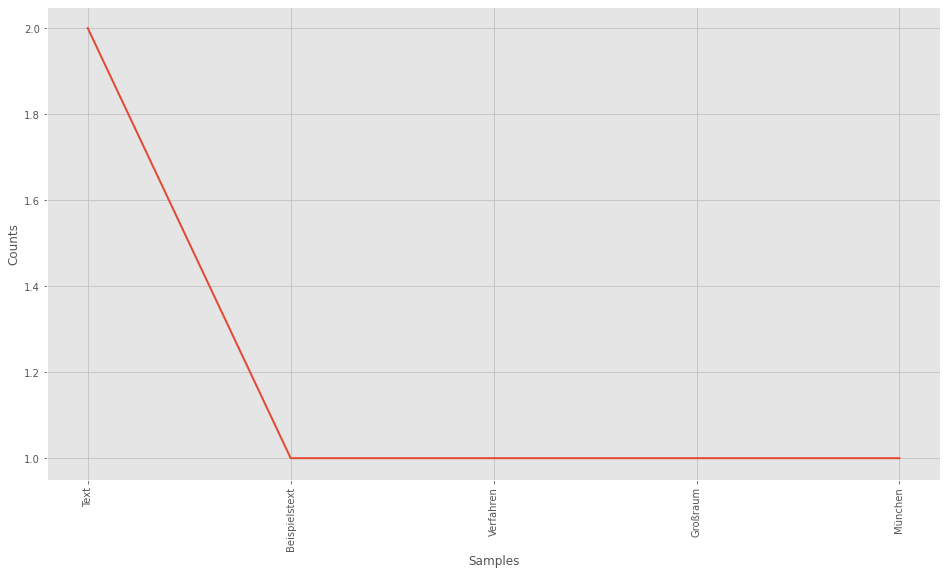

In [46]:
sText = "Das ist ein Beispielstext. An diesem Text werde ich nun einige Verfahren anwenden. Ich komme aus dem Großraum München und ich mag Text."

# Token Text
print()
print("- Token from text")
print(getTokenFromText(sText))

# Tagging (english)
print()
print("- POS english")
print(nltk.pos_tag(getTokenFromText(sText)))

# Lemma and tagging
print()
print("- Lemma and tagging")
print(getLemmaAndTaggingFromText(sText))
print()

# Freq Nouns
print("- Freq nouns")
plotFreqNouns(sText, outputFilename = "", mostCommon = 10, flagRemoveStopwords = True)

## Meta-Queries

### Type of channels

In [47]:
dfInputFiles.inputType.value_counts()

public_channel       54
public_supergroup     7
Name: inputType, dtype: int64

### Define queries

In [48]:
def queryChatId(filePath):
    dfMeta = dictMeta[filePath].copy()
    return str(dfMeta["id"].iloc[0])

In [49]:
def queryChatName(filePath):
    dfMeta      = dictMeta[filePath].copy()
    chatName    = str(dfMeta["name"].iloc[0])
    chatName    = gloConvertToSafeChatName(chatName)
    return chatName

In [50]:
def queryChatType(filePath):
    dfMeta = dictMeta[filePath].copy()
    return str(dfMeta["type"].iloc[0])

In [51]:
def queryNumberOfMessages(filePath):
    dfMessages = dictMessages[filePath].copy()
    return len(dfMessages.index)

In [52]:
def queryNumberOfMessagesByAttEqTrue(filePath, attKey):
    dfMessages = dictMessages[filePath].copy()
    dfMessages = dfMessages[dfMessages[attKey] == True]
    return len(dfMessages.index)

### Execute queries

In [53]:
dfQueryMeta = pd.DataFrame(dfInputFiles.inputPath)

dfQueryMeta["qryChatId"]                        = dfQueryMeta.inputPath.apply(queryChatId)
dfQueryMeta["qryChatName"]                      = dfQueryMeta.inputPath.apply(queryChatName)
dfQueryMeta["qryChatType"]                      = dfQueryMeta.inputPath.apply(queryChatType)
dfQueryMeta["qryNumberOfMessages"]              = dfQueryMeta.inputPath.apply(queryNumberOfMessages)

dfQueryMeta["qryNumberOfFormattedTextMessages"] = dfQueryMeta.apply(lambda x: queryNumberOfMessagesByAttEqTrue(x.inputPath, "procIsJsonFormatted"), axis=1)

dfQueryMeta["qryNumberOfValidTextMessages"]     = dfQueryMeta.apply(lambda x: queryNumberOfMessagesByAttEqTrue(x.inputPath, "procEvalIsValidText"), axis=1)

dfQueryMeta["qryNumberOfPhotos"]                = dfQueryMeta.apply(lambda x: queryNumberOfMessagesByAttEqTrue(x.inputPath, "procEvalContainsPhoto"), axis=1)
dfQueryMeta["qryNumberOfFiles"]                 = dfQueryMeta.apply(lambda x: queryNumberOfMessagesByAttEqTrue(x.inputPath, "procEvalContainsFile"), axis=1)
dfQueryMeta["qryNumberOfEditedMessages"]        = dfQueryMeta.apply(lambda x: queryNumberOfMessagesByAttEqTrue(x.inputPath, "procEvalIsEdited"), axis=1)
dfQueryMeta["qryNumberOfForwardedMessages"]     = dfQueryMeta.apply(lambda x: queryNumberOfMessagesByAttEqTrue(x.inputPath, "procEvalIsForwarded"), axis=1)

dfQueryMeta["qryNumberOfMessagesWithUrl"]           = dfQueryMeta.apply(lambda x: queryNumberOfMessagesByAttEqTrue(x.inputPath, "procEvalContainsUrl"), axis=1)
dfQueryMeta["qryNumberOfMessagesWithHashtag"]       = dfQueryMeta.apply(lambda x: queryNumberOfMessagesByAttEqTrue(x.inputPath, "procEvalContainsHashtag"), axis=1)
dfQueryMeta["qryNumberOfMessagesWithBold"]          = dfQueryMeta.apply(lambda x: queryNumberOfMessagesByAttEqTrue(x.inputPath, "procEvalContainsBoldItem"), axis=1)
dfQueryMeta["qryNumberOfMessagesWithItalic"]        = dfQueryMeta.apply(lambda x: queryNumberOfMessagesByAttEqTrue(x.inputPath, "procEvalContainsItalicItem"), axis=1)
dfQueryMeta["qryNumberOfMessagesWithUnderline"]     = dfQueryMeta.apply(lambda x: queryNumberOfMessagesByAttEqTrue(x.inputPath, "procEvalContainsUnderlineItem"), axis=1)
dfQueryMeta["qryNumberOfMessagesWithEmail"]         = dfQueryMeta.apply(lambda x: queryNumberOfMessagesByAttEqTrue(x.inputPath, "procEvalContainsEmailItem"), axis=1)
dfQueryMeta["qryNumberOfMessagesWithEmoji"]         = dfQueryMeta.apply(lambda x: queryNumberOfMessagesByAttEqTrue(x.inputPath, "procEvalContainsEmojiItem"), axis=1)

dfQueryMeta.sort_values(by="qryNumberOfMessages", ascending=False)

,inputPath,qryChatId,qryChatName,qryChatType,qryNumberOfMessages,qryNumberOfFormattedTextMessages,qryNumberOfValidTextMessages,qryNumberOfPhotos,qryNumberOfFiles,qryNumberOfEditedMessages,qryNumberOfForwardedMessages,qryNumberOfMessagesWithUrl,qryNumberOfMessagesWithHashtag,qryNumberOfMessagesWithBold,qryNumberOfMessagesWithItalic,qryNumberOfMessagesWithUnderline,qryNumberOfMessagesWithEmail,qryNumberOfMessagesWithEmoji
58,DS-05-01-2021a/ChatExport_2021-01-05-freiheits...,9717909816,FREIHEITSCHAT,public_supergroup,377365,123812,235352,51116,37522,5091,106025,103022,5749,25797,6167,1049,563,84551
60,DS-05-01-2021a/ChatExport_2021-01-05-freiheits...,9943834900,FREIHEITSCHAT BLITZ,public_supergroup,125958,31109,105907,13878,9815,2031,27838,22713,1313,10444,2929,130,141,29697
100,DS-13-01-2021/ChatExport_2021-01-13-querdenken089,10025647074,Querdenken 089 MUeNCHEN Disk,public_supergroup,82446,26354,66070,10901,7213,2240,23087,24412,1416,5328,1579,244,368,20262
66,DS-05-01-2021a/ChatExport_2021-01-05-einzelfal...,9834356947,Einzelfallinfos,public_channel,51130,51093,51101,0,0,6627,0,50911,46867,0,0,0,0,75
106,DS-13-01-2021/ChatExport_2021-01-13-querdenken69,9906959218,Querdenken 69 FRANKFURT Disk,public_supergroup,47029,10385,41358,3343,2584,1420,7366,9644,586,1964,688,131,123,11739
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55,DS-05-01-2021a/ChatExport_2021-01-05-laserLurch,10077326081,Laser Lurch,public_channel,446,316,351,184,106,198,103,255,12,129,28,6,0,276
72,DS-05-01-2021a/ChatExport_2021-01-05-coronaFakten,9968282240,CoronaFakten,public_channel,372,318,331,74,100,190,45,300,55,272,265,1,3,240
107,DS-13-01-2021/ChatExport_2021-01-13-querdenken...,9991668824,Querdenken 69 Frankfurt Info,public_channel,295,164,226,78,37,64,69,111,21,51,12,5,7,129
101,DS-13-01-2021/ChatExport_2021-01-13-querdenken...,9864889937,QUERDENKEN 591 Emsland INFOK,public_channel,228,116,145,66,28,3,129,96,1,34,4,1,2,65


### Plot meta queries

In [54]:
# Auto label query plot
def autolabelAx(rects, ax):
    """
    Attach a text label above each bar in *rects*, displaying its height.
    Copied from https://matplotlib.org/3.1.1/gallery/lines_bars_and_markers/barchart.html (22.12.2020)
    """
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [55]:
# param inputDescFilter set "" == no filter
# param outputFilename set "" = no output
def queryMetaPlotter(inputDescFilter, configPlotWidth, configPlotHeight, configBarWidth, outputFilename):
    # Init data
    dataLabels                          = list()
    dataNumberOfMesssages               = list()
    dataNumberOfFormattedTextMessages   = list()
    dataNumberOfValidTextMessages       = list()
    dataNumberOfEditedMessages          = list()
    dataNumberOfForwardedMessages       = list()
    dataNumberOfPhotos                  = list()
    dataNumberOfFiles                   = list()
    dataNumberOfMessagesWUrl            = list()
    dataNumberOfMessagesWHashtag        = list()
    dataNumberOfMessagesWBold           = list()
    dataNumberOfMessagesWItalic         = list()
    dataNumberOfMessagesWUnderline      = list()
    dataNumberOfMessagesWEmail          = list()
    dataNumberOfMessagesWEmoji          = list()

    # Iterate over Meta DataFrame
    for index, row in dfQueryMeta.sort_values(by="qryNumberOfMessages", ascending=False).iterrows():

        # Get attributes (check filter)
        if(inputDescFilter == "" or dfInputFiles[dfInputFiles.inputPath == row.inputPath].inputDesc.iloc[0] == inputDescFilter):
            dataLabels                          .append(row.qryChatName)
            dataNumberOfMesssages               .append(row.qryNumberOfMessages)
            dataNumberOfFormattedTextMessages   .append(row.qryNumberOfFormattedTextMessages)
            dataNumberOfValidTextMessages       .append(row.qryNumberOfValidTextMessages)
            dataNumberOfEditedMessages          .append(row.qryNumberOfEditedMessages)
            dataNumberOfForwardedMessages       .append(row.qryNumberOfForwardedMessages)
            dataNumberOfPhotos                  .append(row.qryNumberOfPhotos)
            dataNumberOfFiles                   .append(row.qryNumberOfFiles)
            dataNumberOfMessagesWUrl            .append(row.qryNumberOfMessagesWithUrl)
            dataNumberOfMessagesWHashtag        .append(row.qryNumberOfMessagesWithHashtag)
            dataNumberOfMessagesWBold           .append(row.qryNumberOfMessagesWithBold)
            dataNumberOfMessagesWItalic         .append(row.qryNumberOfMessagesWithItalic)
            dataNumberOfMessagesWUnderline      .append(row.qryNumberOfMessagesWithUnderline)
            dataNumberOfMessagesWEmail          .append(row.qryNumberOfMessagesWithEmail)
            dataNumberOfMessagesWEmoji          .append(row.qryNumberOfMessagesWithEmoji)

    # Convert list to array
    dataLabels                          = np.array(dataLabels)
    dataNumberOfMesssages               = np.array(dataNumberOfMesssages)
    dataNumberOfFormattedTextMessages   = np.array(dataNumberOfFormattedTextMessages)
    dataNumberOfValidTextMessages       = np.array(dataNumberOfValidTextMessages)
    dataNumberOfEditedMessages          = np.array(dataNumberOfEditedMessages)
    dataNumberOfForwardedMessages       = np.array(dataNumberOfForwardedMessages)
    dataNumberOfPhotos                  = np.array(dataNumberOfPhotos)
    dataNumberOfFiles                   = np.array(dataNumberOfFiles)
    dataNumberOfMessagesWUrl            = np.array(dataNumberOfMessagesWUrl)
    dataNumberOfMessagesWHashtag        = np.array(dataNumberOfMessagesWHashtag)
    dataNumberOfMessagesWBold           = np.array(dataNumberOfMessagesWBold)
    dataNumberOfMessagesWItalic         = np.array(dataNumberOfMessagesWItalic)
    dataNumberOfMessagesWUnderline      = np.array(dataNumberOfMessagesWUnderline)
    dataNumberOfMessagesWEmail          = np.array(dataNumberOfMessagesWEmail)
    dataNumberOfMessagesWEmoji          = np.array(dataNumberOfMessagesWEmoji)

    # Draw
    with sns.color_palette("tab10", 11):
        fig, ax = plt.subplots()
    x = np.arange(len(dataLabels))

    barWidth = configBarWidth

    fig.set_figwidth(configPlotWidth)
    fig.set_figheight(configPlotHeight)

    r1 = x
    r2 = [x + barWidth for x in r1]
    r3 = [x + barWidth for x in r2]
    r4 = [x + barWidth for x in r3]
    r5 = [x + barWidth for x in r4]
    r6 = [x + barWidth for x in r5]
    r7 = [x + barWidth for x in r6]
    r8 = [x + barWidth for x in r7]
    r9 = [x + barWidth for x in r8]
    r10 = [x + barWidth for x in r9]
    r11 = [x + barWidth for x in r10]
    r12 = [x + barWidth for x in r11]
    r13 = [x + barWidth for x in r12]
    r14 = [x + barWidth for x in r13]

    rects1 = ax.bar(r1, dataNumberOfMesssages, barWidth, label='Messages')
    rects2 = ax.bar(r2, dataNumberOfFormattedTextMessages, barWidth, label='Formatted Messsages')
    rects3 = ax.bar(r3, dataNumberOfValidTextMessages, barWidth, label='Valid Text Messages')
    rects4 = ax.bar(r4, dataNumberOfEditedMessages, barWidth, label='Edited Messages')
    rects5 = ax.bar(r5, dataNumberOfForwardedMessages, barWidth, label='Forwarded Messages')
    rects6 = ax.bar(r6, dataNumberOfPhotos, barWidth, label='with Photo')
    rects7 = ax.bar(r7, dataNumberOfFiles, barWidth, label='with File')
    rects8 = ax.bar(r8, dataNumberOfMessagesWUrl, barWidth, label='with Url')
    rects9 = ax.bar(r9, dataNumberOfMessagesWHashtag, barWidth, label='with Hashtag')
    rects10 = ax.bar(r10, dataNumberOfMessagesWBold, barWidth, label='with Bold Items')
    rects11 = ax.bar(r11, dataNumberOfMessagesWItalic, barWidth, label='with Italic Items')
    rects12 = ax.bar(r12, dataNumberOfMessagesWUnderline, barWidth, label='with Underlined Items')
    rects13 = ax.bar(r13, dataNumberOfMessagesWEmail, barWidth, label='with E-Mails')
    rects14 = ax.bar(r14, dataNumberOfMessagesWEmoji, barWidth, label='with Emojis')

    chartTitle = ""
    if(inputDescFilter != ""):
        chartTitle = " (" + inputDescFilter + ")"

    ax.set_ylabel("Number of")
    ax.set_title("Meta Overview" + chartTitle)
    ax.set_xticks(x)
    ax.set_xticklabels(dataLabels)
    ax.legend()

    rects = [rects1, rects2, rects3, rects4, rects5, rects6, rects7, rects8, rects9, rects10, rects11, rects12, rects13, rects14]

    for rect in rects:
        autolabelAx(rect, ax)

    fig.tight_layout()

    #plt.xticks(rotation=30)
    
    if(outputFilename != ""):
        plt.savefig(dir_var_output + outputFilename)
    
    plt.show()

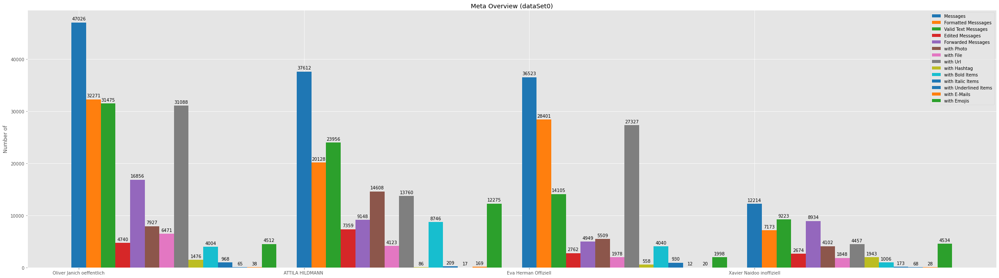

In [56]:
queryMetaPlotter(
    inputDescFilter = "dataSet0",
    configPlotWidth = 32,
    configPlotHeight = 9,
    configBarWidth = 0.065,
    outputFilename = "meta-overview-dataSet0.svg"
)

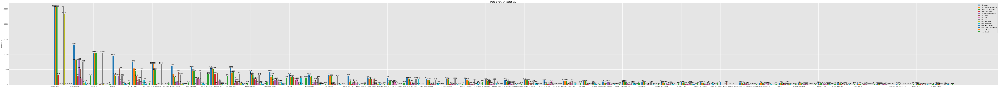

In [57]:
if("dataSet1" in C_LOAD_DATASET):
    queryMetaPlotter(
        inputDescFilter = "dataSet1",
        configPlotWidth = 100,
        configPlotHeight = 9,
        configBarWidth = 0.065,
        outputFilename = "meta-overview-dataSet1.svg"
    )

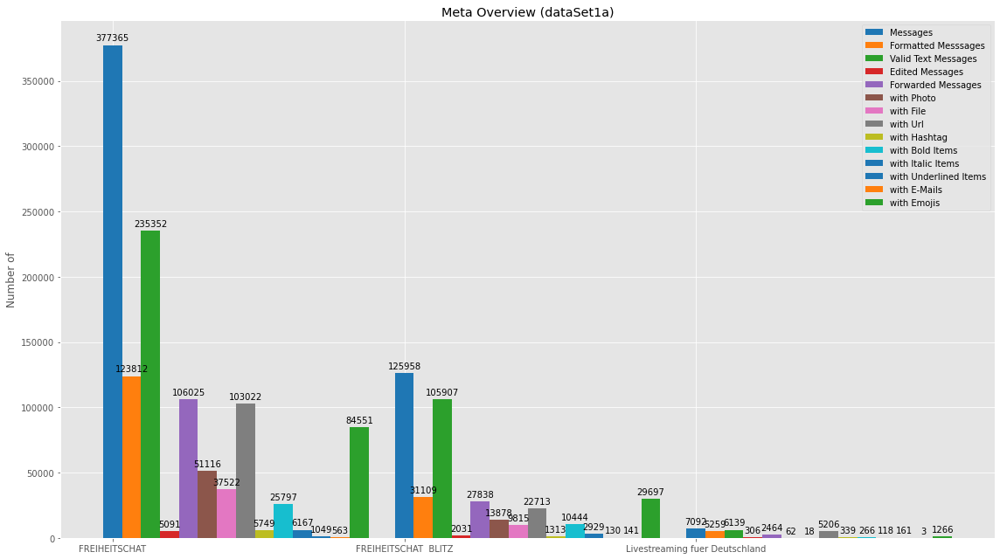

In [58]:
if("dataSet1a" in C_LOAD_DATASET):
    queryMetaPlotter(
        inputDescFilter = "dataSet1a",
        configPlotWidth = 16,
        configPlotHeight = 9,
        configBarWidth = 0.065,
        outputFilename = "meta-overview-dataSet1a.svg"
    )

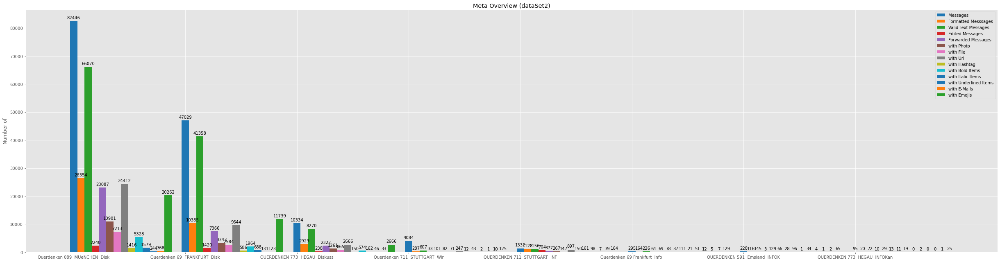

In [59]:
if("dataSet2" in C_LOAD_DATASET):
    queryMetaPlotter(
        inputDescFilter = "dataSet2",
        configPlotWidth = 34,
        configPlotHeight = 9,
        configBarWidth = 0.065,
        outputFilename = "meta-overview-dataSet2.svg"
    )

### Get text-length

In [60]:
def removeTextLengthOutliersFromDataFrame(df, interval, maxTextLength):
    df = df.copy()
    df = df[df.procTDTextLength < maxTextLength]
    # https://stackoverflow.com/questions/23199796/detect-and-exclude-outliers-in-pandas-data-frame
    # keep only the ones that are within <interval> to -<interval> standard deviations in the column 'Data'.
    return df[np.abs(df.procTDTextLength-df.procTDTextLength.mean()) <= (interval*df.procTDTextLength.std())]

In [61]:
# param outputFilename set "" == no output file
def textLengthHistPlotter(outputFilename):
    dfMessages = dfAllDataMessages.copy()
    print("Number of all messages:\t\t\t\t\t\t" + str(len(dfMessages.index)))

    dfMessages = dfMessages[dfMessages.procEvalIsValidText == True]
    print("Number of valid text messages:\t\t\t\t\t" + str(len(dfMessages.index)))

    dfMessages = removeTextLengthOutliersFromDataFrame(
        dfMessages,
        interval = 3,               #Default is 3
        maxTextLength = 999999999   #TODO: Maybe enable max text length
        )
    print("Number of valid text messages (after outliers filtering):\t" + str(len(dfMessages.index)))

    print()
    print("Text Length Hist (after outliers filtering)")
    plt.figure(figsize=(8,4.5))
    _ = dfMessages.procTDTextLength.hist(bins=40)
    plt.title('Histogram Text Length')

    if(outputFilename != ""):
        plt.savefig(dir_var_output + outputFilename)

Number of all messages:						1088996

Number of valid text messages:					769404

Number of valid text messages (after outliers filtering):	753309

Text Length Hist (after outliers filtering)

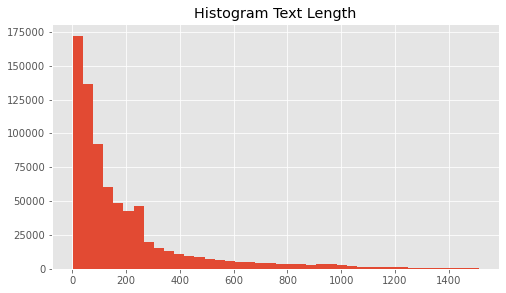

In [62]:
textLengthHistPlotter(outputFilename = "meta-text-length-hist.svg")

### Compare ids and labels (has chat name changed?)

In [63]:
def compareIdsAndLabels(df):

    gloStartStopwatch("Compare ids and labels")

    dictFromTranslator  = {}
    dictActorTranslator = {}

    df = df.copy()
    df["date"] = pd.to_datetime(df["date"])
    
    df = df.set_index("date")
    df = df.sort_index()

    for index, row in df.iterrows():
        
        n_from      = row["from"]
        n_from_id   = row["from_id"]

        n_from = str(n_from)
        n_from_id = str(n_from_id)

        n_actor      = row["actor"]
        n_actor_id   = row["actor_id"]

        n_actor = str(n_actor)
        n_actor_id = str(n_actor_id)

        if(str(n_from) != "nan"):
            if(n_from_id not in dictFromTranslator):
                # Add new key
                dictFromTranslator[n_from_id] = [n_from]
            else:
                # Has changed?
                oValueL = dictFromTranslator[n_from_id]
                if(n_from not in oValueL):
                    newList = oValueL.copy()
                    newList.append(n_from)
                    print("- Add changed attribute in from (prev=" + str(oValueL) + "/new=" + str(newList) + ")")
                    dictFromTranslator[n_from_id] = newList

        if(str(n_actor) != "nan"):
            if(n_actor_id not in dictActorTranslator):
                # Add new key
                dictActorTranslator[n_actor_id] = [n_actor]
            else:
                # Has changed?
                oValueL = dictActorTranslator[n_actor_id]
                if(n_actor not in oValueL):
                    newList = oValueL.copy()
                    newList.append(n_actor)
                    print("- Add changed attribute in actor (prev=" + str(oValueL) + "/new=" + str(newList) + ")")
                    dictActorTranslator[n_actor_id] = newList

    gloStopStopwatch("Compare ids and labels")

    return dictFromTranslator

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [64]:
if(C_SHORT_RUN == False):
    compareIdsAndLabels(dfAllDataMessages)

[Stopwatch started >>Compare ids and labels<<]

- Add changed attribute in actor (prev=['Victor Schurk']/new=['Victor Schurk', 'Heinrich Gruber'])

- Add changed attribute in actor (prev=['None']/new=['None', 'Lene Pepp'])

- Add changed attribute in actor (prev=['💔kid']/new=['💔kid', '🛸'])

- Add changed attribute in actor (prev=['Susanne Kaußen']/new=['Susanne Kaußen', 'Susanne'])

- Add changed attribute in actor (prev=['@Rizi']/new=['@Rizi', '@Fretchen'])

- Add changed attribute in from (prev=['Dea51 https://fotofeier.eu']/new=['Dea51 https://fotofeier.eu', 'Dea51 https://t.me/gruppekoelnstehtauf'])

- Add changed attribute in from (prev=['I_wear_Bommel']/new=['I_wear_Bommel', 'Bommel089'])

- Add changed attribute in actor (prev=['VEGANNE']/new=['VEGANNE', 'Anne Bringmann'])

- Add changed attribute in from (prev=['Doris Schneider']/new=['Doris Schneider', 'Doris'])

- Add changed attribute in from (prev=['@onlinedschungelbuch']/new=['@onlinedschungelbuch', '@hakunamatata'])

- Add changed attribute in actor (prev=["Andre von Siegfried (Yor de'u Pan)"]/new=["Andre von Siegfried (Yor de'u Pan)", "Yor de'u Pan (Andre von Siegfried)"])

- Add changed attribute in from (prev=['D D']/new=['D D', 'Daniel'])

- Add changed attribute in from (prev=['Der Thüringer👌💥💥🚨🚨🚨']/new=['Der Thüringer👌💥💥🚨🚨🚨', 'Der Thüringer👌'])

- Add changed attribute in from (prev=['Wunder']/new=['Wunder', 'Truth'])

- Add changed attribute in from (prev=['Manu']/new=['Manu', 'M@nu G.'])

- Add changed attribute in from (prev=['su k.']/new=['su k.', 'sudjava k.'])

- Add changed attribute in from (prev=['Millli D']/new=['Millli D', 'Hanne D'])

- Add changed attribute in from (prev=['Gabi']/new=['Gabi', 'Mexxle'])

- Add changed attribute in from (prev=['Andreas Tatsch 🖤🤍❤️']/new=['Andreas Tatsch 🖤🤍❤️', 'Andreas T 🖤🤍❤️'])

- Add changed attribute in from (prev=['O. K.']/new=['O. K.', 'Kapsalaki'])

- Add changed attribute in from (prev=['Jane Doe']/new=['Jane Doe', '404 Network unavailable'])

- Add changed attribute in from (prev=['Ronny Shakiro']/new=['Ronny Shakiro', 'Manfred'])

- Add changed attribute in from (prev=['Annie 83✌️']/new=['Annie 83✌️', 'Annie 81✌️'])

- Add changed attribute in from (prev=['Sascha Kutsch']/new=['Sascha Kutsch', 'JSK'])

- Add changed attribute in from (prev=['Andi']/new=['Andi', 'AW'])

- Add changed attribute in from (prev=['Timm']/new=['Timm', 'Tim'])

- Add changed attribute in from (prev=['Westfront36']/new=['Westfront36', 'M. R.'])

- Add changed attribute in from (prev=["Ronny's Popshow 🐒"]/new=["Ronny's Popshow 🐒", 'Hirsenronsen'])

- Add changed attribute in from (prev=['Der Eventmanager']/new=['Der Eventmanager', 'Henker der Lumpen'])

- Add changed attribute in from (prev=['MARKUS SÖDER']/new=['MARKUS SÖDER', 'BATMAN'])

- Add changed attribute in from (prev=['Kamil A.']/new=['Kamil A.', 'None'])

- Add changed attribute in from (prev=['Gisela']/new=['Gisela', 'Apfelsaft Naturtrüb'])

- Add changed attribute in from (prev=['Markkus']/new=['Markkus', 'Markus'])

- Add changed attribute in from (prev=['Andreas Werner']/new=['Andreas Werner', 'Andrea S'])

- Add changed attribute in from (prev=['Victor Schurk']/new=['Victor Schurk', 'Heinrich Gruber'])

- Add changed attribute in from (prev=['ME Night']/new=['ME Night', 'Dario Zaza'])

- Add changed attribute in from (prev=['RJ']/new=['RJ', 'Rosa'])

[Stopwatch stopped >>Compare ids and labels<< (139.658s)]

## Extract Social Graph Data

In [65]:
def extractImportantHashtags(df):
    dfMessages = df.copy()
    dfMessages = dfMessages[dfMessages.procEvalContainsHashtag == True]

    hashTagList = list()
    for index, row in dfMessages.iterrows():
        for hashtagItem in row["procTDHashtags"]:
            hashTagList.append(hashtagItem)

    return hashTagList

In [66]:
# return combinations
def extractImportantEmojis(df):

    dfMessages = df.copy()
    dfMessages = dfMessages[dfMessages.procEvalContainsEmojiItem == True]

    li = dfMessages.procTDEmojisDesc.values.tolist()

    retLi = list()

    for l in li:
        aString = ""
        for e in l:
            aString = aString + ":" + e 
        retLi.append(aString)

    return retLi

In [67]:
# param flagResolveNewUrls  Flag (see config above)

def resolveUrl(completeUrl, flagResolveNewUrls):
    
    if "bit.ly" in completeUrl:

        if(gloCheckIsAlreadyCached("resolved-urls.csv", completeUrl)):
            return gloGetCached("resolved-urls.csv", completeUrl)
        else:

            if(flagResolveNewUrls == False):
                return completeUrl

            print("(Resolve now >>" + completeUrl + "<<)")
            try:
                r = requests.get(completeUrl, timeout = 5)
                u = r.url
                gloAddToCache("resolved-urls.csv", completeUrl, u)
                return u
            except:
                print("(- Warn: Can not resolve (return completeUrl))")
                return completeUrl

    else:
        return completeUrl

In [68]:
# Return
# a = urlList,
# b = refList
# c = hostList
def extractImportantUrls(df):
    dfMessages = df.copy()
    dfMessages = dfMessages[dfMessages.procEvalContainsUrl == True]

    hostList        = list()
    urList          = list()
    refList         = list()

    counterSucHostname = 0
    counterErrHostname = 0

    for index, row in dfMessages.iterrows():
        for urlItem in row["procTDURLs"]:
            
            urlData = urlparse(str(urlItem))

            completeUrl      = urlData.geturl()

            rUrl     = resolveUrl(completeUrl, flagResolveNewUrls=C_RESOLVE_NEW_URLS)
            rUrlData = urlparse(rUrl)
            rCompleteUrl = rUrlData.geturl()
            rCompleteHostname = rUrlData.hostname

            if(str(rCompleteHostname) != "None"):
                counterSucHostname = counterSucHostname + 1

                hostList.append(str(rCompleteHostname))

                urList.append(str(rCompleteUrl))

                if "t.me" in str(rCompleteHostname):
                    refList.append(str(rCompleteUrl))
            else:
                counterErrHostname = counterErrHostname + 1

    print("Got Hostnames (suc=" + str(counterSucHostname) + "/err=" + str(counterErrHostname) + ")")

    return (urList, refList, hostList)

In [69]:
# param flagResolveNewUrls  Flag (see config above)
def resolveImportantYoutubeVideos(urlList, flagResolveNewUrls):

    # Thanks https://gist.github.com/rodrigoborgesdeoliveira/987683cfbfcc8d800192da1e73adc486

    ytList = list()

    for url in urlList:

        url = str(url)

        if("youtube.com" in url or "youtu.be" in url or "youtube-nocookie.com" in url):
            if(gloCheckIsAlreadyCached("resolved-youtube.csv", url)):
                ytList.append(gloGetCached("resolved-youtube.csv", url)) 
            else:

                if(flagResolveNewUrls == False):
                    print("(Disable resolve new youtube urls (return completeUrl) >>" + url + "<<)")
                    ytList.append(url)
                else:
                    print("Resolve now youtube >>" + url + "<<")
                    try:
                        r = requests.get(url, timeout = 5)
                        t = fromstring(r.content)
                        a = str(t.findtext('.//title'))
                        ytList.append(a)
                        gloAddToCache("resolved-youtube.csv", url, a)
                    except:
                        print("(- Warn: Can not resolve youtube url (return completeUrl))")
                        ytList.append(url)

    return ytList

In [70]:
# TODO: Bug: No Hostname detected if string startsWith ! "http" in urlparse
# TODO: Check: Refs ins both directions

# Returns
# a = Counter forwardedFromList
# b = Counter refList
# c = Counter hashtagList
# d = Counter hostList
# e = Counter emojiList
# f = Counter fromList
def extractSocialGraph(filePath, debugPrint, debugPrintCount):

    dfMessages = dictMessages[filePath].copy()

    hashtagList = extractImportantHashtags(dfMessages)
    emojiList = extractImportantEmojis(dfMessages)

    urlList, refList, hostList = extractImportantUrls(dfMessages)

    ytList = resolveImportantYoutubeVideos(urlList, flagResolveNewUrls = C_RESOLVE_NEW_URLS)
            
    forwardedFromList = list()
    if("forwarded_from" in dfMessages.columns):
        df = dfMessages.copy()
        df = df[df.procEvalIsForwarded == True]
    
        for index, row in df.iterrows():        
            forwardedFromList.append(str(row["forwarded_from"]))
            
    actorList = list()
    if("actor" in dfMessages.columns):
        for index, row in dfMessages.iterrows():
            actorList.append(str(row["actor"]))
    
    memberList = list()
    if("members" in dfMessages.columns):
        for index, row in dfMessages.iterrows():
            if(str(row["members"]) != "nan"):
                for memberItem in row["members"]:
                    memberList.append(str(memberItem))
                    
    fromList = list()
    if("from" in dfMessages.columns):
        for index, row in dfMessages.iterrows():
            s = str(row["from"])
            s = gloConvertToSafeString(s)
            if(s != "None"):
                fromList.append(s)
            
    savedFromList = list()
    if("saved_from" in dfMessages.columns):
        for index, row in dfMessages.iterrows():
            savedFromList.append(str(row["saved_from"]))

    configTopN = debugPrintCount

    if(debugPrint):

        print()
        print("Set top n to " + str(debugPrintCount))
        print()

        print("- Top Hosts (resovled) -")
        print ("\n".join(map(str, Counter(hostList).most_common(configTopN))))
        print()
        print("- Top URLs (resolved) -")
        print ("\n".join(map(str, Counter(urlList).most_common(configTopN))))
        print()
        print("- Top Refs from text (resolved) -")
        print ("\n".join(map(str, Counter(refList).most_common(configTopN))))
        print()
        print("- Top Refs (forwarded_from) -")
        print ("\n".join(map(str, Counter(forwardedFromList).most_common(configTopN))))
        print()
        print("- Top Refs (actor) -")
        print ("\n".join(map(str, Counter(actorList).most_common(configTopN))))
        print()
        print("- Top Refs (members) -")
        print ("\n".join(map(str, Counter(memberList).most_common(configTopN))))
        print()
        print("- Top Refs (from) -")
        print ("\n".join(map(str, Counter(fromList).most_common(configTopN))))
        print()
        print("- Top Refs (saved_from) -")
        print ("\n".join(map(str, Counter(savedFromList).most_common(configTopN))))
        print()
        print("- Top hashtags -")
        print ("\n".join(map(str, Counter(hashtagList).most_common(configTopN))))
        print()
        print("- Top emojis -")
        print ("\n".join(map(str, Counter(emojiList).most_common(configTopN))))
        print()
        print("- Top yt (resolved) -")
        print ("\n".join(map(str, Counter(ytList).most_common(configTopN))))
        print()
    
    return (Counter(forwardedFromList), Counter(refList), Counter(hashtagList),  Counter(hostList), Counter(emojiList), Counter(fromList))

In [71]:
def printSocialGraphDebug(filePathList):
    for fP in filePathList:
        print("Analyse now >>" + fP + "<<")
        _ = extractSocialGraph(fP, debugPrint=True, debugPrintCount=10)

In [72]:
if(C_SHORT_RUN == False):
    printSocialGraphDebug(dfInputFiles[dfInputFiles.inputDesc == "dataSet0"].inputPath)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<

Got Hostnames (suc=14657/err=1129)

Set top n to 10

- Top Hosts (resovled) -

('youtu.be', 3668)
('t.me', 1523)
('www.youtube.com', 705)
('www.bitchute.com', 364)
('www.n-tv.de', 321)
('www.attilahildmann.de', 265)
('www.welt.de', 229)
('www.spiegel.de', 226)
('demos.whattheyhide.org', 203)
('amzn.to', 174)

- Top URLs (resolved) -

('https://www.attilahildmann.de/de/shop/alle.html?pc=SAMURAI', 163)
('https://demo.terminkalender.top/pc.php', 116)
('https://www.youtube.com/watch', 108)
('https://t.me/FREIHEITS_CHAT_BL', 95)
('https://youtu.be/kWpzfqW34lA', 72)
('https://www.bitchute.com/video/5izjzGo5AyBw/', 70)
('https://t.me/FREIHEITSCHAT2020', 67)
('https://t.me/FreiheitsChatDE', 65)
('https://demos.whattheyhide.org/add', 49)
('https://t.me/ATTILAHILDMANN', 41)

- Top Refs from text (resolved) -

('https://t.me/FREIHEITS_CHAT_BL', 95)
('https://t.me/FREIHEITSCHAT2020', 67)
('https://t.me/FreiheitsChatDE', 65)
('https://t.me/ATTILAHILDMANN', 41)
('https://t.me/ChatDerFreiheit', 39)
('https://t.me/gerechtigkeitfuersvaterland', 37)
('https://t.me/MICHAELWENDLEROFFICIAL', 34)
('https://t.me/DEMOKRATENCHAT', 32)
('https://t.me/joinchat/QkdDr0M7iThEkCRt_KhBpw', 32)
('https://t.me/DAUMENRUNTERBLITZKRIEG', 31)

- Top Refs (forwarded_from) -

('ATTILA HILDMANN ⚫️⚪️🔴⚔️', 7448)
('Gerechtigkeit für das Vaterland', 616)
('Aktuelle Karikaturen - Götz Wiedenroth - Illustrationen, Cartoons', 44)
('𝕯𝖗. 𝕳𝖊𝖎𝖓𝖗𝖎𝖈𝖍 𝕱𝖎𝖊𝖈𝖍𝖙𝖓𝖊𝖗 𝕴𝖓𝖋𝖔𝖐𝖆𝖓𝖆𝖑', 41)
('Anonymous Germany', 38)
('MICHAEL WENDLER 🚨', 34)
('Oliver Janich öffentlich', 33)
('Laser Lurch', 28)
('Dawid Snowden', 28)
('Ken Jebsen - Aufklärung und Information', 26)

- Top Refs (actor) -

('nan', 37592)
('ATTILA HILDMANN ⚫️⚪️🔴⚔️', 20)

- Top Refs (members) -

- Top Refs (from) -

('ATTILA HILDMANN ', 37592)
('nan', 20)

- Top Refs (saved_from) -

('nan', 37612)

- Top hashtags -

('Kontakt', 14)
('AHMEMO', 9)
('Antifa', 9)
('Attila', 9)
('Hildmann', 9)
('Demonstration', 9)
('Leipzig1912', 9)
('netzfund', 3)
('Netzfund', 3)
('WIRMACHENAUF', 3)

- Top emojis -

(':wolf', 1605)
(':play button', 693)
(':cross mark', 573)
(':eagle', 259)
(':grinning squinting face', 250)
(':grinning squinting face:grinning squinting face:grinning squinting face', 212)
(':cross mark:wolf:crossed swords', 180)
(':red exclamation mark:red exclamation mark:wolf', 171)
(':crossed swords', 151)
(':green heart', 125)

- Top yt (resolved) -

(' - YouTube', 1394)
('YouTube', 108)
('Prof. Stefan Hockertz warnt vor millionenfach vorsÃ¤tzlicher KÃ¶rperverletzung | VÃ\x96: 17.07.2020 - YouTube', 73)
('Tod im Labor - Warum Tierversuche sinnlos sind - YouTube', 25)
('Attila Hildmann redet wie Adolf Hitler - YouTube', 22)
('DER PERFIDE PLAN DES WORLD ECONOMIC FORUM - YouTube', 21)
('Der Glaube an die groÃ\x9fe VerschwÃ¶rung: Was steckt dahinter? | stern TV - YouTube', 21)
('UPDATE mRNA-Impfung: Wo sind die validen Studien? | VÃ\x96: 28.11.2020 - YouTube', 18)
('INFERNO Exklusiv Trailer German Deutsch (2016) - YouTube', 16)
('GATES STATE - Inoffizieller Trailer 2020 - YouTube', 15)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<

Got Hostnames (suc=36481/err=940)

Set top n to 10

- Top Hosts (resovled) -

('twitter.com', 2777)
('www.youtube.com', 2768)
('youtu.be', 2018)
('t.me', 1809)
('www.journalistenwatch.com', 1672)
('www.bild.de', 1336)
('www.welt.de', 1132)
('www.focus.de', 1080)
('www.epochtimes.de', 933)
('t.co', 865)

- Top URLs (resolved) -

('https://t.me/SchubertsLM', 152)
('https://t.me/Corona_Fakten', 144)
('https://t.me/coronainformationskanal', 118)
('http://paypal.me/coronafaktenoriginal', 79)
('https://t.me/Corona_Fakten/242', 65)
('https://www.bitchute.com/channel/pIFLS0LFMHHm/', 47)
('http://www.expresszeitung.com/?atid=58', 41)
('https://lbry.tv/@KulturstudioTV', 40)
('https://shop.expresszeitung.com/shop/shop/alle-ausgaben/ausgabe_33.html?atid=58', 24)
('https://t.me/epochtimesde', 22)

- Top Refs from text (resolved) -

('https://t.me/SchubertsLM', 152)
('https://t.me/Corona_Fakten', 144)
('https://t.me/coronainformationskanal', 118)
('https://t.me/Corona_Fakten/242', 65)
('https://t.me/epochtimesde', 22)
('https://t.me/TranslatedVideos', 21)
('https://t.me/CheckMateNews', 20)
('https://t.me/Haintz', 17)
('https://t.me/ConnectivEvents', 15)
('https://t.me/Kulturstudio', 15)

- Top Refs (forwarded_from) -

('Kulturstudio.tv', 1211)
('Jouwatch', 1140)
('Eva Herman Offiziell', 974)
('Der Waldgang', 786)
('Einzelfallinfos', 759)
('Qlobal-Change 🇩🇪🇦🇹🇨🇭🇱🇮', 661)
('ExpressZeitung', 635)
('1984 - Das Magazin', 577)
('Oliver Janich Premium', 554)
("'ForscherGeist'", 421)

- Top Refs (actor) -

('nan', 46901)
('Oliver Janich öffentlich', 125)

- Top Refs (members) -

- Top Refs (from) -

('Oliver Janich oeffentlich', 46901)
('nan', 125)

- Top Refs (saved_from) -

('nan', 47026)

- Top hashtags -

('StopLeftDystopia', 108)
('Berlin', 42)
('links', 42)
('Messer', 35)
('Einreise', 32)
('Kosten', 32)
('Justiz', 32)
('Netzfund', 31)
('CoronaKrise', 21)
('Orwell', 19)

- Top emojis -

(':play button', 307)
(':smiling face with sunglasses', 266)
(':beaming face with smiling eyes', 158)
(':right arrow', 153)
(':play button:speech balloon', 129)
(':double exclamation mark:double exclamation mark', 113)
(':face with tears of joy', 84)
(':double exclamation mark', 74)
(':open book', 72)
(':double exclamation mark:double exclamation mark:double exclamation mark', 70)

- Top yt (resolved) -

(' - YouTube', 1894)
('MissverstÃ¤ndnisse zum Klimawandel aufgeklÃ¤rt | Harald Lesch - YouTube', 41)
('Spieltheorie des Lebens | TragÃ¶die des Gemeinguts - YouTube', 14)
('Ist der Klimawandel nicht mehr aufzuhalten? - YouTube', 13)
('None', 12)
('Pupse riechen ist gesund | Schlagzeilen wissenschaftlich gepruÌ\x88ft - YouTube', 10)
('Oliver Janich Vs TJump | Are the Numbers Exaggerated? - YouTube', 10)
('YouTubeTV Reportage: YouTuber wird zum Meerschweinchen! ð\x9f\x90¹ - YouTube', 9)
('Warum auch Tiere den Spieltrieb haben | Quarks - YouTube', 8)
('Klimawandel: Das ist jetzt zu tun! (feat. Rezo) - YouTube', 8)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<

Got Hostnames (suc=27906/err=484)

Set top n to 10

- Top Hosts (resovled) -

('www.youtube.com', 2928)
('www.kopp-verlag.de', 2415)
('www.welt.de', 2173)
('www.epochtimes.de', 1477)
('www.tichyseinblick.de', 1255)
('www.journalistenwatch.com', 1128)
('www.focus.de', 1058)
('www.faz.net', 1027)
('de.sputniknews.com', 950)
('deutsch.rt.com', 895)

- Top URLs (resolved) -

('https://www.kopp-verlag.de/Im-Lichte-der-Wahrheit.htm?websale8=kopp-verlag&pi=B4588822&ci=%24_AddOn_%24&&6=8485245', 102)
('https://amzn.to/2VR6Evg', 77)
('https://www.kopp-verlag.de/a/corona-fehlalarm--3?d=1&&6=8991273', 42)
('https://c.kopp-verlag.de/kopp,verlag_4.html?1=58&3=0&4=&5=&d=https%3A%2F%2Fwww.kopp-verlag.de%2FIm-Lichte-der-Wahrheit.htm%3Fwebsale8%3Dkopp-verlag%26pi%3DB4588822%26ci%3D%2524_AddOn_%2524', 41)
('https://amzn.to/2DhBRzx', 40)
('https://www.kopp-verlag.de/Die-Psychotherapie-der-Hildegard-von-Bingen.htm?websale8=kopp-verlag&pi=A1111467&ci=%24_AddOn_%24&&6=9097013', 38)
('https://www.kopp-verlag.de/a/bedrohung-blackout?&6=9754689', 37)
('https://www.kopp-verlag.de/a/was-ist-hildegard-medizin-?&6=10191515', 32)
('https://www.kopp-verlag.de/a/perfekte-krisenvorsorge?&6=9280658', 31)
('https://www.amazon.de/gp/product/1999021533/ref=as_li_tl?ie=UTF8&camp=1638&creative=6742&creativeASIN=1999021533&linkCode=as2&tag=innovativ6000-21&linkId=9f89b3287edf0eaf07ecc82d7200

- Top Refs from text (resolved) -

('https://t.me/TranslatedVideos', 27)
('https://t.me/epochtimesde', 18)
('https://t.me/coronainformationskanal', 13)
('https://t.me/Corona_Fakten', 9)
('https://t.me/CheckMateNews', 9)
('https://t.me/rabbitresearch', 7)
('https://t.me/s/nuoviso?q=anti-spiegel', 5)
('https://t.me/FriedlicheHandtuchRevolution', 4)
('https://t.me/HaunsiAppmann/1081', 4)
('https://t.me/ExpressZeitung/4162', 3)

- Top Refs (forwarded_from) -

('Eva Herman Offiziell', 2329)
('Oliver Janich öffentlich', 466)
('Pierre Kranz', 276)
('Heiko Schrang', 93)
('Qlobal-Change 🇩🇪🇦🇹🇨🇭🇱🇮', 86)
('🇺🇸 US Wahl 2020 - Live Ticker', 85)
('True Life 🔞', 83)
('Samuel Eckert', 64)
('ExpressZeitung', 63)
('Medienkritik', 57)

- Top Refs (actor) -

('nan', 36053)
('Eva Herman Offiziell', 470)

- Top Refs (members) -

- Top Refs (from) -

('Eva Herman Offiziell', 36053)
('nan', 470)

- Top Refs (saved_from) -

('nan', 36523)

- Top hashtags -

('Abendgebet', 198)
('StabildurchdenWandel', 87)
('abendgebet', 25)
('HildegardvonBingenEH', 20)
('HermanPoppTagesnachricht', 17)
('BlutgeheimnisEH', 14)
('AndreasPoppFinanzfragenWasTun', 9)
('Termin', 5)
('Podcast', 5)
('CoronaAusschuss', 5)

- Top emojis -

(':double exclamation mark:double exclamation mark', 232)
(':folded hands:folded hands:folded hands:folded hands:folded hands:folded hands', 226)
(':double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark', 138)
(':double exclamation mark', 68)
(':double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark:double exclamation mark', 32)
(':eight-spoked asterisk:eight-spoked asterisk:eight-spoked asterisk', 29)
(':play button', 27)
(':double exclamation mark:double exclamation mark:double exclamation mark', 25)
(':four leaf clover:four 

- Top yt (resolved) -

(' - YouTube', 711)
('YouTube', 27)
('NEW: The MSR Guardianâ\x84¢ Purifier - YouTube', 8)
('Angela Merkel und die Neue Weltordnung   4.  Juni 2011   Evangelischer Kirchentag in Dresden - YouTube', 6)
('Der Schweigemarsch - save date: 10.10.2020 BERLIN - YouTube', 6)
('Andreas Gabalier & Xavier Naidoo - A Meinung haben | Live - YouTube', 5)
('A Meinung ham - dahinter stehn Andreas Gabalier & Xavier Naidoo - YouTube', 5)
('Hallelujah....mega unplugged - YouTube', 4)
("Siegfried Fietz singt 'Von guten MÃ¤chten wunderbar geborgen' - YouTube", 4)
('Xavier Naidoo im Interview mit Eva Herman: Wir erleben die letzten AtemzÃ¼ge der BRD - YouTube', 4)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<

Got Hostnames (suc=5455/err=645)

Set top n to 10

- Top Hosts (resovled) -

('youtu.be', 1430)
('t.me', 1053)
('www.youtube.com', 302)
('twitter.com', 268)
('www.facebook.com', 76)
('www.bild.de', 69)
('music.youtube.com', 45)
('www.welt.de', 43)
('www.bundestag.de', 43)
('www.metropolnews.info', 41)

- Top URLs (resolved) -

('https://www.bundestag.de/parlament/plenum/abstimmung/abstimmung?id=698', 43)
('https://t.me/PostAppender_bot', 39)
('https://t.me/coachcecil', 23)
('https://t.me/HaunsiAppmann/1081', 22)
('https://t.me/coronainformationskanal', 18)
('http://t.me/QanonAustria', 16)
('https://traugott-ickeroth.com/liveticker/', 16)
('https://t.me/honkforhopeoffiziell/33', 15)
('https://t.me/honkforhopeoffiziell/19', 15)
('https://t.me/Daniel_Prinz_Offiziell', 13)

- Top Refs from text (resolved) -

('https://t.me/PostAppender_bot', 39)
('https://t.me/coachcecil', 23)
('https://t.me/HaunsiAppmann/1081', 22)
('https://t.me/coronainformationskanal', 18)
('http://t.me/QanonAustria', 16)
('https://t.me/honkforhopeoffiziell/33', 15)
('https://t.me/honkforhopeoffiziell/19', 15)
('https://t.me/Daniel_Prinz_Offiziell', 13)
('https://t.me/LivestreamsFuerDich', 10)
('https://t.me/Demotermine', 9)

- Top Refs (forwarded_from) -

('Xavier(Der VereiNiger)Naidoo😎', 667)
('ATTILA HILDMANN ⚫️⚪️🔴⚔️', 543)
('Der Waldgang', 388)
('Sag es mit Bildern, teilen ausdrücklich erwünscht 👍', 298)
('Oliver Janich öffentlich', 292)
('AugenAuf', 230)
('🌍 Verschwörungen 🌍', 223)
('Flache Erde Deutschland ❤️', 212)
('Eva Herman Offiziell', 198)
('fuf media - Freiheit denken', 185)

- Top Refs (actor) -

('nan', 12192)
('Xavier Naidoo (inoffiziell)🎵🎶', 22)

- Top Refs (members) -

- Top Refs (from) -

('Xavier Naidoo inoffiziell', 12192)
('nan', 22)

- Top Refs (saved_from) -

('nan', 12214)

- Top hashtags -

('oneLove', 1575)
('Metropolnews', 41)
('TEAMHEIMAT', 35)
('honkforhope', 29)
('BRD', 24)
('netzfund', 19)
('USA', 19)
('Trump', 16)
('Wirtschaft', 12)
('Zusendung', 9)

- Top emojis -

(':infinity:red heart:red heart', 512)
(':down arrow:down arrow:down arrow:down arrow:down arrow:down arrow:down arrow:down arrow:down arrow:down arrow:down arrow:sparkles:sparkles:sparkles:sparkles:sparkles:sparkles:sparkles:sparkles:sparkles:sparkles:sparkles', 186)
(':black heart:white heart:red heart', 163)
(':red heart', 153)
(':red heart:red heart:red heart', 94)
(':smiling face with halo', 49)
(':infinity:red heart:red heart:red heart:red heart:red heart', 48)
(':play button', 40)
(':winking face', 40)
(':face with tears of joy', 37)

- Top yt (resolved) -

(' - YouTube', 545)
('Dein Browser wird nicht mehr unterstÃ¼tzt. Bitte fÃ¼hre ein Upgrade durch.', 45)
('Marionetten - YouTube', 9)
('SÃ¶hne Mannheims - Kinder [Live] - YouTube', 7)
('Xavier Naidoo - Abgrund [Official Video] - YouTube', 6)
('SÃ¶hne Mannheims - Ist es wahr (Aim high) [Official Video] - YouTube', 6)
('Wir - YouTube', 6)
('SÃ¶hne Mannheims - Was ist geblieben [Official Video] - YouTube', 6)
('Xavier Naidoo - Alles kann besser werden [Official Video] - YouTube', 6)
('YouTube', 6)

In [73]:
if(C_SHORT_RUN == False and False): # TODO: Enable - Disable (read)
    printSocialGraphDebug(dfInputFiles[dfInputFiles.inputDesc == "dataSet1a"].inputPath)

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [74]:
if(C_SHORT_RUN == False) and False: # TODO: Enable - Disable (read)
    printSocialGraphDebug(dfInputFiles[dfInputFiles.inputDesc == "dataSet2"].inputPath)

In [75]:
dictSGD_ForwardedFrom = {}
dictSGD_Ref           = {}
dictSGD_Hashtag       = {}
dictSGD_Host          = {}
dictSGD_Emoji         = {}
dictSGD_From          = {}

gloStartStopwatch("Extract Social Graph Data")

for fP in dfInputFiles.inputPath:

    gloStartStopwatch("Extract Social Graph Data >>" + fP + "<<")

    a, b, c, d, e, f = extractSocialGraph(fP, debugPrint=False, debugPrintCount = 0)

    dictSGD_ForwardedFrom[fP]   = a
    dictSGD_Ref[fP]             = b
    dictSGD_Hashtag[fP]         = c
    dictSGD_Host[fP]            = d
    dictSGD_Emoji[fP]           = e
    dictSGD_From[fP]            = f

    gloStopStopwatch("Extract Social Graph Data >>" + fP + "<<")

gloStopStopwatch("Extract Social Graph Data")

[Stopwatch started >>Extract Social Graph Data<<]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<<]

Got Hostnames (suc=14657/err=1129)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<< (26.493s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<<]

Got Hostnames (suc=36481/err=940)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<< (33.610s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<<]

Got Hostnames (suc=27906/err=484)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<< (24.365s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<<]

Got Hostnames (suc=5455/err=645)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<< (9.369s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-gerechtigkeitVaterland<<<<]

Got Hostnames (suc=262/err=20)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-gerechtigkeitVaterland<<<< (0.919s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-aktuelleKarikaturen<<<<]

Got Hostnames (suc=4954/err=1340)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-aktuelleKarikaturen<<<< (2.684s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-drHeinrichFiechtnerInfo<<<<]

Got Hostnames (suc=425/err=40)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-drHeinrichFiechtnerInfo<<<< (0.469s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-michaelWendler<<<<]

Got Hostnames (suc=1203/err=155)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-michaelWendler<<<< (1.226s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-laserLurch<<<<]

Got Hostnames (suc=256/err=105)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-laserLurch<<<< (0.270s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-dawidSnowden<<<<]

Got Hostnames (suc=477/err=20)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-dawidSnowden<<<< (1.455s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-kenJebsen<<<<]

Got Hostnames (suc=429/err=2081)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-kenJebsen<<<< (2.125s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-nachrichtenWelt<<<<]

Got Hostnames (suc=3239/err=106)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-nachrichtenWelt<<<< (2.344s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-qAnonAussteiger<<<<]

Got Hostnames (suc=762/err=59)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-qAnonAussteiger<<<< (1.839s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-whatTheyHide<<<<]

Got Hostnames (suc=701/err=79)

(Disable resolve new youtube urls (return completeUrl) >>https://files.whattheyhide.org/Videos/instagram-ukvali-official-telegram-ukvali-youtube-https-youtu.be-scpefvlq3ew.mp4?tgshare<<)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-whatTheyHide<<<< (0.620s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-kulturStudio<<<<]

Got Hostnames (suc=9032/err=593)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-kulturStudio<<<< (7.185s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-jouwatch<<<<]

Got Hostnames (suc=20909/err=24)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-jouwatch<<<< (12.701s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-derWaldgang<<<<]

Got Hostnames (suc=8536/err=243)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-derWaldgang<<<< (5.507s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-einzelfallInfos<<<<]

Got Hostnames (suc=51738/err=19)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-einzelfallInfos<<<< (40.060s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-qLobalChange<<<<]

Got Hostnames (suc=12765/err=1462)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-qLobalChange<<<< (11.223s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-expressZeitung<<<<]

Got Hostnames (suc=5551/err=514)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-expressZeitung<<<< (4.092s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-1984DasMagazin<<<<]

Got Hostnames (suc=3598/err=33)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-1984DasMagazin<<<< (2.722s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-forscherGeist<<<<]

Got Hostnames (suc=5714/err=106)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-forscherGeist<<<< (4.019s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-schubertsLagemeldung<<<<]

Got Hostnames (suc=3634/err=27)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-schubertsLagemeldung<<<< (2.882s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-coronaFakten<<<<]

Got Hostnames (suc=1198/err=17)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-coronaFakten<<<< (0.265s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-coronaVirusInfo<<<<]

Got Hostnames (suc=6680/err=37)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-coronaVirusInfo<<<< (2.874s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-epochTimesDeutschland<<<<]

Got Hostnames (suc=31136/err=767)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-epochTimesDeutschland<<<< (9.669s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-translatedVideosWahlbetrug<<<<]

Got Hostnames (suc=1515/err=38)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-translatedVideosWahlbetrug<<<< (0.920s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-checkMateNews<<<<]

Got Hostnames (suc=24355/err=2897)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-checkMateNews<<<< (17.766s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-markusHaintz<<<<]

Got Hostnames (suc=2283/err=168)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-markusHaintz<<<< (2.691s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-connectivEvents<<<<]

Got Hostnames (suc=4414/err=91)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-connectivEvents<<<< (2.646s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-pierreKranz<<<<]

Got Hostnames (suc=1591/err=32)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-pierreKranz<<<< (1.321s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-heikoSchrang<<<<]

Got Hostnames (suc=1916/err=229)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-heikoSchrang<<<< (3.290s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-usWahl2020LiveTicker<<<<]

Got Hostnames (suc=45/err=2)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-usWahl2020LiveTicker<<<< (0.329s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-trueLife<<<<]

Got Hostnames (suc=1919/err=85)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-trueLife<<<< (3.655s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-samuelEckert<<<<]

Got Hostnames (suc=1902/err=253)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-samuelEckert<<<< (1.118s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-medienKritik<<<<]

Got Hostnames (suc=3531/err=203)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-medienKritik<<<< (1.577s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-rabbitResearch<<<<]

Got Hostnames (suc=1757/err=907)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-rabbitResearch<<<< (1.038s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-nuoviso<<<<]

Got Hostnames (suc=2263/err=12)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-nuoviso<<<< (0.780s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-haunsiAppmann<<<<]

Got Hostnames (suc=877/err=31)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-haunsiAppmann<<<< (0.555s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-friedlicheHandtuchRevolution<<<<]

Got Hostnames (suc=0/err=0)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-friedlicheHandtuchRevolution<<<< (0.911s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-sagEsMitBildern<<<<]

Got Hostnames (suc=2391/err=359)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-sagEsMitBildern<<<< (8.449s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-augenAuf<<<<]

Got Hostnames (suc=7111/err=637)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-augenAuf<<<< (10.816s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-verschwoerungen<<<<]

Got Hostnames (suc=3030/err=430)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-verschwoerungen<<<< (5.349s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-flacheErdeDeutschland<<<<]

Got Hostnames (suc=767/err=50)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-flacheErdeDeutschland<<<< (2.657s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-fufMedia<<<<]

Got Hostnames (suc=1822/err=5469)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-fufMedia<<<< (8.210s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-coachCecil<<<<]

Got Hostnames (suc=745/err=2)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-coachCecil<<<< (0.463s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-qanonAustria<<<<]

Got Hostnames (suc=13281/err=3302)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-qanonAustria<<<< (7.645s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-honkForHope<<<<]

Got Hostnames (suc=2130/err=130)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-honkForHope<<<< (0.739s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-dasPrinzTelegram<<<<]

Got Hostnames (suc=2507/err=73)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-dasPrinzTelegram<<<< (1.507s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-demoTermine<<<<]

Got Hostnames (suc=4655/err=219)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-demoTermine<<<< (5.663s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-freiheitsChat<<<<]

Got Hostnames (suc=117619/err=21969)

(Disable resolve new youtube urls (return completeUrl) >>https://www.videoder.net/media?mode=2&url=https://www.youtube.com/watch?v=7XzLbGssArQ<<)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-freiheitsChat<<<< (218.342s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-freiheitsChatBlitz<<<<]

Got Hostnames (suc=24428/err=6007)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-freiheitsChatBlitz<<<< (70.240s)]

[Stopwatch started >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-liveFuerDeOsSc<<<<]

Got Hostnames (suc=7011/err=305)

[Stopwatch stopped >>Extract Social Graph Data >>DS-05-01-2021a/ChatExport_2021-01-05-liveFuerDeOsSc<<<< (4.441s)]

[Stopwatch started >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken089<<<<]

Got Hostnames (suc=28440/err=6232)

[Stopwatch stopped >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken089<<<< (47.420s)]

[Stopwatch started >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken591Info<<<<]

Got Hostnames (suc=109/err=11)

[Stopwatch stopped >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken591Info<<<< (0.188s)]

[Stopwatch started >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken773<<<<]

Got Hostnames (suc=3021/err=607)

[Stopwatch stopped >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken773<<<< (5.488s)]

[Stopwatch started >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken773Info<<<<]

Got Hostnames (suc=27/err=4)

[Stopwatch stopped >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken773Info<<<< (0.072s)]

[Stopwatch started >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken711<<<<]

Got Hostnames (suc=282/err=23)

[Stopwatch stopped >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken711<<<< (1.930s)]

[Stopwatch started >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken711Info<<<<]

Got Hostnames (suc=1378/err=58)

[Stopwatch stopped >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken711Info<<<< (1.080s)]

[Stopwatch started >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken69<<<<]

Got Hostnames (suc=10190/err=2959)

[Stopwatch stopped >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken69<<<< (25.070s)]

[Stopwatch started >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken69Info<<<<]

Got Hostnames (suc=126/err=27)

[Stopwatch stopped >>Extract Social Graph Data >>DS-13-01-2021/ChatExport_2021-01-13-querdenken69Info<<<< (0.232s)]

[Stopwatch stopped >>Extract Social Graph Data<< (675.720s)]

### Get Top Influencer (Downloaded?)

In [76]:
# Get Top Influencer
# param fPList      filePath List
# param configTopN  Get Top n influencer e.g. 10
def getTopInfluencer(fPList, configTopN):

    for fP in fPList:

        chatName = queryChatName(fP)

        print()
        print("Analyse Chat (Forwarded From) >>" + chatName + "<<")
        
        socialGraphData = dictSGD_ForwardedFrom[fP]
        socialGraphData = socialGraphData.most_common(configTopN)

        counter = 1

        # Iterate over data
        for oChatName, oChatRefs in socialGraphData:
            
            # Query other params
            oChatName    = gloConvertToSafeChatName(str(oChatName))
            oChatRefs    = oChatRefs

            # Already downloaded?
            flagDownloaded = False
            if oChatName in dfQueryMeta.qryChatName.values:
                flagDownloaded = True

            if(oChatName != "nan"):

                print(str(counter) + ": (downloaded=" + str(flagDownloaded) + ") (refs=" + str(oChatRefs) + ")\t\t>>" + str(oChatName) + "<<")
                counter = counter + 1


        print()
        print("Analyse Chat (Refs) >>" + chatName + "<<")
        
        socialGraphData = dictSGD_Ref[fP]
        socialGraphData = socialGraphData.most_common(configTopN)

        counter = 1

        # Iterate over data
        for oChatName, oChatRefs in socialGraphData:
            
            # Query other params
            oChatName    = str(oChatName)
            oChatRefs    = oChatRefs

            if(oChatName != "nan"):

                print(str(counter) + " (refs=" + str(oChatRefs) + ")\t\t>>" + str(oChatName) + "<<")
                counter = counter + 1

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [77]:
# TODO: Can not get all items in dataSet1

"""
# Attila Hildmann #
- Anonymous Germany - not found
- https://t.me/DEMOKRATENCHAT - no entries
- https://t.me/ChatDerFreiheit - no entries
- https://t.me/FREIHEITSCHAT2020 - not found

# Oliver Janich #
- Oliver Janich Premium - not found

# Xavier Naidoo #
- Xavier(Der VereiNiger)Naidoo😎 - not found
- https://t.me/PostAppender_bot - bot chat
"""
getTopInfluencer(list(dfInputFiles[dfInputFiles.inputDesc == "dataSet0"].inputPath), 10)

Analyse Chat (Forwarded From) >>ATTILA HILDMANN <<

1: (downloaded=True) (refs=7448)		>>ATTILA HILDMANN <<

2: (downloaded=True) (refs=616)		>>Gerechtigkeit fuer das Vaterla<<

3: (downloaded=True) (refs=44)		>>Aktuelle Karikaturen  Goetz Wi<<

4: (downloaded=True) (refs=41)		>>   <<

5: (downloaded=False) (refs=38)		>>Anonymous Germany<<

6: (downloaded=True) (refs=34)		>>MICHAEL WENDLER <<

7: (downloaded=True) (refs=33)		>>Oliver Janich oeffentlich<<

8: (downloaded=True) (refs=28)		>>Laser Lurch<<

9: (downloaded=True) (refs=28)		>>Dawid Snowden<<

10: (downloaded=True) (refs=26)		>>Ken Jebsen  Aufklaerung und In<<

Analyse Chat (Refs) >>ATTILA HILDMANN <<

1 (refs=95)		>>https://t.me/FREIHEITS_CHAT_BL<<

2 (refs=67)		>>https://t.me/FREIHEITSCHAT2020<<

3 (refs=65)		>>https://t.me/FreiheitsChatDE<<

4 (refs=41)		>>https://t.me/ATTILAHILDMANN<<

5 (refs=39)		>>https://t.me/ChatDerFreiheit<<

6 (refs=37)		>>https://t.me/gerechtigkeitfuersvaterland<<

7 (refs=34)		>>https://t.me/MICHAELWENDLEROFFICIAL<<

8 (refs=32)		>>https://t.me/DEMOKRATENCHAT<<

9 (refs=32)		>>https://t.me/joinchat/QkdDr0M7iThEkCRt_KhBpw<<

10 (refs=31)		>>https://t.me/DAUMENRUNTERBLITZKRIEG<<

Analyse Chat (Forwarded From) >>Oliver Janich oeffentlich<<

1: (downloaded=True) (refs=1211)		>>Kulturstudiotv<<

2: (downloaded=True) (refs=1140)		>>Jouwatch<<

3: (downloaded=True) (refs=974)		>>Eva Herman Offiziell<<

4: (downloaded=True) (refs=786)		>>Der Waldgang<<

5: (downloaded=True) (refs=759)		>>Einzelfallinfos<<

6: (downloaded=True) (refs=661)		>>QlobalChange <<

7: (downloaded=True) (refs=635)		>>ExpressZeitung<<

8: (downloaded=True) (refs=577)		>>1984  Das Magazin<<

9: (downloaded=False) (refs=554)		>>Oliver Janich Premium<<

10: (downloaded=True) (refs=421)		>>ForscherGeist<<

Analyse Chat (Refs) >>Oliver Janich oeffentlich<<

1 (refs=152)		>>https://t.me/SchubertsLM<<

2 (refs=144)		>>https://t.me/Corona_Fakten<<

3 (refs=118)		>>https://t.me/coronainformationskanal<<

4 (refs=65)		>>https://t.me/Corona_Fakten/242<<

5 (refs=22)		>>https://t.me/epochtimesde<<

6 (refs=21)		>>https://t.me/TranslatedVideos<<

7 (refs=20)		>>https://t.me/CheckMateNews<<

8 (refs=17)		>>https://t.me/Haintz<<

9 (refs=15)		>>https://t.me/ConnectivEvents<<

10 (refs=15)		>>https://t.me/Kulturstudio<<

Analyse Chat (Forwarded From) >>Eva Herman Offiziell<<

1: (downloaded=True) (refs=2329)		>>Eva Herman Offiziell<<

2: (downloaded=True) (refs=466)		>>Oliver Janich oeffentlich<<

3: (downloaded=True) (refs=276)		>>Pierre Kranz<<

4: (downloaded=True) (refs=93)		>>Heiko Schrang<<

5: (downloaded=True) (refs=86)		>>QlobalChange <<

6: (downloaded=True) (refs=85)		>> US Wahl 2020  Live Ticker<<

7: (downloaded=True) (refs=83)		>>True Life <<

8: (downloaded=True) (refs=64)		>>Samuel Eckert<<

9: (downloaded=True) (refs=63)		>>ExpressZeitung<<

10: (downloaded=True) (refs=57)		>>Medienkritik<<

Analyse Chat (Refs) >>Eva Herman Offiziell<<

1 (refs=27)		>>https://t.me/TranslatedVideos<<

2 (refs=18)		>>https://t.me/epochtimesde<<

3 (refs=13)		>>https://t.me/coronainformationskanal<<

4 (refs=9)		>>https://t.me/Corona_Fakten<<

5 (refs=9)		>>https://t.me/CheckMateNews<<

6 (refs=7)		>>https://t.me/rabbitresearch<<

7 (refs=5)		>>https://t.me/s/nuoviso?q=anti-spiegel<<

8 (refs=4)		>>https://t.me/FriedlicheHandtuchRevolution<<

9 (refs=4)		>>https://t.me/HaunsiAppmann/1081<<

10 (refs=3)		>>https://t.me/ExpressZeitung/4162<<

Analyse Chat (Forwarded From) >>Xavier Naidoo inoffiziell<<

1: (downloaded=False) (refs=667)		>>XavierDer VereiNigerNaidoo<<

2: (downloaded=True) (refs=543)		>>ATTILA HILDMANN <<

3: (downloaded=True) (refs=388)		>>Der Waldgang<<

4: (downloaded=True) (refs=298)		>>Sag es mit Bildern teilen ausd<<

5: (downloaded=True) (refs=292)		>>Oliver Janich oeffentlich<<

6: (downloaded=True) (refs=230)		>>AugenAuf<<

7: (downloaded=True) (refs=223)		>> Verschwoerungen <<

8: (downloaded=True) (refs=212)		>>Flache Erde Deutschland <<

9: (downloaded=True) (refs=198)		>>Eva Herman Offiziell<<

10: (downloaded=True) (refs=185)		>>fuf media  Freiheit denken<<

Analyse Chat (Refs) >>Xavier Naidoo inoffiziell<<

1 (refs=39)		>>https://t.me/PostAppender_bot<<

2 (refs=23)		>>https://t.me/coachcecil<<

3 (refs=22)		>>https://t.me/HaunsiAppmann/1081<<

4 (refs=18)		>>https://t.me/coronainformationskanal<<

5 (refs=16)		>>http://t.me/QanonAustria<<

6 (refs=15)		>>https://t.me/honkforhopeoffiziell/33<<

7 (refs=15)		>>https://t.me/honkforhopeoffiziell/19<<

8 (refs=13)		>>https://t.me/Daniel_Prinz_Offiziell<<

9 (refs=10)		>>https://t.me/LivestreamsFuerDich<<

10 (refs=9)		>>https://t.me/Demotermine<<

### Plot Social Graph

In [78]:
"""
Social Graph Layout Selector

param G Graph
param layoutSelector:

1 = Kamda Kawai Layout
2 = Spring Layout
3 = Graphviz Layout
"""
def getSocialGraphLayout(layoutSelector, G):
    if(layoutSelector == 1):
        return nx.kamada_kawai_layout(G.to_undirected())
    elif(layoutSelector == 2):
        return nx.spring_layout(G.to_undirected(), k = 0.15, iterations=200)
    elif(layoutSelector == 3):
        return nx.nx_pydot.graphviz_layout(G)

In [79]:
# TODO: Try different arrows (see below): https://matplotlib.org/3.1.1/api/_as_gen/matplotlib.patches.ArrowStyle.html
# TODO: Check distances between nodes

"""
Draw social grah

param   G                           graph
param   layoutSelector              see above
param   configFactorEdge            e.g. 100 => weight / 100
param   configFactorNode            e.g. 10  => weight / 10
param   configArrowSize             e.g. 5
param   configPlotWidth             e.g. 16
param   configPlotHeight            e.g. 9
param   outputFilename              e.g. test.png (set "" == no output file)
param   outputTitle                 e.g. Graph (required)
"""
def drawSocialGraph(G, layoutSelector, configFactorEdge, configFactorNode, configArrowSize, configPlotWidth, configPlotHeight, outputFilename, outputTitle):
    
    gloStartStopwatch("Social Graph Plot")
    
    plt.figure(figsize=(configPlotWidth,configPlotHeight))
        
    pos = getSocialGraphLayout(layoutSelector = layoutSelector, G = G)
    
    # Clean edges
    edges       = nx.get_edge_attributes(G, "weight")
    edgesTLabel = nx.get_edge_attributes(G, "tLabel")

    clean_edges         = dict()
    clean_edges_labels  = dict()
    
    for key in edges:
        
        #Set edge weight
        clean_edges[key]        = (100 - edges[key]) / configFactorEdge

        #set edge layout
        clean_edges_labels[key] = edgesTLabel[key]
    
    # Clean nodes
    nodes       = nx.get_node_attributes(G,'weight')
    nodesTLabel = nx.get_node_attributes(G,'tLabel')
    nodesTColor = nx.get_node_attributes(G,'tColor')

    clean_nodes         = dict()
    clean_nodes_labels  = dict()
    clean_nodes_color   = dict()
    
    for key in nodes:
        
        #Set node weight        
        clean_nodes[key]        = nodes[key] / configFactorNode

        #Set node layout
        clean_nodes_labels[key] = nodesTLabel[key]
        clean_nodes_color[key]  = nodesTColor[key]
    
    # Revert DiGraph (arrows direction)
    G_rev = nx.DiGraph.reverse(G)    

    # Draw
    nx.draw(G_rev,
        pos,
        with_labels=True,
        width=list(clean_edges.values()),
        node_size=list(clean_nodes.values()),
        labels=clean_nodes_labels,
        node_color=list(clean_nodes_color.values()),
        arrowsize=configArrowSize,
        arrowstyle="wedge"
        #connectionstyle="arc3, rad = 0.1"
    )
    
    # Set labels
    _ = nx.draw_networkx_edge_labels(G_rev, pos, edge_labels=clean_edges_labels)

    plt.title(outputTitle)

    # Save and show fig
    if(outputFilename != ""):
        plt.savefig(dir_var_output + outputFilename)
    
    plt.show()
    
    gloStopStopwatch("Social Graph Plot")

In [80]:
# Generates Test Graph
def generateTestGraph():

    G_weighted = nx.DiGraph()

    G_weighted.add_edge("N1", "N2", weight=100-30,  tLabel = "(≙" + str(100-30) + ")")
    G_weighted.add_edge("N1", "N3", weight=100-10,  tLabel = "(≙" + str(100-10) + ")")
    G_weighted.add_edge("N1", "N4", weight=100-60,  tLabel = "(≙" + str(100-60) + ")")

    G_weighted.add_edge("N4", "N5", weight=100-80,  tLabel = "(≙" + str(100-80) + ")")
    G_weighted.add_edge("N4", "N6", weight=100-10,  tLabel = "(≙" + str(100-10) + ")")

    G_weighted.add_edge("N4", "N7", weight=100-30,   tLabel = "(≙" + str(100-30) + ")")
    G_weighted.add_edge("N7", "N4", weight=100-70,   tLabel = "(≙" + str(100-70) + ")")

    G_weighted.add_node("N1", weight=500.0, tLabel = "N1-T", tColor="red")
    G_weighted.add_node("N2", weight=500.0, tLabel = "N2-T", tColor="blue")
    G_weighted.add_node("N3", weight=500.0, tLabel = "N3-T", tColor="blue")
    G_weighted.add_node("N4", weight=500.0, tLabel = "N4-T", tColor="red")
    G_weighted.add_node("N5", weight=500.0, tLabel = "N5-T", tColor="red")
    G_weighted.add_node("N6", weight=500.0, tLabel = "N6-T", tColor="red")
    G_weighted.add_node("N7", weight=500.0, tLabel = "N7-T", tColor="blue")

    return G_weighted

In [81]:
# Add node weight to dict
# Only adds new weight if newWeight > oldWeight
def addSocialGraphNodeWeight(chatName, chatWeight, targetDict):
    
    if(chatName in targetDict):
        oldWeight = targetDict[chatName]
        if(chatWeight > oldWeight):
            targetDict[chatName] = chatWeight
    else:
        targetDict[chatName] = chatWeight

In [82]:
"""
Generate social graph

param   configTopNInfluencer        e.g. For top 10 = 10
param   configMinRefs               e.g. 1 must have > 1 % forwarded messages
param   listFilePaths               List process filePaths
param   socialGraphTargetDict       e.g. forwarded from dict or hashtag dict
param   socialGraphTargetAttribute  e.g. procEvalIsForwarded (for calc percent)
param   configFlagDebugLabel        e.g. show debug info on label
"""
def generateSocialGraph(configTopNInfluencer, configMinRefs, listFilePaths, socialGraphTargetDict, socialGraphTargetAttribute, configFlagDebugLabel):
    
    # Save node weights to dict
    dictSocialNodeWeights   = dict()

    # Flag downloaded nodes (exact node weight)
    dictExactNodesLabels    = {}
    
    gloStartStopwatch("Social Graph")
    
    # Generate directed graph
    G_weighted = nx.DiGraph()
    
    print("- Add edges")
    for fP in listFilePaths:
        
        # Query own params
        chatName                        = queryChatName(fP)
        chatNumberOfMessages            = queryNumberOfMessages(fP)
        chatNumberOfTargetMessages      = queryNumberOfMessagesByAttEqTrue(fP, socialGraphTargetAttribute)

        gloStartStopwatch("SG-Extract " + chatName + "(" + str(chatNumberOfTargetMessages) + "/" + str(chatNumberOfMessages) + " messages)")
        
        # Add exact node size (chat downloaded) and flag node
        addSocialGraphNodeWeight(chatName, chatNumberOfMessages, dictSocialNodeWeights)
        dictExactNodesLabels[chatName] = str(chatName) + "\n=[" + str(chatNumberOfTargetMessages) + "/" + str(chatNumberOfMessages) + "]"

        # Extract social graph data and get top influencer
        socialGraphData = socialGraphTargetDict[fP]
        socialGraphData = socialGraphData.most_common(configTopNInfluencer)
        
        # Iterate over forwarder
        for oChatName, oChatRefs in socialGraphData:
            
            # Query other params
            oChatName    = gloConvertToSafeChatName(str(oChatName))
            oChatRefs    = oChatRefs

            # If has forwarder
            if(oChatName != "nan"):
        
                # Calc percent (forwarded_messages)
                per = (oChatRefs/chatNumberOfTargetMessages) * 100

                # Filter unimportant forwarders
                if(per > configMinRefs):
                
                    # Add estimanted node size (chat not downloaded)
                    addSocialGraphNodeWeight(oChatName, oChatRefs, dictSocialNodeWeights)

                    # Invert percent (distance)
                    wei = 100 - per

                    # Label
                    if(configFlagDebugLabel):
                        lab = str(round(per, 3)) + "% (" + str(oChatRefs) + "/" + str(chatNumberOfTargetMessages) + "≙" + str(round(wei, 3)) + ")"
                    else:
                        lab = str(round(per, 3)) + "% (" + str(oChatRefs) + "/" + str(chatNumberOfTargetMessages) + ")"

                    # Add edge
                    G_weighted.add_edge(
                        chatName,
                        oChatName,
                        weight=wei,
                        tLabel = lab
                    )

        gloStopStopwatch("SG-Extract " + chatName + "(" + str(chatNumberOfTargetMessages) + "/" + str(chatNumberOfMessages) + " messages)")
        
    print("- Add different nodes")
    for aNode in dictSocialNodeWeights:
        
        # Query node params
        nodeName   = str(aNode)
        nodeWeight = dictSocialNodeWeights[aNode]

        # Set defaults
        tValueColor = "#ff8000"
        tLabel = str(nodeName) + "\n≈[" + str(nodeWeight) + "]"

        # Overwrite (if chat downloaded = exact weight)
        if(nodeName in dictExactNodesLabels):
            tValueColor = "#0080ff"
            tLabel = dictExactNodesLabels[nodeName]
        
        G_weighted.add_node(
            nodeName,
            weight=nodeWeight,
            tLabel = tLabel,
            tColor=tValueColor
        )
        
    gloStopStopwatch("Social Graph")
        
    return G_weighted

#### Test Graphs

In [83]:
generatedTestGraph = generateTestGraph()

[Stopwatch started >>Social Graph Plot<<]

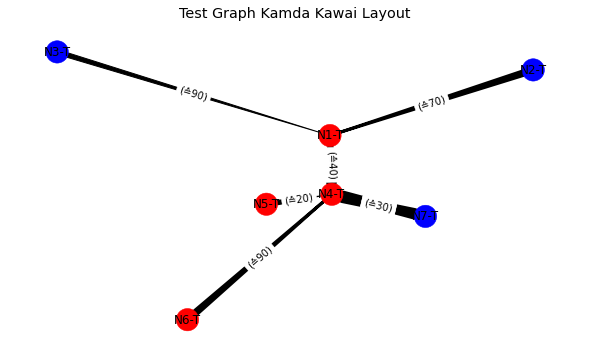

[Stopwatch stopped >>Social Graph Plot<< (0.194s)]

In [84]:
drawSocialGraph(
    G = generatedTestGraph,
    layoutSelector=1,
    configFactorEdge = 10,
    configFactorNode = 1,
    configArrowSize = 15,
    configPlotWidth = 8,
    configPlotHeight = 4.5,
    outputFilename = "",
    outputTitle = "Test Graph Kamda Kawai Layout"
)

[Stopwatch started >>Social Graph Plot<<]

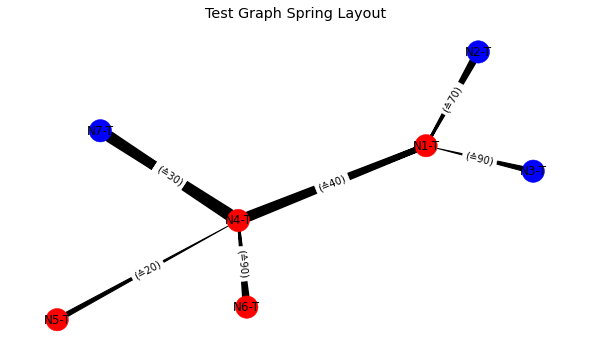

[Stopwatch stopped >>Social Graph Plot<< (0.190s)]

In [85]:
drawSocialGraph(
    G = generatedTestGraph,
    layoutSelector=2,
    configFactorEdge = 10,
    configFactorNode = 1,
    configArrowSize = 15,
    configPlotWidth = 8,
    configPlotHeight = 4.5,
    outputFilename = "",
    outputTitle = "Test Graph Spring Layout"
)

[Stopwatch started >>Social Graph Plot<<]

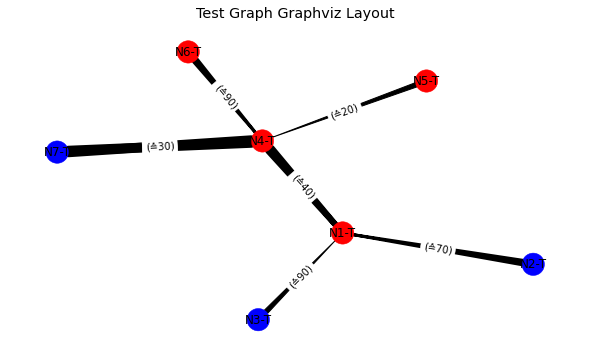

[Stopwatch stopped >>Social Graph Plot<< (0.772s)]

In [86]:
drawSocialGraph(
    G = generatedTestGraph,
    layoutSelector=3,
    configFactorEdge = 10,
    configFactorNode = 1,
    configArrowSize = 15,
    configPlotWidth = 8,
    configPlotHeight = 4.5,
    outputFilename = "",
    outputTitle = "Test Graph Graphviz Layout"
)

#### Real Graph (ForwardedFrom)

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Social Graph<<]

- Add edges

[Stopwatch started >>SG-Extract ATTILA HILDMANN (9148/37612 messages)<<]

[Stopwatch stopped >>SG-Extract ATTILA HILDMANN (9148/37612 messages)<< (0.012s)]

[Stopwatch started >>SG-Extract Oliver Janich oeffentlich(16856/47026 messages)<<]

[Stopwatch stopped >>SG-Extract Oliver Janich oeffentlich(16856/47026 messages)<< (0.010s)]

[Stopwatch started >>SG-Extract Eva Herman Offiziell(4949/36523 messages)<<]

[Stopwatch stopped >>SG-Extract Eva Herman Offiziell(4949/36523 messages)<< (0.012s)]

[Stopwatch started >>SG-Extract Xavier Naidoo inoffiziell(8934/12214 messages)<<]

[Stopwatch stopped >>SG-Extract Xavier Naidoo inoffiziell(8934/12214 messages)<< (0.012s)]

- Add different nodes

[Stopwatch stopped >>Social Graph<< (0.593s)]

[Stopwatch started >>Social Graph Plot<<]

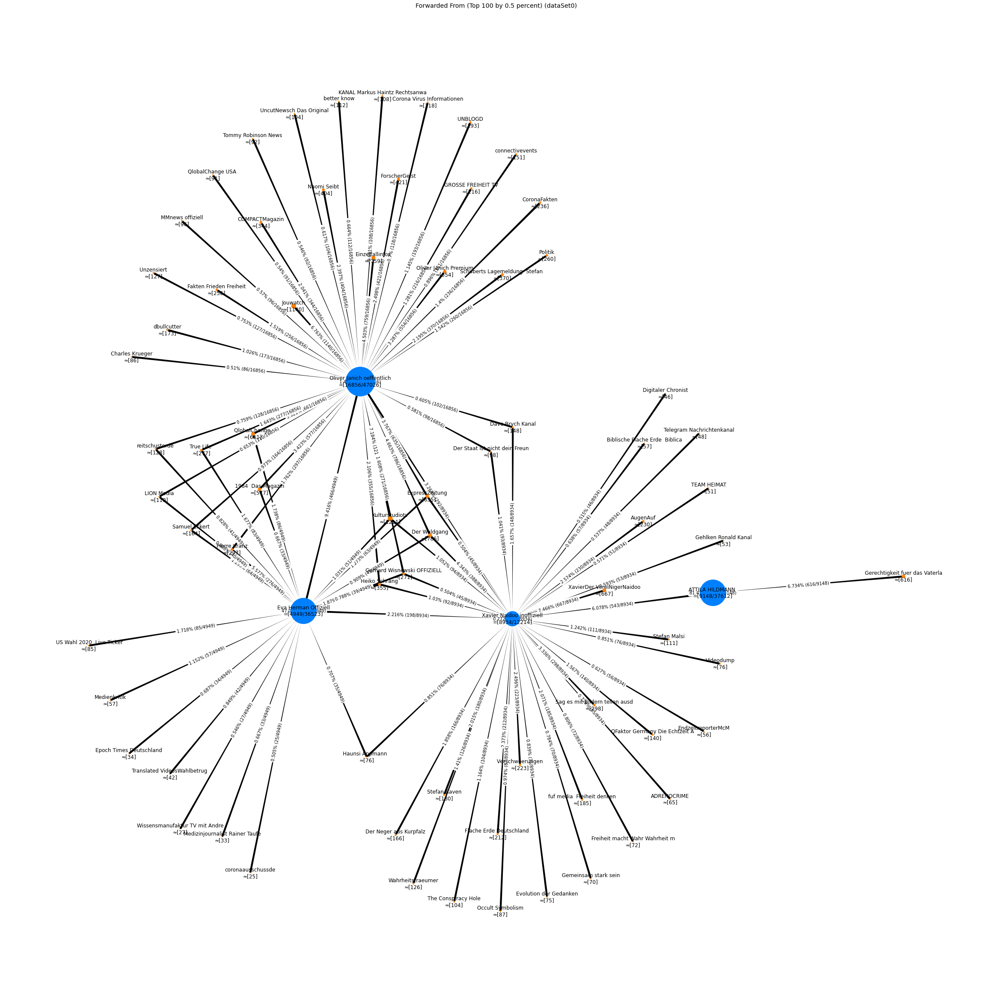

[Stopwatch stopped >>Social Graph Plot<< (4.034s)]

In [87]:
drawSocialGraph(
    generateSocialGraph(
        configTopNInfluencer = 100,  
        configMinRefs = 0.5,       
        listFilePaths = list(dfInputFiles[dfInputFiles.inputDesc == "dataSet0"].inputPath),
        socialGraphTargetDict = dictSGD_ForwardedFrom,
        socialGraphTargetAttribute = "procEvalIsForwarded",
        configFlagDebugLabel = False
    ),
    layoutSelector = 1,
    configFactorEdge = 100,
    configFactorNode = 10,
    configArrowSize = 15,
    configPlotWidth = 32,
    configPlotHeight = 32,
    outputFilename = "social-graph-dataSet0-forwarded-from.svg",
    outputTitle = "Forwarded From (Top 100 by 0.5 percent) (dataSet0)"
)

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Social Graph<<]

- Add edges

[Stopwatch started >>SG-Extract Querdenken 089  MUeNCHEN  Disk(23087/82446 messages)<<]

[Stopwatch stopped >>SG-Extract Querdenken 089  MUeNCHEN  Disk(23087/82446 messages)<< (0.012s)]

[Stopwatch started >>SG-Extract QUERDENKEN 591  Emsland  INFOK(129/228 messages)<<]

[Stopwatch stopped >>SG-Extract QUERDENKEN 591  Emsland  INFOK(129/228 messages)<< (0.008s)]

[Stopwatch started >>SG-Extract QUERDENKEN 773  HEGAU  Diskuss(2327/10334 messages)<<]

[Stopwatch stopped >>SG-Extract QUERDENKEN 773  HEGAU  Diskuss(2327/10334 messages)<< (0.012s)]

[Stopwatch started >>SG-Extract QUERDENKEN 773  HEGAU  INFOKan(29/95 messages)<<]

[Stopwatch stopped >>SG-Extract QUERDENKEN 773  HEGAU  INFOKan(29/95 messages)<< (0.002s)]

[Stopwatch started >>SG-Extract Querdenken 711  STUTTGART  Wir(101/4084 messages)<<]

[Stopwatch stopped >>SG-Extract Querdenken 711  STUTTGART  Wir(101/4084 messages)<< (0.003s)]

[Stopwatch started >>SG-Extract QUERDENKEN 711  STUTTGART  INF(377/1332 messages)<<]

[Stopwatch stopped >>SG-Extract QUERDENKEN 711  STUTTGART  INF(377/1332 messages)<< (0.011s)]

[Stopwatch started >>SG-Extract Querdenken 69  FRANKFURT  Disk(7366/47029 messages)<<]

[Stopwatch stopped >>SG-Extract Querdenken 69  FRANKFURT  Disk(7366/47029 messages)<< (0.012s)]

[Stopwatch started >>SG-Extract Querdenken 69 Frankfurt  Info (69/295 messages)<<]

[Stopwatch stopped >>SG-Extract Querdenken 69 Frankfurt  Info (69/295 messages)<< (0.006s)]

- Add different nodes

[Stopwatch stopped >>Social Graph<< (0.605s)]

[Stopwatch started >>Social Graph Plot<<]

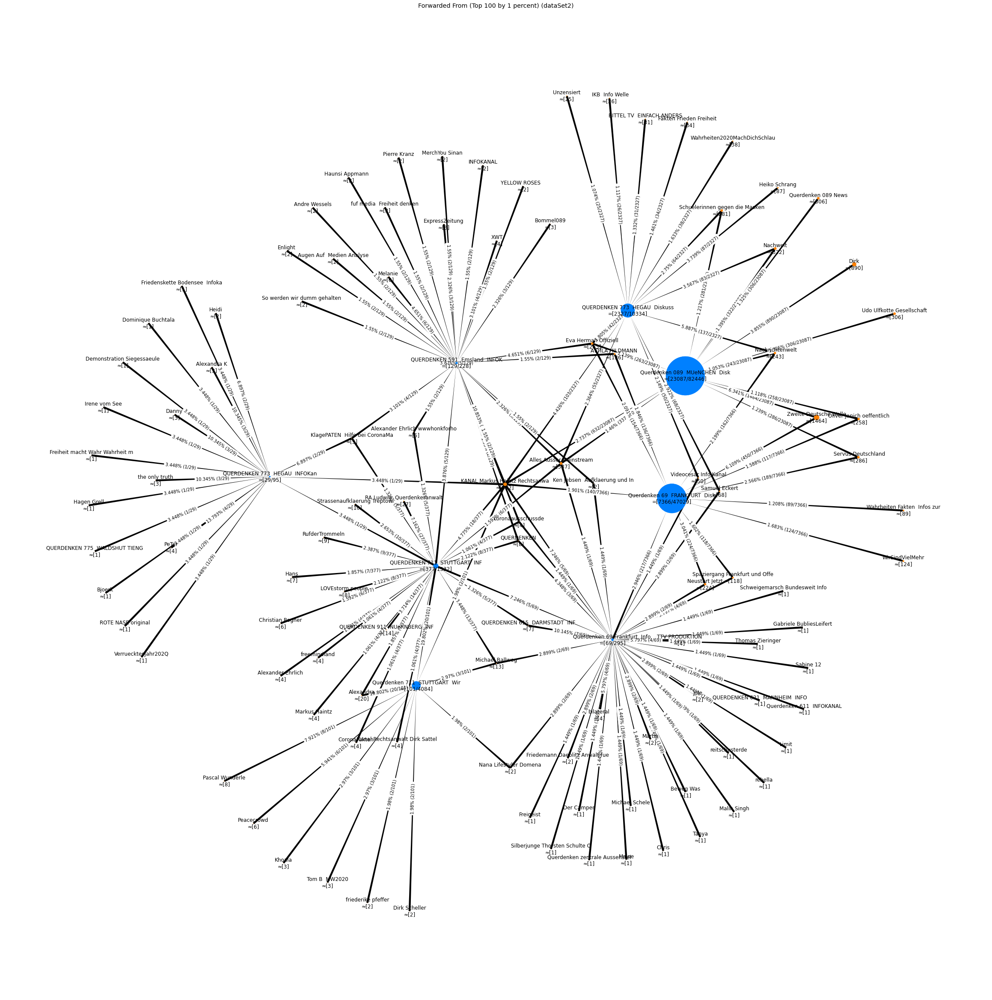

[Stopwatch stopped >>Social Graph Plot<< (5.485s)]

In [88]:
if("dataSet2" in C_LOAD_DATASET):
    drawSocialGraph(
        generateSocialGraph(
            configTopNInfluencer = 100,  
            configMinRefs = 1,       
            listFilePaths = list(dfInputFiles[dfInputFiles.inputDesc == "dataSet2"].inputPath),
            socialGraphTargetDict = dictSGD_ForwardedFrom,
            socialGraphTargetAttribute = "procEvalIsForwarded",
            configFlagDebugLabel = False
        ),
        layoutSelector = 1,
        configFactorEdge = 100,
        configFactorNode = 10,
        configArrowSize = 15,
        configPlotWidth = 32,
        configPlotHeight = 32,
        outputFilename = "social-graph-dataSet2-forwarded-from.svg",
        outputTitle = "Forwarded From (Top 100 by 1 percent) (dataSet2)"
    )

In [89]:
# TODO: Enable
"""
drawSocialGraph(
    generateSocialGraph(
        configTopNInfluencer = 25,  
        configMinRefs = 0,       
        listFilePaths = list(dfInputFiles.inputPath),
        socialGraphTargetDict = dictSGD_ForwardedFrom,
        socialGraphTargetAttribute = "procEvalIsForwarded",
        configFlagDebugLabel = False
    ),
    layoutSelector = 3,
    configFactorEdge = 100,
    configFactorNode = 10,
    configArrowSize = 15,
    configPlotWidth = 32,
    configPlotHeight = 32,
    outputFilename = "social-graph-global-graphviz-forwarded-from.svg",
    outputTitle = "Forwarded From (Top 25) (global - graphviz)"
)
"""

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


'\ndrawSocialGraph(\n    generateSocialGraph(\n        configTopNInfluencer = 25,  \n        configMinRefs = 0,       \n        listFilePaths = list(dfInputFiles.inputPath),\n        socialGraphTargetDict = dictSGD_ForwardedFrom,\n        socialGraphTargetAttribute = "procEvalIsForwarded",\n        configFlagDebugLabel = False\n    ),\n    layoutSelector = 3,\n    configFactorEdge = 100,\n    configFactorNode = 10,\n    configArrowSize = 15,\n    configPlotWidth = 32,\n    configPlotHeight = 32,\n    outputFilename = "social-graph-global-graphviz-forwarded-from.svg",\n    outputTitle = "Forwarded From (Top 25) (global - graphviz)"\n)\n'

#### Real Graph (Hashtag)

[Stopwatch started >>Social Graph<<]

- Add edges

[Stopwatch started >>SG-Extract ATTILA HILDMANN (86/37612 messages)<<]

[Stopwatch stopped >>SG-Extract ATTILA HILDMANN (86/37612 messages)<< (0.003s)]

[Stopwatch started >>SG-Extract Oliver Janich oeffentlich(1476/47026 messages)<<]

[Stopwatch stopped >>SG-Extract Oliver Janich oeffentlich(1476/47026 messages)<< (0.005s)]

[Stopwatch started >>SG-Extract Eva Herman Offiziell(558/36523 messages)<<]

[Stopwatch stopped >>SG-Extract Eva Herman Offiziell(558/36523 messages)<< (0.006s)]

[Stopwatch started >>SG-Extract Xavier Naidoo inoffiziell(1943/12214 messages)<<]

[Stopwatch stopped >>SG-Extract Xavier Naidoo inoffiziell(1943/12214 messages)<< (0.005s)]

- Add different nodes

[Stopwatch stopped >>Social Graph<< (0.302s)]

[Stopwatch started >>Social Graph Plot<<]

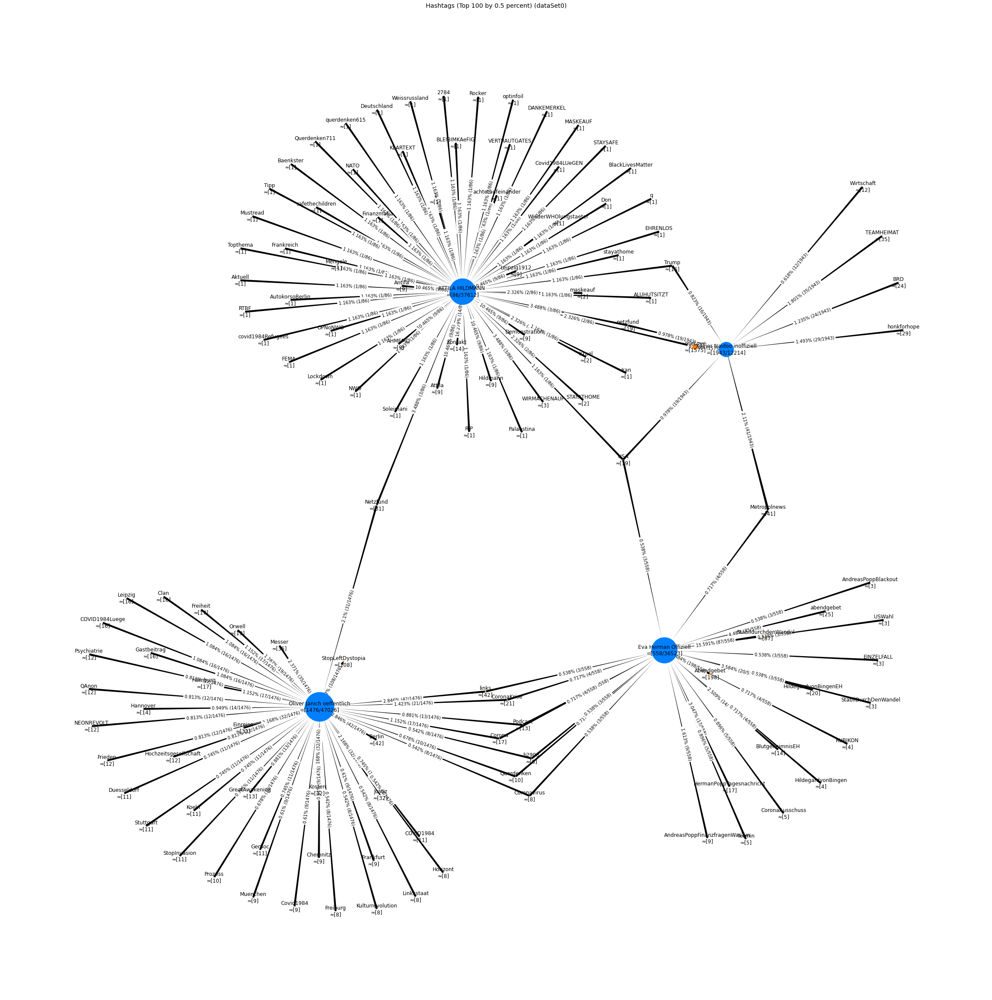

[Stopwatch stopped >>Social Graph Plot<< (6.178s)]

In [90]:
drawSocialGraph(
    generateSocialGraph(
        configTopNInfluencer = 100,  
        configMinRefs = 0.5,        
        listFilePaths = list(dfInputFiles[dfInputFiles.inputDesc == "dataSet0"].inputPath),
        socialGraphTargetDict = dictSGD_Hashtag,
        socialGraphTargetAttribute = "procEvalContainsHashtag",
        configFlagDebugLabel = False
    ),
    layoutSelector = 1,
    configFactorEdge = 100,
    configFactorNode = 10,
    configArrowSize = 15,
    configPlotWidth = 32,
    configPlotHeight = 32,
    outputFilename = "social-graph-dataSet0-hashtag.svg",
    outputTitle = "Hashtags (Top 100 by 0.5 percent) (dataSet0)"
)

In [91]:
if("dataSet2" in C_LOAD_DATASET and False): #TODO: Fix Graph
    drawSocialGraph(
        generateSocialGraph(
            configTopNInfluencer = 30,  
            configMinRefs = 4,        
            listFilePaths = list(dfInputFiles[dfInputFiles.inputDesc == "dataSet2"].inputPath),
            socialGraphTargetDict = dictSGD_Hashtag,
            socialGraphTargetAttribute = "procEvalContainsHashtag",
            configFlagDebugLabel = False
        ),
        layoutSelector = 1,
        configFactorEdge = 100,
        configFactorNode = 10,
        configArrowSize = 15,
        configPlotWidth = 32,
        configPlotHeight = 32,
        outputFilename = "social-graph-dataSet2-hashtag.svg",
        outputTitle = "Hashtags (Top 30) (dataSet2)"
    )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


#### Real Graph (Hosts)

[Stopwatch started >>Social Graph<<]

- Add edges

[Stopwatch started >>SG-Extract ATTILA HILDMANN (13760/37612 messages)<<]

[Stopwatch stopped >>SG-Extract ATTILA HILDMANN (13760/37612 messages)<< (0.009s)]

[Stopwatch started >>SG-Extract Oliver Janich oeffentlich(31088/47026 messages)<<]

[Stopwatch stopped >>SG-Extract Oliver Janich oeffentlich(31088/47026 messages)<< (0.009s)]

[Stopwatch started >>SG-Extract Eva Herman Offiziell(27327/36523 messages)<<]

[Stopwatch stopped >>SG-Extract Eva Herman Offiziell(27327/36523 messages)<< (0.008s)]

[Stopwatch started >>SG-Extract Xavier Naidoo inoffiziell(4457/12214 messages)<<]

[Stopwatch stopped >>SG-Extract Xavier Naidoo inoffiziell(4457/12214 messages)<< (0.008s)]

- Add different nodes

[Stopwatch stopped >>Social Graph<< (0.403s)]

[Stopwatch started >>Social Graph Plot<<]

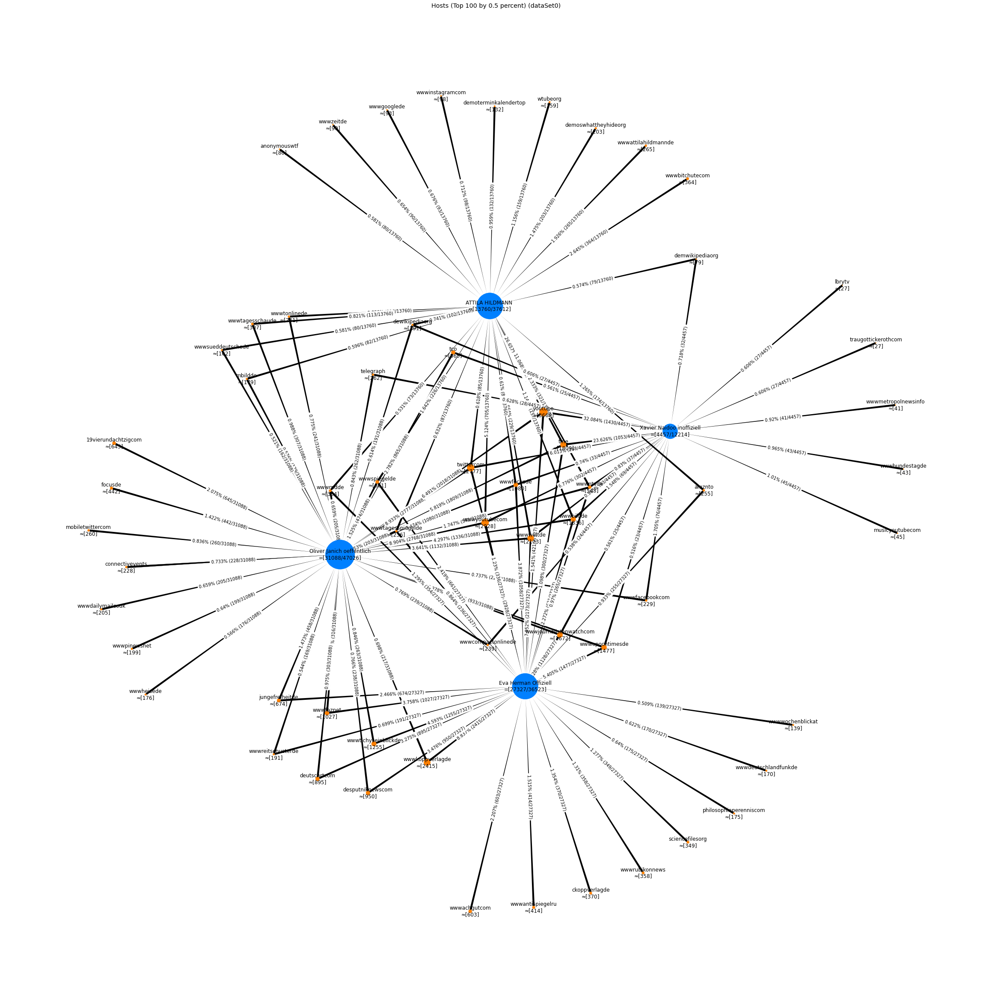

[Stopwatch stopped >>Social Graph Plot<< (3.920s)]

In [92]:
drawSocialGraph(
    generateSocialGraph(
        configTopNInfluencer = 100,  
        configMinRefs = 0.5,        
        listFilePaths = list(dfInputFiles[dfInputFiles.inputDesc == "dataSet0"].inputPath),
        socialGraphTargetDict = dictSGD_Host,
        socialGraphTargetAttribute = "procEvalContainsUrl",
        configFlagDebugLabel = False
    ),
    layoutSelector = 1,
    configFactorEdge = 100,
    configFactorNode = 10,
    configArrowSize = 15,
    configPlotWidth = 32,
    configPlotHeight = 32,
    outputFilename = "social-graph-dataSet0-host.svg",
    outputTitle = "Hosts (Top 100 by 0.5 percent) (dataSet0)"
)

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Social Graph<<]

- Add edges

[Stopwatch started >>SG-Extract Querdenken 089  MUeNCHEN  Disk(24412/82446 messages)<<]

[Stopwatch stopped >>SG-Extract Querdenken 089  MUeNCHEN  Disk(24412/82446 messages)<< (0.008s)]

[Stopwatch started >>SG-Extract QUERDENKEN 591  Emsland  INFOK(96/228 messages)<<]

[Stopwatch stopped >>SG-Extract QUERDENKEN 591  Emsland  INFOK(96/228 messages)<< (0.004s)]

[Stopwatch started >>SG-Extract QUERDENKEN 773  HEGAU  Diskuss(2666/10334 messages)<<]

[Stopwatch stopped >>SG-Extract QUERDENKEN 773  HEGAU  Diskuss(2666/10334 messages)<< (0.008s)]

[Stopwatch started >>SG-Extract QUERDENKEN 773  HEGAU  INFOKan(19/95 messages)<<]

[Stopwatch stopped >>SG-Extract QUERDENKEN 773  HEGAU  INFOKan(19/95 messages)<< (0.001s)]

[Stopwatch started >>SG-Extract Querdenken 711  STUTTGART  Wir(247/4084 messages)<<]

[Stopwatch stopped >>SG-Extract Querdenken 711  STUTTGART  Wir(247/4084 messages)<< (0.004s)]

[Stopwatch started >>SG-Extract QUERDENKEN 711  STUTTGART  INF(897/1332 messages)<<]

[Stopwatch stopped >>SG-Extract QUERDENKEN 711  STUTTGART  INF(897/1332 messages)<< (0.008s)]

[Stopwatch started >>SG-Extract Querdenken 69  FRANKFURT  Disk(9644/47029 messages)<<]

[Stopwatch stopped >>SG-Extract Querdenken 69  FRANKFURT  Disk(9644/47029 messages)<< (0.008s)]

[Stopwatch started >>SG-Extract Querdenken 69 Frankfurt  Info (111/295 messages)<<]

[Stopwatch stopped >>SG-Extract Querdenken 69 Frankfurt  Info (111/295 messages)<< (0.004s)]

- Add different nodes

[Stopwatch stopped >>Social Graph<< (0.440s)]

[Stopwatch started >>Social Graph Plot<<]

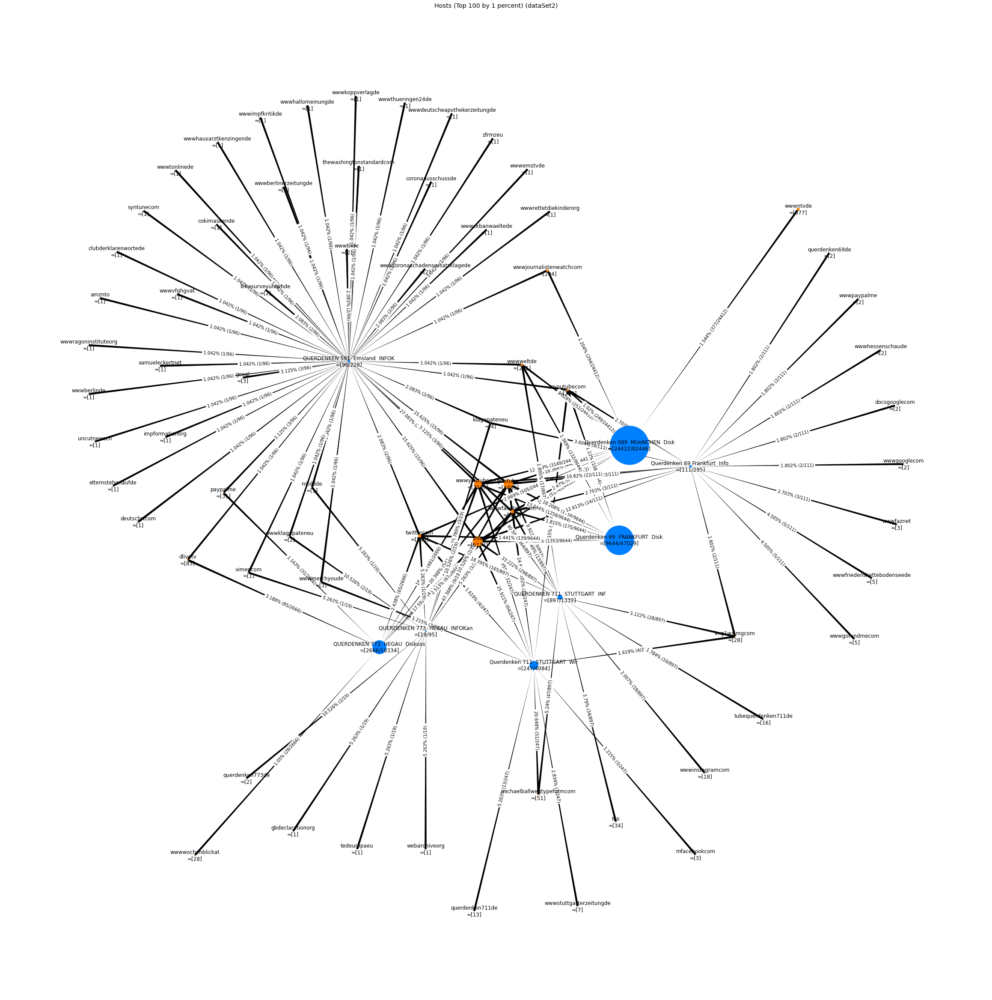

[Stopwatch stopped >>Social Graph Plot<< (4.466s)]

In [93]:
if("dataSet2" in C_LOAD_DATASET):
    drawSocialGraph(
        generateSocialGraph(
            configTopNInfluencer = 100,  
            configMinRefs = 1,        
            listFilePaths = list(dfInputFiles[dfInputFiles.inputDesc == "dataSet2"].inputPath),
            socialGraphTargetDict = dictSGD_Host,
            socialGraphTargetAttribute = "procEvalContainsUrl",
            configFlagDebugLabel = False
        ),
        layoutSelector = 1,
        configFactorEdge = 100,
        configFactorNode = 10,
        configArrowSize = 15,
        configPlotWidth = 32,
        configPlotHeight = 32,
        outputFilename = "social-graph-dataSet2-host.svg",
        outputTitle = "Hosts (Top 100 by 1 percent) (dataSet2)"
    )

#### Real Graph (Emojis)

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Social Graph<<]

- Add edges

[Stopwatch started >>SG-Extract ATTILA HILDMANN (12275/37612 messages)<<]

[Stopwatch stopped >>SG-Extract ATTILA HILDMANN (12275/37612 messages)<< (0.021s)]

[Stopwatch started >>SG-Extract Oliver Janich oeffentlich(4512/47026 messages)<<]

[Stopwatch stopped >>SG-Extract Oliver Janich oeffentlich(4512/47026 messages)<< (0.024s)]

[Stopwatch started >>SG-Extract Eva Herman Offiziell(1998/36523 messages)<<]

[Stopwatch stopped >>SG-Extract Eva Herman Offiziell(1998/36523 messages)<< (0.029s)]

[Stopwatch started >>SG-Extract Xavier Naidoo inoffiziell(4534/12214 messages)<<]

[Stopwatch stopped >>SG-Extract Xavier Naidoo inoffiziell(4534/12214 messages)<< (0.019s)]

- Add different nodes

[Stopwatch stopped >>Social Graph<< (0.401s)]

[Stopwatch started >>Social Graph Plot<<]

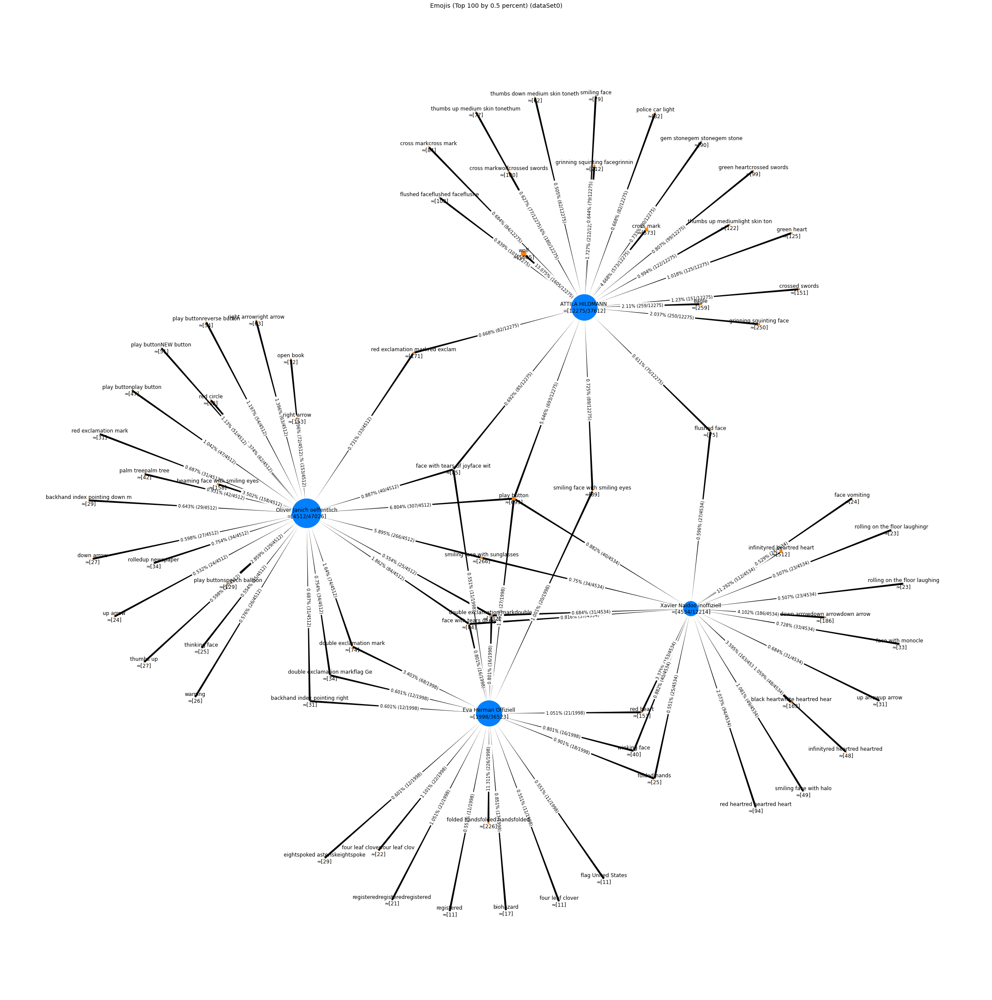

[Stopwatch stopped >>Social Graph Plot<< (3.704s)]

In [94]:
drawSocialGraph(
    generateSocialGraph(
        configTopNInfluencer = 100,  
        configMinRefs = 0.5,        
        listFilePaths = list(dfInputFiles[dfInputFiles.inputDesc == "dataSet0"].inputPath),
        socialGraphTargetDict = dictSGD_Emoji,
        socialGraphTargetAttribute = "procEvalContainsEmojiItem",
        configFlagDebugLabel = False
    ),
    layoutSelector = 1,
    configFactorEdge = 100,
    configFactorNode = 10,
    configArrowSize = 15,
    configPlotWidth = 32,
    configPlotHeight = 32,
    outputFilename = "social-graph-dataSet0-emoji.svg",
    outputTitle = "Emojis (Top 100 by 0.5 percent) (dataSet0)"
)

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Social Graph<<]

- Add edges

[Stopwatch started >>SG-Extract Querdenken 089  MUeNCHEN  Disk(20262/82446 messages)<<]

[Stopwatch stopped >>SG-Extract Querdenken 089  MUeNCHEN  Disk(20262/82446 messages)<< (0.023s)]

[Stopwatch started >>SG-Extract QUERDENKEN 591  Emsland  INFOK(65/228 messages)<<]

[Stopwatch stopped >>SG-Extract QUERDENKEN 591  Emsland  INFOK(65/228 messages)<< (0.023s)]

[Stopwatch started >>SG-Extract QUERDENKEN 773  HEGAU  Diskuss(2666/10334 messages)<<]

[Stopwatch stopped >>SG-Extract QUERDENKEN 773  HEGAU  Diskuss(2666/10334 messages)<< (0.024s)]

[Stopwatch started >>SG-Extract QUERDENKEN 773  HEGAU  INFOKan(25/95 messages)<<]

[Stopwatch stopped >>SG-Extract QUERDENKEN 773  HEGAU  INFOKan(25/95 messages)<< (0.029s)]

[Stopwatch started >>SG-Extract Querdenken 711  STUTTGART  Wir(125/4084 messages)<<]

[Stopwatch stopped >>SG-Extract Querdenken 711  STUTTGART  Wir(125/4084 messages)<< (0.014s)]

[Stopwatch started >>SG-Extract QUERDENKEN 711  STUTTGART  INF(164/1332 messages)<<]

[Stopwatch stopped >>SG-Extract QUERDENKEN 711  STUTTGART  INF(164/1332 messages)<< (0.051s)]

[Stopwatch started >>SG-Extract Querdenken 69  FRANKFURT  Disk(11739/47029 messages)<<]

[Stopwatch stopped >>SG-Extract Querdenken 69  FRANKFURT  Disk(11739/47029 messages)<< (0.019s)]

[Stopwatch started >>SG-Extract Querdenken 69 Frankfurt  Info (129/295 messages)<<]

[Stopwatch stopped >>SG-Extract Querdenken 69 Frankfurt  Info (129/295 messages)<< (0.039s)]

- Add different nodes

[Stopwatch stopped >>Social Graph<< (0.623s)]

[Stopwatch started >>Social Graph Plot<<]

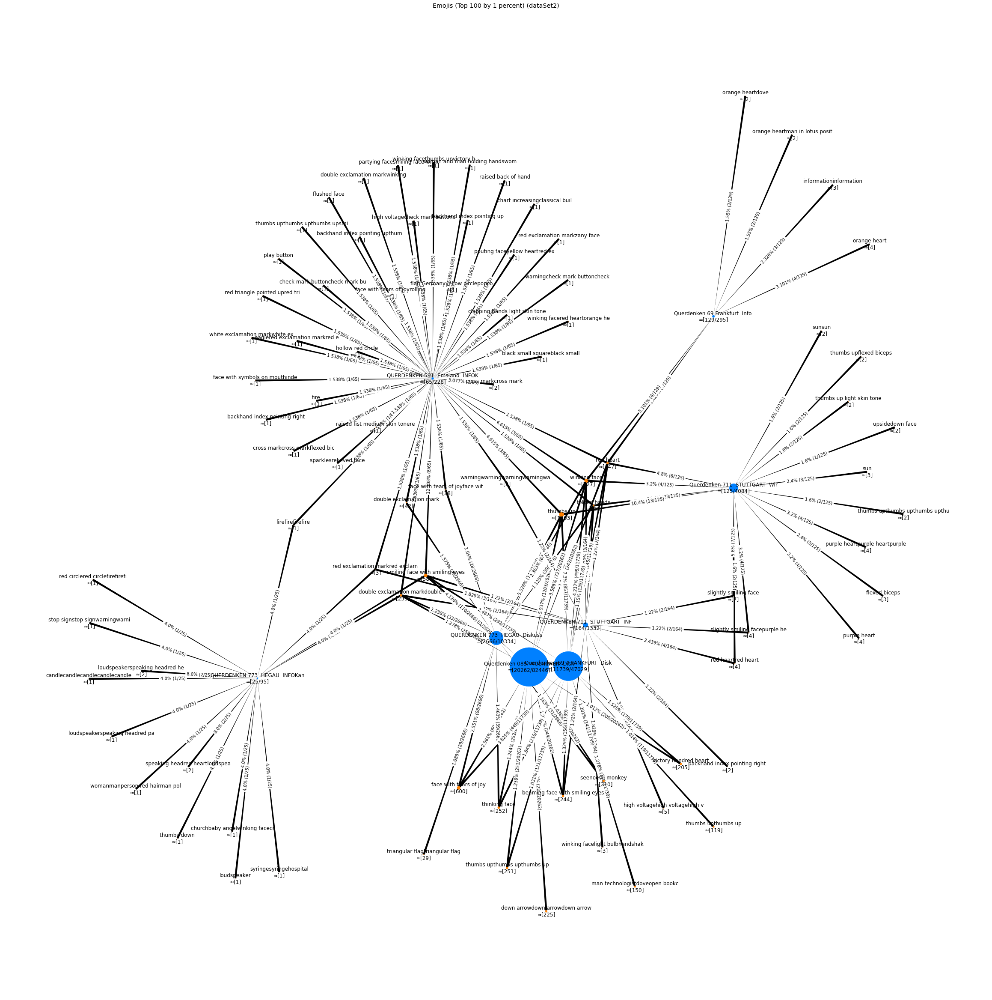

[Stopwatch stopped >>Social Graph Plot<< (4.797s)]

In [95]:
if("dataSet2" in C_LOAD_DATASET):
    drawSocialGraph(
        generateSocialGraph(
            configTopNInfluencer = 100,  
            configMinRefs = 1,        
            listFilePaths = list(dfInputFiles[dfInputFiles.inputDesc == "dataSet2"].inputPath),
            socialGraphTargetDict = dictSGD_Emoji,
            socialGraphTargetAttribute = "procEvalContainsEmojiItem",
            configFlagDebugLabel = False
        ),
        layoutSelector = 1,
        configFactorEdge = 100,
        configFactorNode = 10,
        configArrowSize = 15,
        configPlotWidth = 32,
        configPlotHeight = 32,
        outputFilename = "social-graph-dataSet2-emoji.svg",
        outputTitle = "Emojis (Top 100 by 1 percent) (dataSet2)"
    )

#### Real Graph (From)

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Social Graph<<]

- Add edges

[Stopwatch started >>SG-Extract FREIHEITSCHAT(235352/377365 messages)<<]

[Stopwatch stopped >>SG-Extract FREIHEITSCHAT(235352/377365 messages)<< (0.006s)]

[Stopwatch started >>SG-Extract FREIHEITSCHAT  BLITZ(105907/125958 messages)<<]

[Stopwatch stopped >>SG-Extract FREIHEITSCHAT  BLITZ(105907/125958 messages)<< (0.004s)]

[Stopwatch started >>SG-Extract Livestreaming fuer Deutschland(6139/7092 messages)<<]

[Stopwatch stopped >>SG-Extract Livestreaming fuer Deutschland(6139/7092 messages)<< (0.003s)]

- Add different nodes

[Stopwatch stopped >>Social Graph<< (2.311s)]

[Stopwatch started >>Social Graph Plot<<]

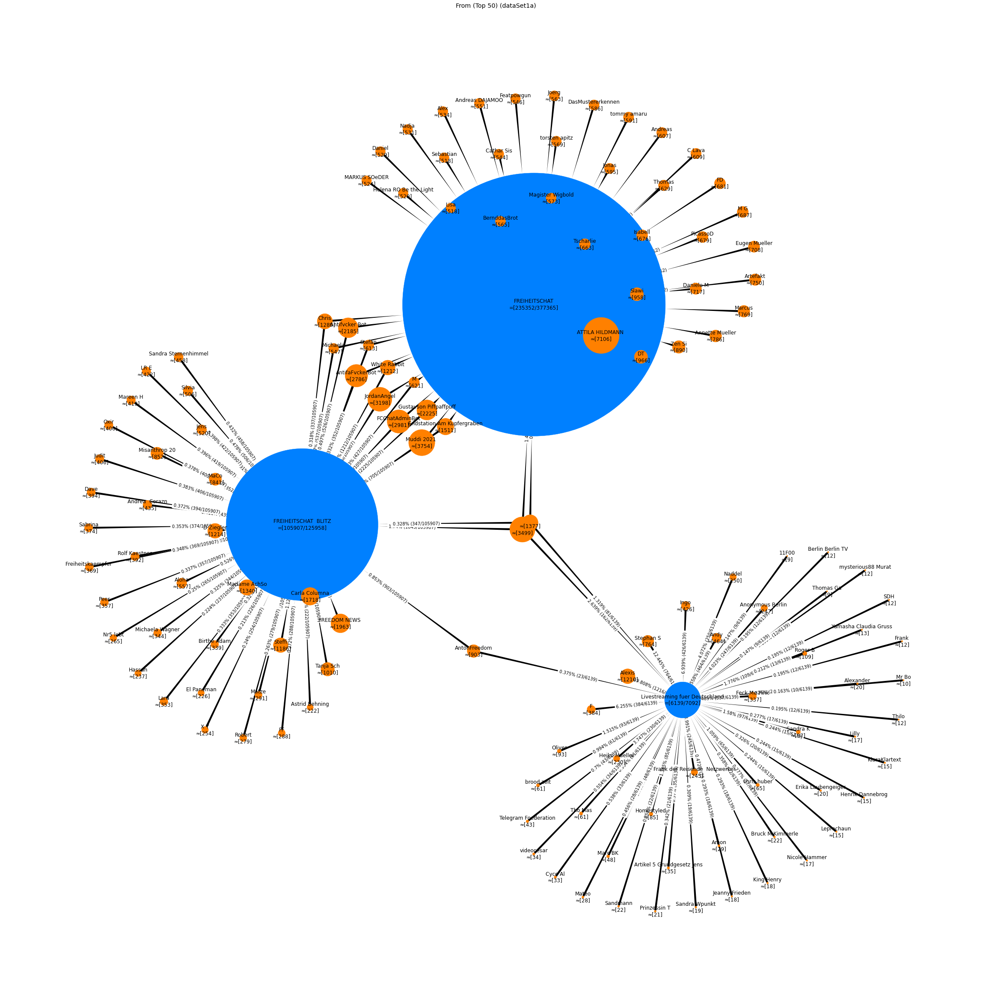

[Stopwatch stopped >>Social Graph Plot<< (7.076s)]

In [96]:
if("dataSet1a" in C_LOAD_DATASET):
    drawSocialGraph(
        generateSocialGraph(
            configTopNInfluencer = 50,  
            configMinRefs = 0,        
            listFilePaths = list(dfInputFiles[dfInputFiles.inputDesc == "dataSet1a"].inputPath),
            socialGraphTargetDict = dictSGD_From,
            socialGraphTargetAttribute = "procEvalIsValidText", #TODO: Improve
            configFlagDebugLabel = False
        ),
        layoutSelector = 1,
        configFactorEdge = 100,
        configFactorNode = 1,
        configArrowSize = 15,
        configPlotWidth = 32,
        configPlotHeight = 32,
        outputFilename = "social-graph-dataSet1a-from.svg",
        outputTitle = "From (Top 50) (dataSet1a)"
    )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Social Graph<<]

- Add edges

[Stopwatch started >>SG-Extract Querdenken 089  MUeNCHEN  Disk(66070/82446 messages)<<]

[Stopwatch stopped >>SG-Extract Querdenken 089  MUeNCHEN  Disk(66070/82446 messages)<< (0.004s)]

[Stopwatch started >>SG-Extract Querdenken 69  FRANKFURT  Disk(41358/47029 messages)<<]

[Stopwatch stopped >>SG-Extract Querdenken 69  FRANKFURT  Disk(41358/47029 messages)<< (0.003s)]

[Stopwatch started >>SG-Extract QUERDENKEN 773  HEGAU  Diskuss(8270/10334 messages)<<]

[Stopwatch stopped >>SG-Extract QUERDENKEN 773  HEGAU  Diskuss(8270/10334 messages)<< (0.004s)]

[Stopwatch started >>SG-Extract Querdenken 711  STUTTGART  Wir(607/4084 messages)<<]

[Stopwatch stopped >>SG-Extract Querdenken 711  STUTTGART  Wir(607/4084 messages)<< (0.003s)]

- Add different nodes

[Stopwatch stopped >>Social Graph<< (0.466s)]

[Stopwatch started >>Social Graph Plot<<]

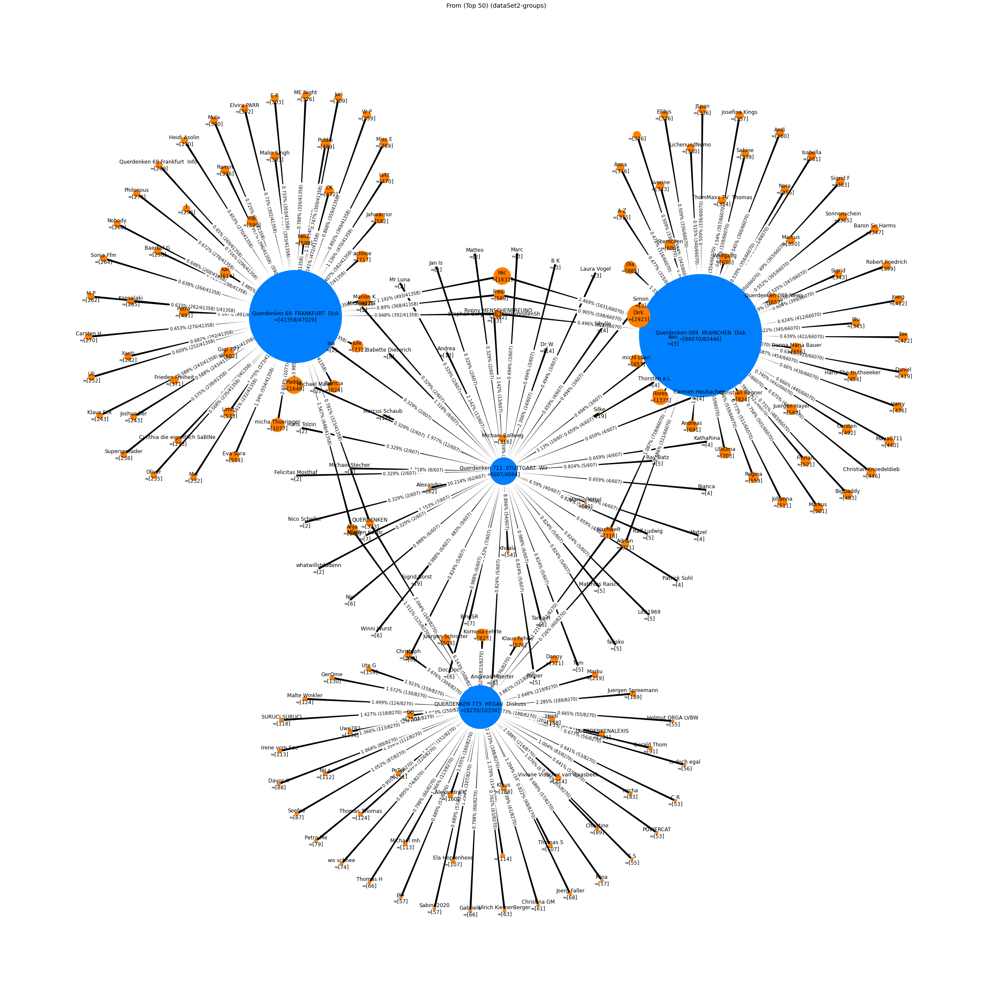

[Stopwatch stopped >>Social Graph Plot<< (10.598s)]

In [97]:
if("dataSet2" in C_LOAD_DATASET):
    drawSocialGraph(
        generateSocialGraph(
            configTopNInfluencer = 50,  
            configMinRefs = 0,        
            listFilePaths = [
                "DS-13-01-2021/ChatExport_2021-01-13-querdenken089",
                "DS-13-01-2021/ChatExport_2021-01-13-querdenken69",
                "DS-13-01-2021/ChatExport_2021-01-13-querdenken773",
                "DS-13-01-2021/ChatExport_2021-01-13-querdenken711"
                ],
            socialGraphTargetDict = dictSGD_From,
            socialGraphTargetAttribute = "procEvalIsValidText", #TODO: Improve
            configFlagDebugLabel = False
        ),
        layoutSelector = 1,
        configFactorEdge = 100,
        configFactorNode = 1,
        configArrowSize = 15,
        configPlotWidth = 32,
        configPlotHeight = 32,
        outputFilename = "social-graph-groups-dataSet2-from.svg",
        outputTitle = "From (Top 50) (dataSet2-groups)"
    )

## Time Tools

In [98]:
"""
param   targetDate      e.g. 1970-01-01
param   fP              filePath
param   highlightWord   set "" = no filter
"""
def queryNumberOfMessagesByDate(targetDate, fP, highlightWord):

    df = dictMessages[fP].copy()

    df = df[df.procEvalIsValidText == True]

    df["date"] = pd.to_datetime(df["date"])
    
    df = df[df.date <= targetDate]

    if(highlightWord != ""):
        df = df[df.procTDSafeLowercaseText.str.contains(highlightWord)]

    l = len(df.index)

    if(l > 0):
        return l
    else:
        return np.nan

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [99]:
"""
param   filePathList
param   outputFilename  set "" = no output file
param   highlightWords  list of highlight words (leave empty if not used)
param   configFrequency e.g. 1D or 1M
"""
# TODO: Add percent to label
def drawTimePlot(filePathList, outputFilename, highlightWords, configFrequency):

    gloStartStopwatch("Time Plot")

    plt.figure(figsize=(16, 9))

    df = pd.DataFrame(
        index=pd.date_range( #m/d/y
            start='9/1/2018',
            end='2/1/2021',
            freq=configFrequency
            )
        )

    # Add date to process
    df["date"] = df.index

    vLineHeight = -1

    for fP in filePathList:
        gloStartStopwatch("Time Plot >>" + fP + "<<")

        # Plot Graph Var 1
        if not highlightWords:
            # Plot
            plt.plot(
                df.index, #x
                df.apply(lambda x: queryNumberOfMessagesByDate(x.date, fP, highlightWord = ""), axis=1), #y
                label = queryChatName(fP) #label
            )
            # Set vline height
            currentHeight = queryNumberOfMessagesByAttEqTrue(fP, "procEvalIsValidText")
            if(currentHeight > vLineHeight):
                vLineHeight = currentHeight

        # Plot High Light Word Graph / Var 2
        for hWord in highlightWords:
            y = df.apply(lambda x: queryNumberOfMessagesByDate(x.date, fP, highlightWord = hWord), axis=1)
            # Plot
            plt.plot(
                df.index, #x
                y, #y
                label = queryChatName(fP) + " usage of '" + hWord + "'" #label
            )
            # Set vline height
            currentHeight = y.max()
            if(currentHeight > vLineHeight):
                vLineHeight = currentHeight

        gloStopStopwatch("Time Plot >>" + fP + "<<")

    # yy - mm - dd
    # TODO: Double check https://www.bundesgesundheitsministerium.de/coronavirus/chronik-coronavirus.html?stand=20210104
    plt.vlines(x = ["2018-12-10"], ymin=0, ymax=vLineHeight, color="orange", ls='--', label="Global Compact for Migration (2018-12-10)")
    plt.vlines(x = ["2020-01-27"], ymin=0, ymax=vLineHeight, color="grey", ls='--', label="Corona Patient Zero Germany")
    plt.vlines(x = ["2020-03-23"], ymin=0, ymax=vLineHeight, color="purple", ls='--', label="1. Lockdown Germany (2020-03-23)")
    plt.vlines(x = ["2020-11-02"], ymin=0, ymax=vLineHeight, color="purple", ls='--', label="2. Lockdown light Germany (2020-11-02)")
    plt.vlines(x = ["2020-12-16"], ymin=0, ymax=vLineHeight, color="purple", ls='--', label="3. Lockdown Germany (2020-12-16)")

    plt.gcf().autofmt_xdate()
    _ = plt.legend()

    if(outputFilename != ""):
        plt.savefig(dir_var_output + outputFilename)

    gloStopStopwatch("Time Plot")

[Stopwatch started >>Time Plot<<]

[Stopwatch started >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<< (94.910s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<< (127.682s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<< (72.129s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<< (24.227s)]

[Stopwatch stopped >>Time Plot<< (319.200s)]

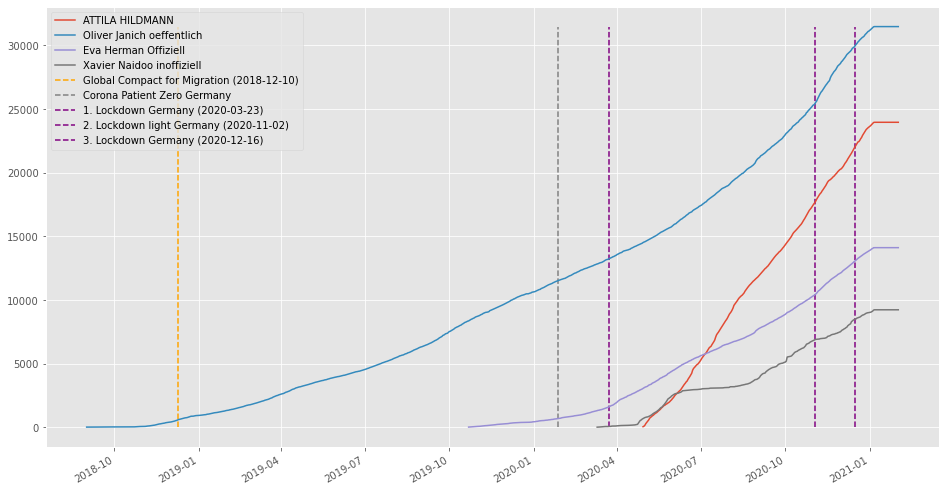

In [100]:
if(C_SHORT_RUN == False):
    drawTimePlot(
        filePathList = list(dfInputFiles[dfInputFiles.inputDesc == "dataSet0"].inputPath),
        outputFilename = "time-plot-dataSet0.svg",
        highlightWords = [],
        configFrequency=C_TIME_PLOT_FREQ
    )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Time Plot<<]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-gerechtigkeitVaterland<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-gerechtigkeitVaterland<<<< (3.803s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-aktuelleKarikaturen<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-aktuelleKarikaturen<<<< (6.122s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-drHeinrichFiechtnerInfo<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-drHeinrichFiechtnerInfo<<<< (2.713s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-michaelWendler<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-michaelWendler<<<< (4.241s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-laserLurch<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-laserLurch<<<< (2.660s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-dawidSnowden<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-dawidSnowden<<<< (4.097s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-kenJebsen<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-kenJebsen<<<< (5.720s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-nachrichtenWelt<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-nachrichtenWelt<<<< (5.679s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-qAnonAussteiger<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-qAnonAussteiger<<<< (4.891s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-whatTheyHide<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-whatTheyHide<<<< (3.224s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-kulturStudio<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-kulturStudio<<<< (19.330s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-jouwatch<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-jouwatch<<<< (61.786s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-derWaldgang<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-derWaldgang<<<< (12.052s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-einzelfallInfos<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-einzelfallInfos<<<< (169.657s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-qLobalChange<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-qLobalChange<<<< (27.062s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-expressZeitung<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-expressZeitung<<<< (11.052s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-1984DasMagazin<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-1984DasMagazin<<<< (6.992s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-forscherGeist<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-forscherGeist<<<< (10.358s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-schubertsLagemeldung<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-schubertsLagemeldung<<<< (5.671s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-coronaFakten<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-coronaFakten<<<< (2.721s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-coronaVirusInfo<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-coronaVirusInfo<<<< (7.819s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-epochTimesDeutschland<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-epochTimesDeutschland<<<< (20.341s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-translatedVideosWahlbetrug<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-translatedVideosWahlbetrug<<<< (3.684s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-checkMateNews<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-checkMateNews<<<< (61.531s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-markusHaintz<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-markusHaintz<<<< (5.491s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-connectivEvents<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-connectivEvents<<<< (7.067s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-pierreKranz<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-pierreKranz<<<< (4.513s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-heikoSchrang<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-heikoSchrang<<<< (7.224s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-usWahl2020LiveTicker<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-usWahl2020LiveTicker<<<< (2.769s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-trueLife<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-trueLife<<<< (9.983s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-samuelEckert<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-samuelEckert<<<< (4.207s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-medienKritik<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-medienKritik<<<< (5.267s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-rabbitResearch<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-rabbitResearch<<<< (3.963s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-nuoviso<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-nuoviso<<<< (3.591s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-haunsiAppmann<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-haunsiAppmann<<<< (3.360s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-friedlicheHandtuchRevolution<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-friedlicheHandtuchRevolution<<<< (2.537s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-sagEsMitBildern<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-sagEsMitBildern<<<< (22.585s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-augenAuf<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-augenAuf<<<< (27.766s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-verschwoerungen<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-verschwoerungen<<<< (12.447s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-flacheErdeDeutschland<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-flacheErdeDeutschland<<<< (6.200s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-fufMedia<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-fufMedia<<<< (14.416s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-coachCecil<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-coachCecil<<<< (3.039s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-qanonAustria<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-qanonAustria<<<< (18.463s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-honkForHope<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-honkForHope<<<< (3.185s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-dasPrinzTelegram<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-dasPrinzTelegram<<<< (4.625s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-demoTermine<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-demoTermine<<<< (8.026s)]

[Stopwatch stopped >>Time Plot<< (645.143s)]

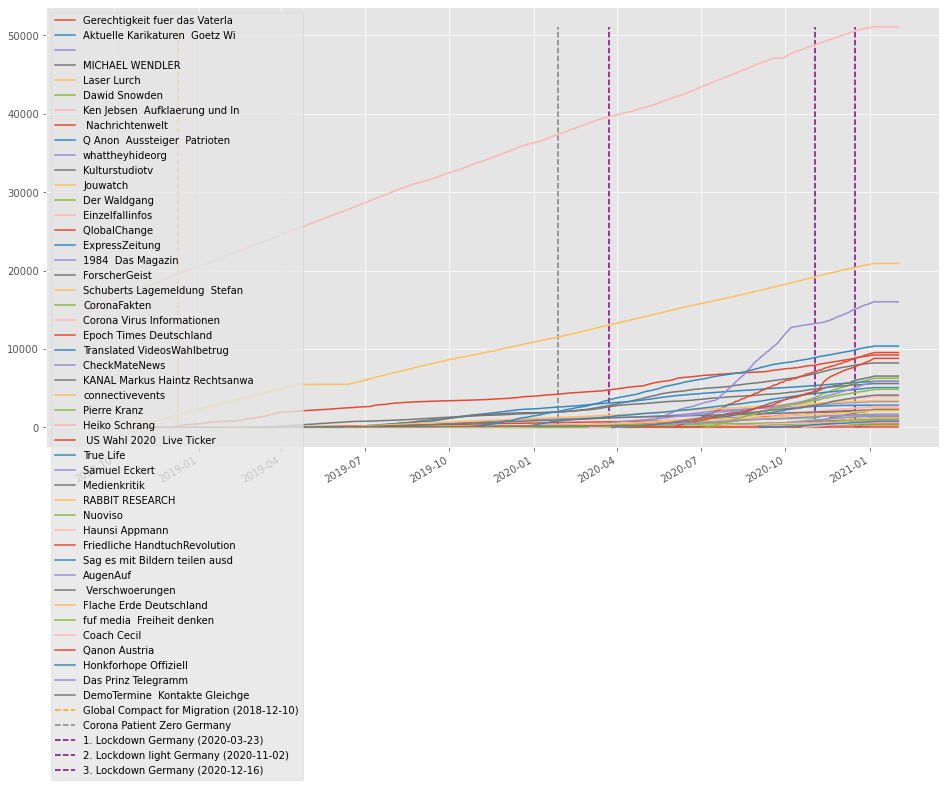

In [101]:
if(C_SHORT_RUN == False):
    if("dataSet1" in C_LOAD_DATASET):
        drawTimePlot(
            filePathList = list(dfInputFiles[dfInputFiles.inputDesc == "dataSet1"].inputPath),
            outputFilename = "time-plot-dataSet1.svg",
            highlightWords = [],
            configFrequency=C_TIME_PLOT_FREQ
        )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Time Plot<<]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-freiheitsChat<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-freiheitsChat<<<< (1062.447s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-freiheitsChatBlitz<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-freiheitsChatBlitz<<<< (398.952s)]

[Stopwatch started >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-liveFuerDeOsSc<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021a/ChatExport_2021-01-05-liveFuerDeOsSc<<<< (10.626s)]

[Stopwatch stopped >>Time Plot<< (1472.236s)]

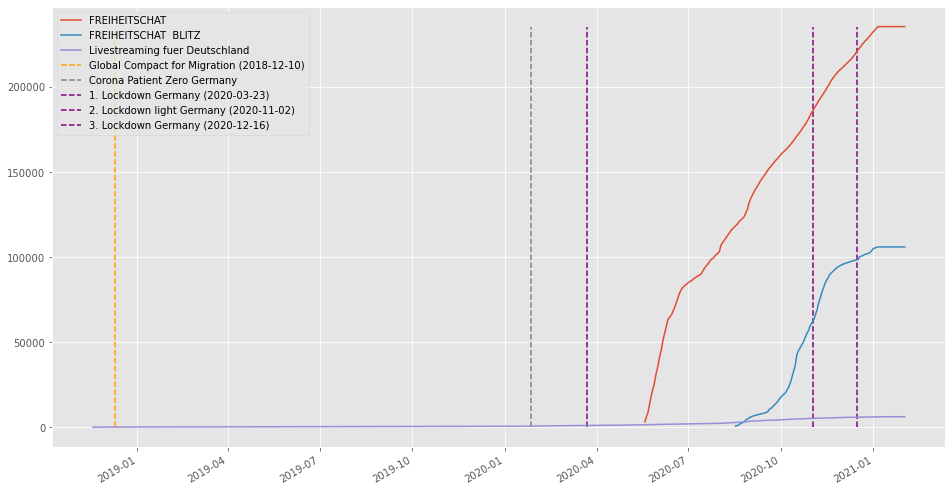

In [102]:
if(C_SHORT_RUN == False):
    if("dataSet1a" in C_LOAD_DATASET):
        drawTimePlot(
            filePathList = list(dfInputFiles[dfInputFiles.inputDesc == "dataSet1a"].inputPath),
            outputFilename = "time-plot-dataSet1a.svg",
            highlightWords = [],
            configFrequency=C_TIME_PLOT_FREQ
        )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Time Plot<<]

[Stopwatch started >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken089<<<<]

[Stopwatch stopped >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken089<<<< (234.030s)]

[Stopwatch started >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken591Info<<<<]

[Stopwatch stopped >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken591Info<<<< (2.281s)]

[Stopwatch started >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken773<<<<]

[Stopwatch stopped >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken773<<<< (17.495s)]

[Stopwatch started >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken773Info<<<<]

[Stopwatch stopped >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken773Info<<<< (2.218s)]

[Stopwatch started >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken711<<<<]

[Stopwatch stopped >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken711<<<< (4.079s)]

[Stopwatch started >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken711Info<<<<]

[Stopwatch stopped >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken711Info<<<< (3.635s)]

[Stopwatch started >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken69<<<<]

[Stopwatch stopped >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken69<<<< (121.857s)]

[Stopwatch started >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken69Info<<<<]

[Stopwatch stopped >>Time Plot >>DS-13-01-2021/ChatExport_2021-01-13-querdenken69Info<<<< (2.411s)]

[Stopwatch stopped >>Time Plot<< (388.292s)]

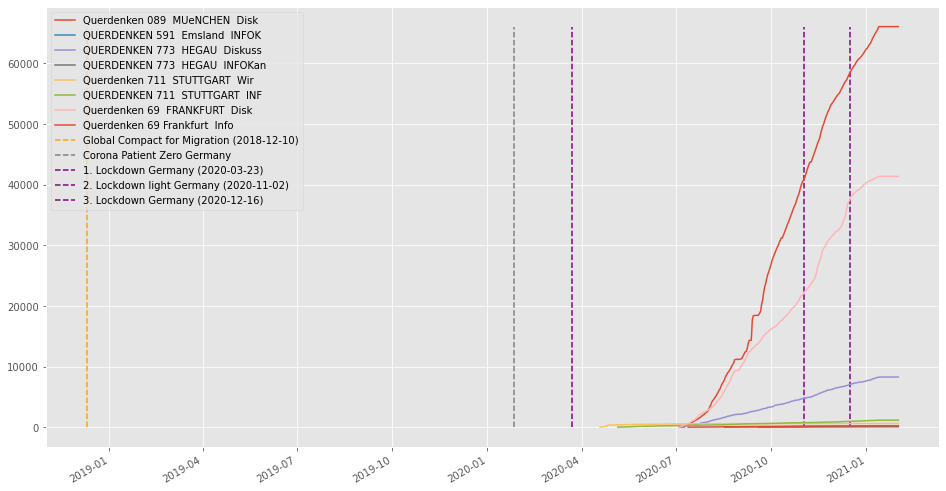

In [103]:
if(C_SHORT_RUN == False):
    if("dataSet2" in C_LOAD_DATASET):
        drawTimePlot(
            filePathList = list(dfInputFiles[dfInputFiles.inputDesc == "dataSet2"].inputPath),
            outputFilename = "time-plot-dataSet2.svg",
            highlightWords = [],
            configFrequency=C_TIME_PLOT_FREQ
        )

## Word Clouds

In [104]:
# TODO: Context?
# TODO: Improve stop words

"""
WordCloud

param   targetDataFrame     DataFrame
param   outputFilename      filename in outputdir (set "" == no output file)
param   filterList          Exclude list
param   flagShow            Set true == show wordcloud
param   configPlotWidth     e.g. 1920
param   configPlotHeight    e.g. 1080
"""
def generateWordCloud(targetDataFrame, outputFilename, filterList, flagShow, configPlotWidth, configPlotHeight):
    

    dfMessages = targetDataFrame.copy()
    
    textString = gloGenerateTextFromChat(dfMessages, rowID="procTDSafeText")
    
    stopWordsList = gloGetStopWordsList(filterList)
    
    # Generate word cloud and save it to file
    wordcloud = WordCloud(
                background_color="black",
                width=configPlotWidth,
                height=configPlotHeight,
                stopwords=stopWordsList
            ).generate(textString)

    if(outputFilename != ""):
        wordcloud.to_file(dir_var_output + outputFilename)
    
    if(flagShow):
        # Show top 20
        print()
        print("Top 20 occ:\n" + str(pd.Series(wordcloud.words_).head(20)))
        print()
        
        # Show word cloud
        print("- Start generate figure")
        plt.figure(figsize=(14, 14))
        plt.imshow(wordcloud, interpolation="bilinear")
        plt.show()
    

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Single Mode

Top 20 occ:
Deutschland    1.000000
Menschen       0.819646
Video          0.799214
sagte          0.781532
gibt           0.712770
Polizei        0.600000
Trump          0.598035
geht           0.567387
bereit         0.565029
Corona         0.525344
muessen        0.475049
Berlin         0.467976
ja             0.466798
Wer            0.458939
viele          0.433399
neue           0.426326
sollen         0.425540
Prozent        0.421218
wegen          0.410216
heute          0.409823
dtype: float64

- Start generate figure

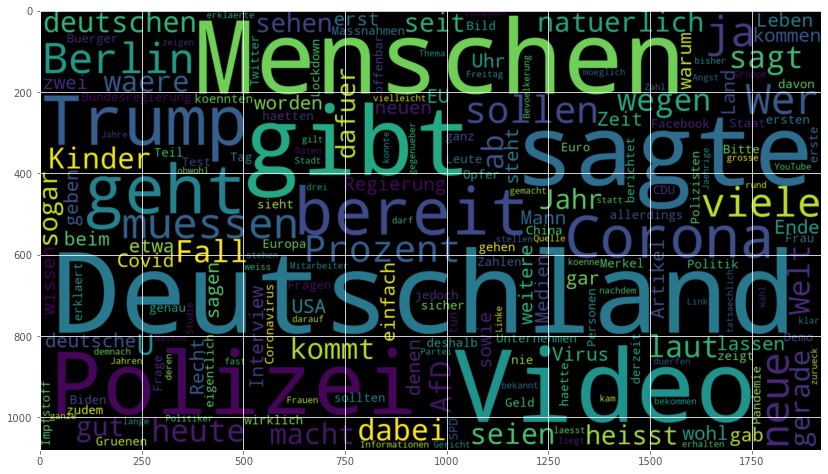

In [105]:
# Oliver Janich öffentlich (public_channel - dataSet0)
generateWordCloud(
    dictMessages["DS-05-01-2021/ChatExport_2021-01-05-janich"],
    "wordcloud-oliver-janich.png",
    [],
    flagShow = True,
    configPlotWidth = 1920,
    configPlotHeight = 1080
)

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Top 20 occ:
Folgen ATTILAHILDMANN    1.000000
Deutschland              0.913401
Wolf ATTILAHILDMANN      0.826318
Folg                     0.682632
Menschen                 0.578133
ATTILAHILDMANN           0.522013
Merkel                   0.492501
Corona                   0.441703
NWO                      0.405418
heute                    0.356072
macht                    0.353653
Deutschen                0.352685
gibt                     0.347847
geht                     0.345428
Video                    0.338171
Gate                     0.337687
Korona                   0.330914
ja                       0.324625
China                    0.298984
kommt                    0.284470
dtype: float64

- Start generate figure

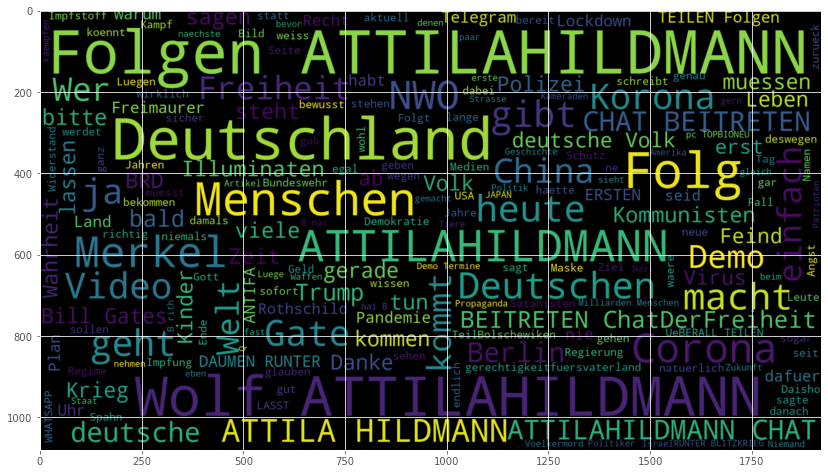

In [106]:
# ATTILA HILDMANN OFFICIAL (public_channel - dataSet0)
if(C_SHORT_RUN == False):
    generateWordCloud(
        dictMessages["DS-05-01-2021/ChatExport_2021-01-05-hildmann"],
        "wordcloud-attila-hildmann.png",
        [],
        flagShow = True,
        configPlotWidth = 1920,
        configPlotHeight = 1080
    )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Top 20 occ:
Menschen       1.000000
Deutschland    0.685354
heute          0.661616
gibt           0.625253
Corona         0.548485
sagte          0.532323
viele          0.498990
Welt           0.495455
geht           0.456566
bereit         0.445455
Zeit           0.442424
Liebe Eva      0.439899
muessen        0.432323
Kinder         0.432323
Video          0.411616
Leben          0.410606
ja             0.376768
Trump          0.340909
macht          0.333333
gerade         0.323737
dtype: float64

- Start generate figure

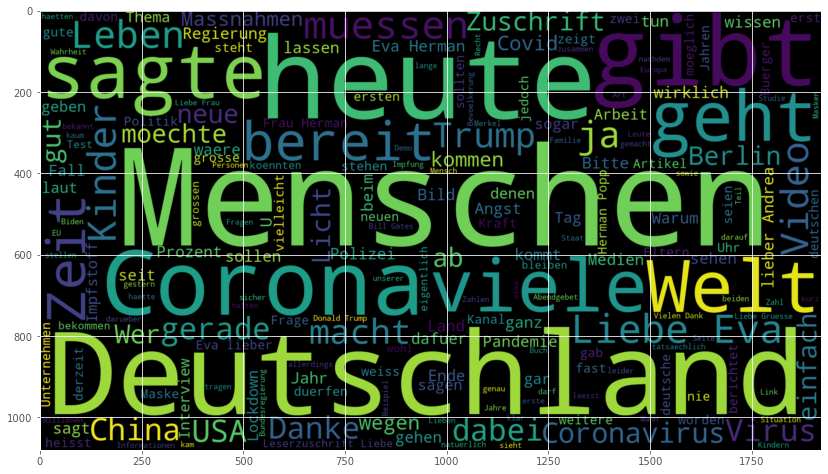

In [107]:
# Eva Herman Offiziell (public_channel - dataSet0)
if(C_SHORT_RUN == False):
    generateWordCloud(
        dictMessages["DS-05-01-2021/ChatExport_2021-01-05-evaherman"],
        "wordcloud-eva-herman.png",
        [],
        flagShow = True,
        configPlotWidth = 1920,
        configPlotHeight = 1080
    )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Top 20 occ:
Xavier Naidoo                1.000000
oneLove Xavier               0.592078
naidoo OneLove               0.437457
Menschen                     0.249131
gibt                         0.173037
Deutschland                  0.165740
Wer                          0.163308
Video                        0.153231
Wahrheit                     0.145240
ja                           0.132036
Liebe                        0.130646
Kinder                       0.128214
Danke                        0.125782
Corona                       0.125434
geht                         0.125087
Bitte                        0.123350
politische bildersprueche    0.120570
Kanaele                      0.104934
heute                        0.104587
viele                        0.103544
dtype: float64

- Start generate figure

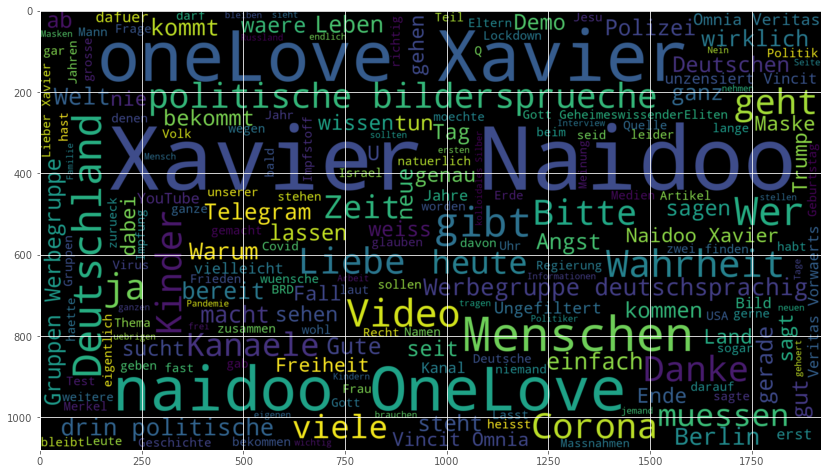

In [108]:
# Xavier Naidoo (public_channel - dataSet0)
if(C_SHORT_RUN == False):
    generateWordCloud(
        dictMessages["DS-05-01-2021/ChatExport_2021-01-05-xavier"],
        "wordcloud-xavier-naidoo.png",
        [],
        flagShow = True,
        configPlotWidth = 1920,
        configPlotHeight = 1080
    )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Top 20 occ:
ja          1.000000
gibt        0.764424
Menschen    0.732222
Demo        0.662450
geht        0.644815
Bitte       0.548016
Wer         0.483611
Berlin      0.475752
Video       0.435116
heute       0.413073
einfach     0.406939
Corona      0.406172
viele       0.396013
muessen     0.392179
Danke       0.386812
Polizei     0.372628
Maske       0.361319
Muenchen    0.348668
kommt       0.348668
gut         0.347901
dtype: float64

- Start generate figure

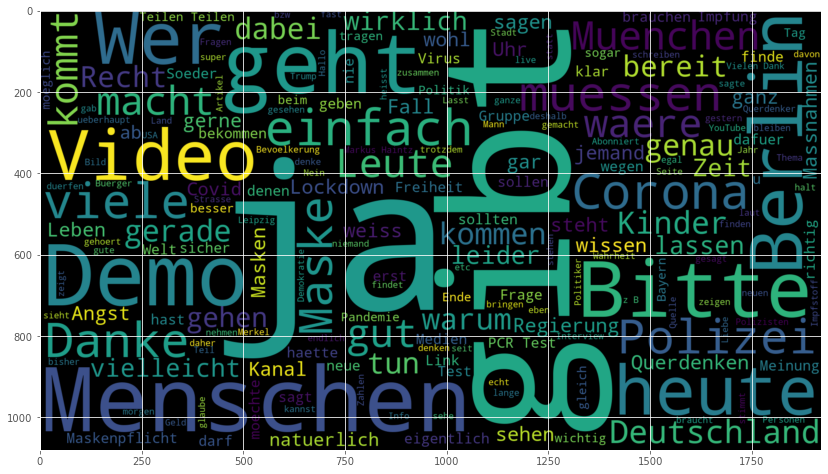

In [109]:
if(C_SHORT_RUN == False):
    if("dataSet2" in C_LOAD_DATASET):
        generateWordCloud(
            dictMessages["DS-13-01-2021/ChatExport_2021-01-13-querdenken089"],
            "wordcloud-querdenken-089-group.png",
            [],
            flagShow = True,
            configPlotWidth = 1920,
            configPlotHeight = 1080
        )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Top 20 occ:
Bitte          1.000000
Demo           0.755556
Polizei        0.644444
Berlin         0.555556
Uhr            0.511111
Maske          0.466667
Querdenken     0.444444
Corona         0.422222
Video          0.422222
heute          0.400000
Versammlung    0.355556
geht           0.355556
Flyer          0.333333
Eltern         0.333333
gibt           0.333333
Schule         0.311111
Dr             0.311111
ja             0.311111
Attest         0.311111
Wer            0.288889
dtype: float64

- Start generate figure

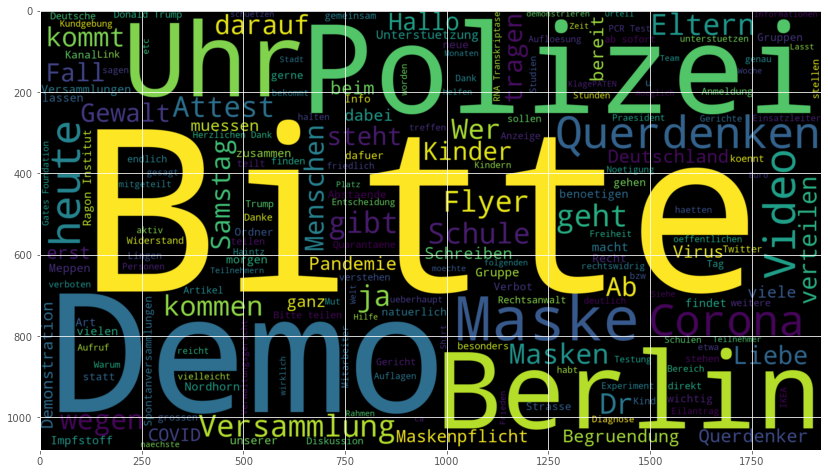

In [110]:
if(C_SHORT_RUN == False):
    if("dataSet2" in C_LOAD_DATASET):
        generateWordCloud(
            dictMessages["DS-13-01-2021/ChatExport_2021-01-13-querdenken591Info"],
            "wordcloud-querdenken-591-info.png",
            [],
            flagShow = True,
            configPlotWidth = 1920,
            configPlotHeight = 1080
        )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Top 20 occ:
ja            1.000000
bitte         0.910420
Demo          0.908592
gibt          0.906764
Hallo         0.744059
Menschen      0.716636
geht          0.714808
Danke         0.702011
Berlin        0.674589
Corona        0.625229
Wer           0.603291
Gruppe        0.579525
Video         0.546618
heute         0.511883
Uhr           0.491773
gerne         0.480804
dabei         0.436929
gut           0.435101
Querdenken    0.429616
viele         0.424132
dtype: float64

- Start generate figure

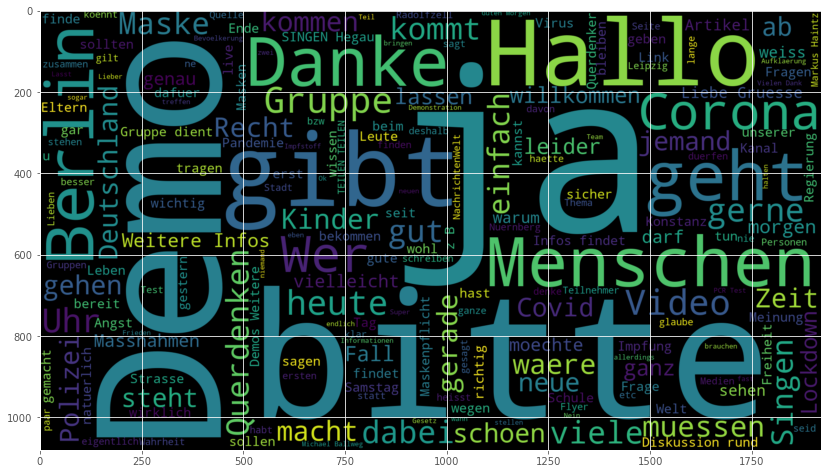

In [111]:
if(C_SHORT_RUN == False):
    if("dataSet2" in C_LOAD_DATASET):
        generateWordCloud(
            dictMessages["DS-13-01-2021/ChatExport_2021-01-13-querdenken773"],
            "wordcloud-querdenken-773-group.png",
            [],
            flagShow = True,
            configPlotWidth = 1920,
            configPlotHeight = 1080
        )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Top 20 occ:
Bitte            1.000000
Singen           0.809524
Danke            0.714286
Wer              0.666667
Info             0.523810
Flyer            0.523810
gibt             0.523810
Kanal            0.476190
Uhr              0.476190
Liebe Gruesse    0.476190
Maske            0.428571
Menschen         0.428571
Aktionen         0.380952
Aktion           0.380952
Hallo            0.380952
Corona           0.380952
TEILEN           0.380952
Kerzen           0.380952
unserer          0.333333
moechte          0.333333
dtype: float64

- Start generate figure

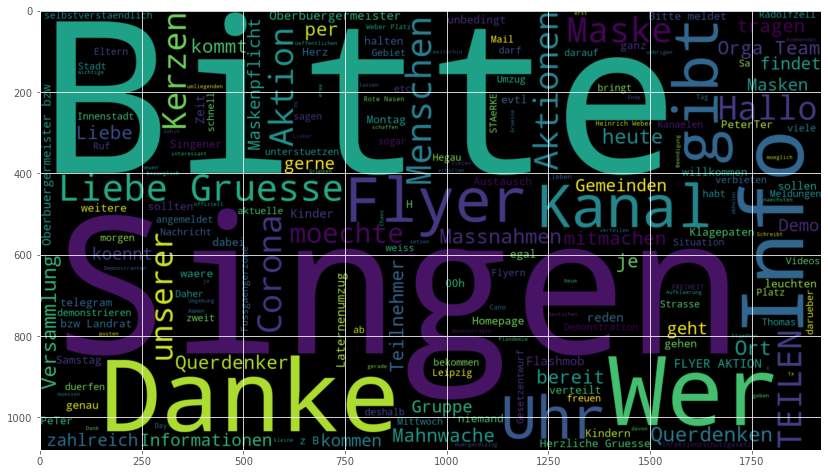

In [112]:
if(C_SHORT_RUN == False):
    if("dataSet2" in C_LOAD_DATASET):
        generateWordCloud(
            dictMessages["DS-13-01-2021/ChatExport_2021-01-13-querdenken773Info"],
            "wordcloud-querdenken-773-info.png",
            [],
            flagShow = True,
            configPlotWidth = 1920,
            configPlotHeight = 1080
        )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Top 20 occ:
Demo          1.000000
bitte         0.746988
Stuttgart     0.409639
Ordner        0.409639
heute         0.403614
QUERDENKEN    0.373494
Samstag       0.301205
Gruppe        0.283133
Danke         0.283133
gerne         0.265060
morgen        0.259036
Video         0.259036
Berlin        0.234940
Menschen      0.222892
gibt          0.222892
Info          0.216867
dabei         0.210843
ja            0.204819
Hallo         0.204819
Teilnehmer    0.204819
dtype: float64

- Start generate figure

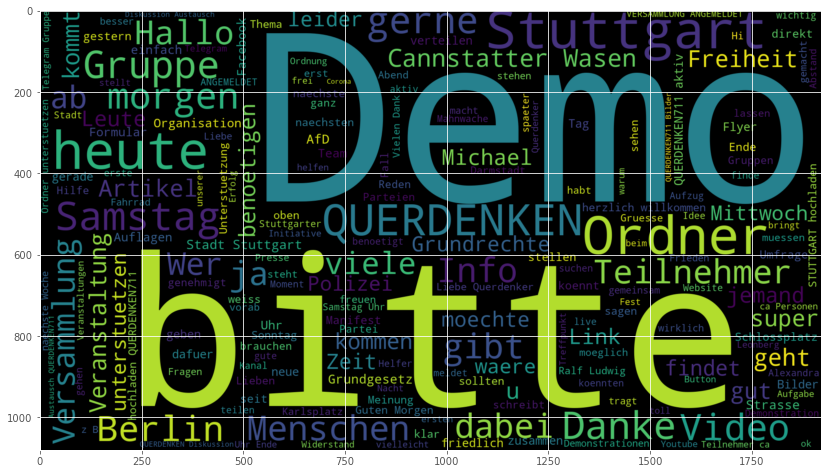

In [113]:
if(C_SHORT_RUN == False):
    if("dataSet2" in C_LOAD_DATASET):
        generateWordCloud(
            dictMessages["DS-13-01-2021/ChatExport_2021-01-13-querdenken711"],
            "wordcloud-querdenken-711-group.png",
            [],
            flagShow = True,
            configPlotWidth = 1920,
            configPlotHeight = 1080
        )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Top 20 occ:
Demo                       1.000000
Video                      0.834875
QUERDENKEN711 aktiv        0.742404
STUTTGART hochladen        0.741083
hochladen QUERDENKEN711    0.739762
QUERDENKEN Diskussion      0.684280
Diskussion Austausch       0.684280
Austausch QUERDENKEN711    0.684280
QUERDENKEN711 Bilder       0.684280
via QUERDENKEN             0.371202
STUTTGART                  0.191546
Bitte                      0.174373
aktiv QUERDENKEN           0.138705
Berlin                     0.117569
Michael Ballweg            0.114927
Uhr                        0.104359
aktiv edited               0.103038
Freiheit                   0.095112
Grundgesetz                0.087186
Menschen                   0.087186
dtype: float64

- Start generate figure

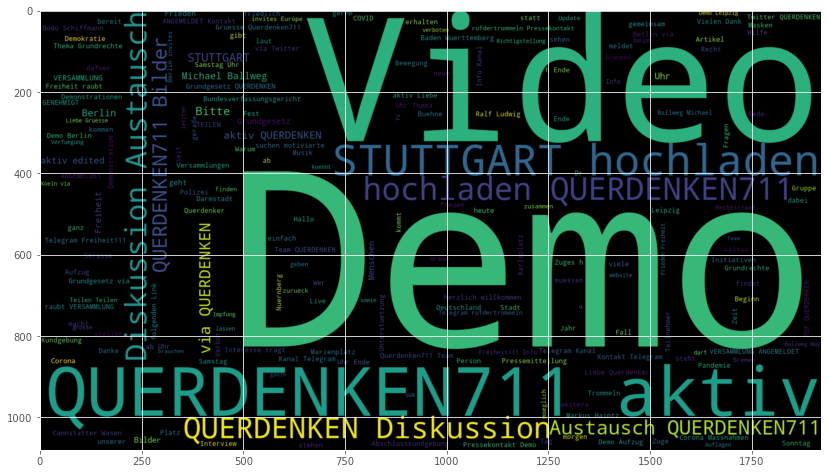

In [114]:
if(C_SHORT_RUN == False):
    if("dataSet2" in C_LOAD_DATASET):
        generateWordCloud(
            dictMessages["DS-13-01-2021/ChatExport_2021-01-13-querdenken711Info"],
            "wordcloud-querdenken-711-info.png",
            [],
            flagShow = True,
            configPlotWidth = 1920,
            configPlotHeight = 1080
        )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Top 20 occ:
ja           1.000000
Menschen     0.651819
gibt         0.608856
Demo         0.506326
geht         0.501845
Berlin       0.381655
Wer          0.371903
Frankfurt    0.365577
Danke        0.357934
Polizei      0.350817
muessen      0.333158
heute        0.330258
gut          0.326832
einfach      0.325514
Bitte        0.322351
viele        0.319452
Leute        0.317343
Corona       0.306273
macht        0.290459
kommt        0.282551
dtype: float64

- Start generate figure

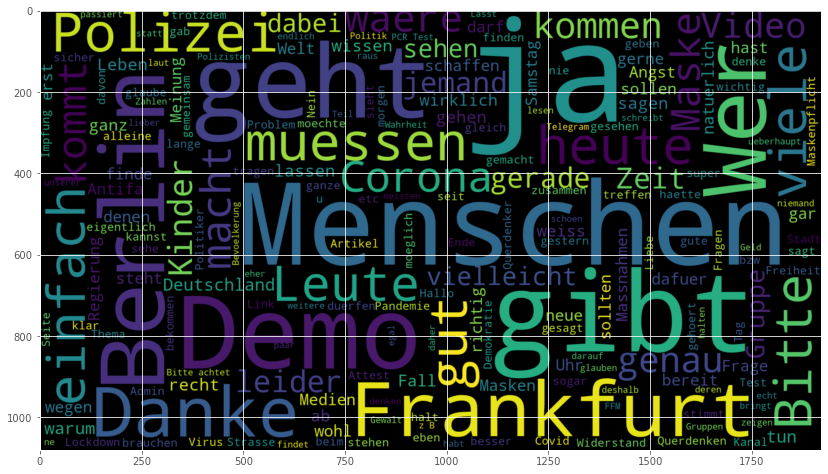

In [115]:
if(C_SHORT_RUN == False):
    if("dataSet2" in C_LOAD_DATASET):
        generateWordCloud(
            dictMessages["DS-13-01-2021/ChatExport_2021-01-13-querdenken69"],
            "wordcloud-querdenken-69-group.png",
            [],
            flagShow = True,
            configPlotWidth = 1920,
            configPlotHeight = 1080
        )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Top 20 occ:
Frankfurt      1.000000
bitte          0.951220
Demo           0.914634
Uhr            0.841463
Querdenken     0.707317
Berlin         0.512195
Samstag        0.500000
gemeinsam      0.414634
freuen         0.365854
Info           0.304878
unserer        0.304878
Stadt          0.292683
Corona         0.292683
Lieben         0.292683
Versammlung    0.256098
Flyer          0.256098
beim           0.256098
Polizei        0.256098
ab             0.243902
Ordner         0.243902
dtype: float64

- Start generate figure

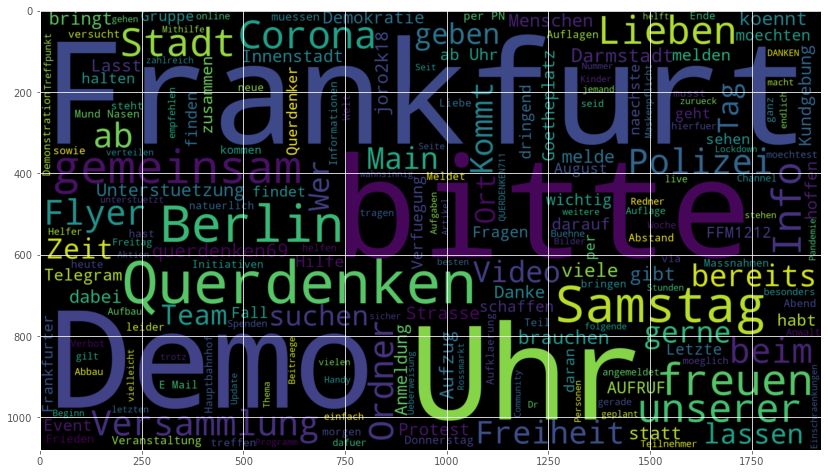

In [116]:
if(C_SHORT_RUN == False):
    if("dataSet2" in C_LOAD_DATASET):
        generateWordCloud(
            dictMessages["DS-13-01-2021/ChatExport_2021-01-13-querdenken69Info"],
            "wordcloud-querdenken-69-info.png",
            [],
            flagShow = True,
            configPlotWidth = 1920,
            configPlotHeight = 1080
        )

In [117]:
# Just for test purposes
if(C_SHORT_RUN == False and False): #TODO: Enable
    generateWordCloud(
        dfAllDataMessages,
        "",
        [],
        flagShow = True,
        configPlotWidth = 1920,
        configPlotHeight = 1080
    )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Auto Mode (Batch)

In [118]:
def extractTimePeriodDataFrame(df, timeStart, timeStop):

    #print("- Got Start " + str(timeStart) + " and Stop " + str(timeStop))

    df = df.copy()
    df["date"] = pd.to_datetime(df["date"])
    
    dfNew = df[df.date <= timeStop]
    dfNew = dfNew[dfNew.date >= timeStart]

    dfNew = dfNew.set_index("date")
    dfNew = dfNew.sort_index()

    return dfNew

In [119]:
def generateWCPeriod():
    return list(pd.date_range( #m/d/y
            start='1/1/2018',
            end='2/1/2021',
            #freq="W-MON",
            freq="1M"
            ))

In [120]:
"""
Wrapper WordCloud

param   fP  filePath
param   label e.g. chatName
param   filterList additional stopWords
"""
def generateWordCloudAuto(fP, label, filterList):

    gloStartStopwatch("Generate World Cloud Auto >>" + fP + "<<")

    periods = generateWCPeriod()

    dictSaved = {}

    prevStart = periods[0]

    for period in periods:

        stop = period

        e = extractTimePeriodDataFrame(dictMessages[fP], timeStart = prevStart, timeStop = stop)

        if(prevStart != stop and len(e.index) > 0):
            fileName = "autoWordCloud/" + queryChatName(fP) + "-" + str(prevStart) + "-" + str(stop) + ".png"
            generateWordCloud(
                e,
                fileName,
                filterList,
                flagShow = False,
                configPlotWidth = 1280,
                configPlotHeight = 720
            )
            #print("- Save file " + fileName)
            dictSaved[fileName] = str(prevStart) + " - " + str(stop)

        """
        else:
            print("- Start and Stop equal or no message found")
        """

        prevStart = stop

    gloWriteDictToFile("auto-wordcloud-" + label + ".csv", dictSaved)

    gloStopStopwatch("Generate World Cloud Auto >>" + fP + "<<")

In [121]:
if(C_SHORT_RUN == False):
    generateWordCloudAuto(
        fP = "DS-05-01-2021/ChatExport_2021-01-05-janich",
        label = "oliver-janich",
        filterList = []
    )

[Stopwatch started >>Generate World Cloud Auto >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<<]

[Stopwatch stopped >>Generate World Cloud Auto >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<< (69.265s)]

In [122]:
if(C_SHORT_RUN == False):
    generateWordCloudAuto(
        fP = "DS-05-01-2021/ChatExport_2021-01-05-hildmann",
        label = "attila-hildmann",
        filterList = []
    )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Generate World Cloud Auto >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<<]

[Stopwatch stopped >>Generate World Cloud Auto >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<< (26.443s)]

In [123]:
if(C_SHORT_RUN == False):
    generateWordCloudAuto(
        fP = "DS-05-01-2021/ChatExport_2021-01-05-evaherman",
        label = "eva-herman",
        filterList = []
    )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Generate World Cloud Auto >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<<]

[Stopwatch stopped >>Generate World Cloud Auto >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<< (38.962s)]

In [124]:
if(C_SHORT_RUN == False):
    generateWordCloudAuto(
        fP = "DS-05-01-2021/ChatExport_2021-01-05-xavier",
        label = "xavier-naidoo",
        filterList = []
    )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Generate World Cloud Auto >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<<]

[Stopwatch stopped >>Generate World Cloud Auto >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<< (22.967s)]

## N Grams

In [125]:
def generateNGram(text, n):
    # https://albertauyeung.github.io/2018/06/03/generating-ngrams.html
    text = text.lower()
    text = re.sub(r'[^a-zA-Z0-9\s]', ' ', text)
    tokens = [token for token in text.split(" ") if token != ""]
    
    return list(ngrams(tokens, n))

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [126]:
def generateNGramChat(fP, n, mostCommon):
    return Counter(
        generateNGram(
            gloGenerateTextFromChat(dictMessages[fP], rowID="procTDSafeText"),
            n = n
        )
    ).most_common(mostCommon)

In [127]:
def generateNGramAuto(filePathList, n, mostCommon):
    for fP in filePathList:

        print()
        print("Analyse now >>" + fP + "<<")

        c = generateNGramChat(
            fP,
            n = n,
            mostCommon = mostCommon
        )

        print ("\n".join(map(str, c)))

### DataSet0

In [128]:
generateNGramAuto(
    dfInputFiles[dfInputFiles.inputDesc == "dataSet0"].inputPath,
    n = 2,
    mostCommon = 10
)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<

(('folgen', 'attilahildmann'), 2066)
(('dem', 'wolf'), 1709)
(('wolf', 'attilahildmann'), 1708)
(('folg', 'dem'), 1707)
(('in', 'der'), 1339)
(('und', 'die'), 998)
(('fuer', 'die'), 806)
(('in', 'den'), 805)
(('es', 'ist'), 797)
(('auf', 'die'), 563)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<

(('in', 'der'), 4109)
(('in', 'den'), 2352)
(('fuer', 'die'), 2182)
(('dass', 'die'), 1621)
(('und', 'die'), 1611)
(('von', 'der'), 1368)
(('auf', 'die'), 1338)
(('mit', 'dem'), 1265)
(('mit', 'der'), 1251)
(('in', 'deutschland'), 1212)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<

(('in', 'der'), 3068)
(('in', 'den'), 1785)
(('fuer', 'die'), 1508)
(('und', 'die'), 1284)
(('auf', 'die'), 1084)
(('mit', 'dem'), 1001)
(('dass', 'die'), 980)
(('von', 'der'), 952)
(('ueber', 'die'), 876)
(('liebe', 'eva'), 871)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<

(('xavier', 'naidoo'), 2876)
(('onelove', 'xavier'), 1704)
(('naidoo', 'onelove'), 1259)
(('in', 'der'), 714)
(('in', 'den'), 398)
(('und', 'die'), 367)
(('fuer', 'die'), 365)
(('es', 'ist'), 363)
(('politische', 'bildersprueche'), 347)
(('das', 'ist'), 320)

In [129]:
generateNGramAuto(
    dfInputFiles[dfInputFiles.inputDesc == "dataSet0"].inputPath,
    n = 3,
    mostCommon = 10
)

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<

(('dem', 'wolf', 'attilahildmann'), 1708)
(('folg', 'dem', 'wolf'), 1707)
(('attilahildmann', 'chat', 'beitreten'), 505)
(('wolf', 'attilahildmann', 'chat'), 501)
(('chat', 'beitreten', 'chatderfreiheit'), 499)
(('das', 'deutsche', 'volk'), 340)
(('teilen', 'folgen', 'attilahildmann'), 326)
(('folgt', 'uns', 'auf'), 211)
(('uns', 'auf', 'gerechtigkeitfuersvaterland'), 207)
(('auf', 'die', 'strasse'), 184)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<

(('in', 'den', 'usa'), 247)
(('im', 'premium', 'kanal'), 203)
(('kommentierung', 'meiner', 'videos'), 198)
(('und', 'kommentierung', 'meiner'), 194)
(('meiner', 'videos', 'im'), 194)
(('videos', 'im', 'premium'), 194)
(('fruehzugriff', 'und', 'kommentierung'), 192)
(('sars', 'cov', '2'), 190)
(('die', 'zahl', 'der'), 181)
(('exklusive', 'inhalte', 'fruehzugriff'), 181)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<

(('eva', 'lieber', 'andreas'), 384)
(('liebe', 'eva', 'lieber'), 383)
(('zuschrift', 'einer', 'leserin'), 313)
(('leserzuschrift', 'liebe', 'eva'), 250)
(('in', 'den', 'usa'), 226)
(('liebe', 'frau', 'herman'), 216)
(('vielen', 'dank', 'fuer'), 191)
(('um', '21', '30'), 185)
(('einer', 'leserin', 'liebe'), 168)
(('im', 'lichte', 'der'), 165)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<

(('onelove', 'xavier', 'naidoo'), 1697)
(('xavier', 'naidoo', 'onelove'), 1259)
(('naidoo', 'onelove', 'xavier'), 494)
(('kanaele', 'und', 'gruppen'), 271)
(('einmal', 'hin', 'alles'), 271)
(('hin', 'alles', 'drin'), 271)
(('unsere', 'kanaele', 'und'), 270)
(('alles', 'drin', 'politische'), 270)
(('drin', 'politische', 'bildersprueche'), 270)
(('und', 'gruppen', 'werbegruppe'), 212)

In [130]:
generateNGramAuto(
    dfInputFiles[dfInputFiles.inputDesc == "dataSet0"].inputPath,
    n = 4,
    mostCommon = 10
)

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<

(('folg', 'dem', 'wolf', 'attilahildmann'), 1707)
(('dem', 'wolf', 'attilahildmann', 'chat'), 501)
(('wolf', 'attilahildmann', 'chat', 'beitreten'), 501)
(('attilahildmann', 'chat', 'beitreten', 'chatderfreiheit'), 497)
(('folgt', 'uns', 'auf', 'gerechtigkeitfuersvaterland'), 207)
(('b', 'nai', 'b', 'rith'), 179)
(('zum', 'ersten', 'mal', 'bei'), 166)
(('ersten', 'mal', 'bei', 'mir'), 166)
(('die', 'zum', 'ersten', 'mal'), 153)
(('5', 'gutschein', 'fuer', 'alle'), 152)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<

(('und', 'kommentierung', 'meiner', 'videos'), 194)
(('kommentierung', 'meiner', 'videos', 'im'), 194)
(('meiner', 'videos', 'im', 'premium'), 194)
(('videos', 'im', 'premium', 'kanal'), 194)
(('fruehzugriff', 'und', 'kommentierung', 'meiner'), 191)
(('exklusive', 'inhalte', 'fruehzugriff', 'und'), 179)
(('inhalte', 'fruehzugriff', 'und', 'kommentierung'), 179)
(('meinen', 'neuen', 'telegram', 'kanal'), 155)
(('abonniert', 'bitte', 'meinen', 'neuen'), 153)
(('bitte', 'meinen', 'neuen', 'telegram'), 153)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<

(('liebe', 'eva', 'lieber', 'andreas'), 380)
(('zuschrift', 'einer', 'leserin', 'liebe'), 168)
(('im', 'lichte', 'der', 'wahrheit'), 164)
(('einer', 'leserin', 'liebe', 'eva'), 128)
(('um', '21', '30', 'uhr'), 128)
(('leserzuschrift', 'liebe', 'eva', 'lieber'), 123)
(('danke', 'fuer', 'euer', 'licht'), 86)
(('sehr', 'geehrte', 'frau', 'herman'), 81)
(('us', 'praesident', 'donald', 'trump'), 79)
(('eva', 'lieber', 'andreas', 'ich'), 76)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<

(('xavier', 'naidoo', 'onelove', 'xavier'), 494)
(('naidoo', 'onelove', 'xavier', 'naidoo'), 487)
(('onelove', 'xavier', 'naidoo', 'onelove'), 469)
(('einmal', 'hin', 'alles', 'drin'), 271)
(('unsere', 'kanaele', 'und', 'gruppen'), 270)
(('hin', 'alles', 'drin', 'politische'), 270)
(('alles', 'drin', 'politische', 'bildersprueche'), 270)
(('kanaele', 'und', 'gruppen', 'werbegruppe'), 212)
(('und', 'gruppen', 'werbegruppe', 'deutschsprachig'), 212)
(('gruppen', 'werbegruppe', 'deutschsprachig', 'einmal'), 212)

In [131]:
generateNGramAuto(
    dfInputFiles[dfInputFiles.inputDesc == "dataSet0"].inputPath,
    n = 5,
    mostCommon = 10
)

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<

(('folg', 'dem', 'wolf', 'attilahildmann', 'chat'), 501)
(('dem', 'wolf', 'attilahildmann', 'chat', 'beitreten'), 501)
(('wolf', 'attilahildmann', 'chat', 'beitreten', 'chatderfreiheit'), 493)
(('zum', 'ersten', 'mal', 'bei', 'mir'), 166)
(('die', 'zum', 'ersten', 'mal', 'bei'), 152)
(('gutschein', 'fuer', 'alle', 'die', 'zum'), 149)
(('fuer', 'alle', 'die', 'zum', 'ersten'), 149)
(('alle', 'die', 'zum', 'ersten', 'mal'), 149)
(('5', 'gutschein', 'fuer', 'alle', 'die'), 148)
(('ersten', 'mal', 'bei', 'mir', 'bestellen'), 145)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<

(('kommentierung', 'meiner', 'videos', 'im', 'premium'), 194)
(('meiner', 'videos', 'im', 'premium', 'kanal'), 194)
(('fruehzugriff', 'und', 'kommentierung', 'meiner', 'videos'), 191)
(('und', 'kommentierung', 'meiner', 'videos', 'im'), 190)
(('exklusive', 'inhalte', 'fruehzugriff', 'und', 'kommentierung'), 179)
(('inhalte', 'fruehzugriff', 'und', 'kommentierung', 'meiner'), 179)
(('abonniert', 'bitte', 'meinen', 'neuen', 'telegram'), 153)
(('bitte', 'meinen', 'neuen', 'telegram', 'kanal'), 153)
(('denkt', 'dran', 'denkt', 'selbst', 'faktenfriedenfreiheit'), 83)
(('traumurlaub', 'auf', 'den', 'philippinen', 'mit'), 45)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<

(('zuschrift', 'einer', 'leserin', 'liebe', 'eva'), 128)
(('leserzuschrift', 'liebe', 'eva', 'lieber', 'andreas'), 122)
(('liebe', 'eva', 'lieber', 'andreas', 'ich'), 75)
(('euer', 'licht', 'und', 'eure', 'liebe'), 67)
(('danke', 'fuer', 'euer', 'licht', 'und'), 63)
(('fuer', 'euer', 'licht', 'und', 'eure'), 63)
(('liebe', 'frau', 'herman', 'lieber', 'herr'), 55)
(('frau', 'herman', 'lieber', 'herr', 'popp'), 55)
(('leserin', 'liebe', 'eva', 'lieber', 'andreas'), 54)
(('werk', 'im', 'lichte', 'der', 'wahrheit'), 54)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<

(('xavier', 'naidoo', 'onelove', 'xavier', 'naidoo'), 487)
(('onelove', 'xavier', 'naidoo', 'onelove', 'xavier'), 379)
(('einmal', 'hin', 'alles', 'drin', 'politische'), 270)
(('hin', 'alles', 'drin', 'politische', 'bildersprueche'), 270)
(('naidoo', 'onelove', 'xavier', 'naidoo', 'onelove'), 259)
(('unsere', 'kanaele', 'und', 'gruppen', 'werbegruppe'), 212)
(('kanaele', 'und', 'gruppen', 'werbegruppe', 'deutschsprachig'), 212)
(('und', 'gruppen', 'werbegruppe', 'deutschsprachig', 'einmal'), 212)
(('gruppen', 'werbegruppe', 'deutschsprachig', 'einmal', 'hin'), 212)
(('werbegruppe', 'deutschsprachig', 'einmal', 'hin', 'alles'), 212)

In [132]:
generateNGramAuto(
    dfInputFiles[dfInputFiles.inputDesc == "dataSet0"].inputPath,
    n = 6,
    mostCommon = 10
)

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<

(('folg', 'dem', 'wolf', 'attilahildmann', 'chat', 'beitreten'), 501)
(('dem', 'wolf', 'attilahildmann', 'chat', 'beitreten', 'chatderfreiheit'), 493)
(('die', 'zum', 'ersten', 'mal', 'bei', 'mir'), 152)
(('gutschein', 'fuer', 'alle', 'die', 'zum', 'ersten'), 149)
(('fuer', 'alle', 'die', 'zum', 'ersten', 'mal'), 149)
(('5', 'gutschein', 'fuer', 'alle', 'die', 'zum'), 148)
(('alle', 'die', 'zum', 'ersten', 'mal', 'bei'), 148)
(('zum', 'ersten', 'mal', 'bei', 'mir', 'bestellen'), 145)
(('ersten', 'mal', 'bei', 'mir', 'bestellen', 'pc'), 125)
(('mal', 'bei', 'mir', 'bestellen', 'pc', 'topbioneu'), 125)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<

(('kommentierung', 'meiner', 'videos', 'im', 'premium', 'kanal'), 194)
(('und', 'kommentierung', 'meiner', 'videos', 'im', 'premium'), 190)
(('fruehzugriff', 'und', 'kommentierung', 'meiner', 'videos', 'im'), 187)
(('exklusive', 'inhalte', 'fruehzugriff', 'und', 'kommentierung', 'meiner'), 179)
(('inhalte', 'fruehzugriff', 'und', 'kommentierung', 'meiner', 'videos'), 179)
(('abonniert', 'bitte', 'meinen', 'neuen', 'telegram', 'kanal'), 153)
(('traumurlaub', 'auf', 'den', 'philippinen', 'mit', 'gutscheincode'), 45)
(('auf', 'den', 'philippinen', 'mit', 'gutscheincode', 'oliver'), 45)
(('den', 'philippinen', 'mit', 'gutscheincode', 'oliver', 'erhaltet'), 45)
(('philippinen', 'mit', 'gutscheincode', 'oliver', 'erhaltet', 'ihr'), 45)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<

(('fuer', 'euer', 'licht', 'und', 'eure', 'liebe'), 63)
(('danke', 'fuer', 'euer', 'licht', 'und', 'eure'), 61)
(('liebe', 'frau', 'herman', 'lieber', 'herr', 'popp'), 55)
(('zuschrift', 'einer', 'leserin', 'liebe', 'eva', 'lieber'), 53)
(('einer', 'leserin', 'liebe', 'eva', 'lieber', 'andreas'), 53)
(('werk', 'im', 'lichte', 'der', 'wahrheit', 'gralsbotschaft'), 52)
(('des', 'werkes', 'im', 'lichte', 'der', 'wahrheit'), 51)
(('das', 'dreibaendige', 'werk', 'im', 'lichte', 'der'), 51)
(('dreibaendige', 'werk', 'im', 'lichte', 'der', 'wahrheit'), 51)
(('im', 'lichte', 'der', 'wahrheit', 'gralsbotschaft', 'von'), 50)

Analyse now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<

(('onelove', 'xavier', 'naidoo', 'onelove', 'xavier', 'naidoo'), 376)
(('einmal', 'hin', 'alles', 'drin', 'politische', 'bildersprueche'), 270)
(('xavier', 'naidoo', 'onelove', 'xavier', 'naidoo', 'onelove'), 259)
(('unsere', 'kanaele', 'und', 'gruppen', 'werbegruppe', 'deutschsprachig'), 212)
(('kanaele', 'und', 'gruppen', 'werbegruppe', 'deutschsprachig', 'einmal'), 212)
(('und', 'gruppen', 'werbegruppe', 'deutschsprachig', 'einmal', 'hin'), 212)
(('gruppen', 'werbegruppe', 'deutschsprachig', 'einmal', 'hin', 'alles'), 212)
(('werbegruppe', 'deutschsprachig', 'einmal', 'hin', 'alles', 'drin'), 212)
(('deutschsprachig', 'einmal', 'hin', 'alles', 'drin', 'politische'), 212)
(('naidoo', 'onelove', 'xavier', 'naidoo', 'onelove', 'xavier'), 169)

### Excerpt DataSet2

In [133]:
if("dataSet2" in C_LOAD_DATASET):
    generateNGramAuto(
        dfInputFiles[dfInputFiles.inputDesc == "dataSet2"].inputPath,
        n = 2,
        mostCommon = 10
    )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Analyse now >>DS-13-01-2021/ChatExport_2021-01-13-querdenken089<<

(('in', 'der'), 4275)
(('das', 'ist'), 3146)
(('fuer', 'die'), 2844)
(('und', 'die'), 2466)
(('in', 'den'), 2404)
(('es', 'ist'), 2076)
(('auf', 'die'), 2015)
(('nicht', 'mehr'), 2004)
(('auf', 'der'), 1677)
(('mit', 'dem'), 1653)

Analyse now >>DS-13-01-2021/ChatExport_2021-01-13-querdenken591Info<<

(('in', 'der'), 35)
(('und', 'die'), 18)
(('die', 'polizei'), 15)
(('dass', 'die'), 13)
(('fuer', 'die'), 13)
(('in', 'den'), 13)
(('mit', 'der'), 12)
(('es', 'ist'), 11)
(('auf', 'der'), 10)
(('in', 'berlin'), 10)

Analyse now >>DS-13-01-2021/ChatExport_2021-01-13-querdenken773<<

(('in', 'der'), 644)
(('fuer', 'die'), 361)
(('das', 'ist'), 354)
(('in', 'den'), 264)
(('und', 'die'), 252)
(('es', 'ist'), 251)
(('um', 'die'), 234)
(('gibt', 'es'), 209)
(('auf', 'die'), 207)
(('auf', 'der'), 205)

Analyse now >>DS-13-01-2021/ChatExport_2021-01-13-querdenken773Info<<

(('wir', 'sind'), 12)
(('in', 'singen'), 11)
(('liebe', 'gruesse'), 10)
(('wir', 'haben'), 9)
(('fuer', 'die'), 8)
(('in', 'den'), 7)
(('00', 'uhr'), 7)
(('auf', 'dem'), 6)
(('bei', 'mir'), 6)
(('nicht', 'nur'), 6)

Analyse now >>DS-13-01-2021/ChatExport_2021-01-13-querdenken711<<

(('fuer', 'die'), 57)
(('auf', 'dem'), 40)
(('05', '2020'), 36)
(('in', 'stuttgart'), 34)
(('wir', 'sind'), 32)
(('in', 'der'), 31)
(('cannstatter', 'wasen'), 29)
(('15', '30'), 27)
(('querdenken', '711'), 26)
(('ich', 'bin'), 24)

Analyse now >>DS-13-01-2021/ChatExport_2021-01-13-querdenken711Info<<

(('querdenken', '711'), 844)
(('bilder', 'und'), 570)
(('und', 'videos'), 568)
(('711', 'stuttgart'), 565)
(('querdenken711', 'aktiv'), 562)
(('von', 'demos'), 562)
(('stuttgart', 'hochladen'), 561)
(('demos', 'aus'), 561)
(('aus', '711'), 560)
(('hochladen', 'querdenken711'), 560)

Analyse now >>DS-13-01-2021/ChatExport_2021-01-13-querdenken69<<

(('in', 'der'), 2263)
(('das', 'ist'), 1860)
(('fuer', 'die'), 1422)
(('und', 'die'), 1334)
(('in', 'den'), 1199)
(('auf', 'die'), 1167)
(('ich', 'habe'), 1024)
(('nicht', 'mehr'), 1012)
(('es', 'ist'), 1011)
(('auf', 'der'), 976)

Analyse now >>DS-13-01-2021/ChatExport_2021-01-13-querdenken69Info<<

(('in', 'der'), 30)
(('fuer', 'die'), 28)
(('in', 'frankfurt'), 27)
(('freuen', 'uns'), 26)
(('00', 'uhr'), 26)
(('wir', 'freuen'), 25)
(('30', 'uhr'), 23)
(('fuer', 'den'), 21)
(('auf', 'die'), 20)
(('meine', 'lieben'), 20)

In [134]:
if("dataSet2" in C_LOAD_DATASET):
    generateNGramAuto(
        dfInputFiles[dfInputFiles.inputDesc == "dataSet2"].inputPath,
        n = 3,
        mostCommon = 10
    )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Analyse now >>DS-13-01-2021/ChatExport_2021-01-13-querdenken089<<

(('teilen', 'teilen', 'teilen'), 402)
(('auf', 'die', 'strasse'), 351)
(('sars', 'cov', '2'), 334)
(('abonniert', 'unseren', 'kanal'), 325)
(('mir', 'dein', 'laecheln'), 269)
(('zeig', 'mir', 'dein'), 267)
(('gegen', 'die', 'maskenpflicht'), 225)
(('wir', 'freuen', 'uns'), 218)
(('in', 'den', 'usa'), 217)
(('auf', 'der', 'strasse'), 203)

Analyse now >>DS-13-01-2021/ChatExport_2021-01-13-querdenken591Info<<

(('am', '29', '08'), 7)
(('29', '08', '2020'), 6)
(('auf', 'der', 'strasse'), 6)
(('des', 'ragon', 'instituts'), 6)
(('dank', 'fuer', 'deine'), 5)
(('fuer', 'deine', 'unterstuetzung'), 5)
(('08', '2020', 'um'), 4)
(('bilder', 'und', 'videos'), 4)
(('benoetigen', 'wir', 'deine'), 4)
(('demo', 'in', 'meppen'), 4)

Analyse now >>DS-13-01-2021/ChatExport_2021-01-13-querdenken773<<

(('in', 'der', 'gruppe'), 160)
(('findet', 'ihr', 'hier'), 138)
(('willkommen', 'in', 'der'), 137)
(('diese', 'gruppe', 'dient'), 137)
(('rund', 'um', 'die'), 136)
(('infos', 'findet', 'ihr'), 136)
(('der', 'gruppe', 'fuer'), 133)
(('hegau', 'diese', 'gruppe'), 133)
(('gruppe', 'dient', 'zur'), 133)
(('dient', 'zur', 'diskussion'), 133)

Analyse now >>DS-13-01-2021/ChatExport_2021-01-13-querdenken773Info<<

(('bitte', 'meldet', 'euch'), 4)
(('oberbuergermeister', 'bzw', 'landrat'), 4)
(('bei', 'mir', 'mit'), 3)
(('heinrich', 'weber', 'platz'), 3)
(('ist', 'unsere', 'staerke'), 3)
(('18', '00', '19'), 3)
(('00', '19', '00'), 3)
(('19', '00', 'uhr'), 3)
(('d', 'day', '2'), 3)
(('day', '2', '0'), 3)

Analyse now >>DS-13-01-2021/ChatExport_2021-01-13-querdenken711<<

(('auf', 'dem', 'cannstatter'), 18)
(('dem', 'cannstatter', 'wasen'), 18)
(('bilder', 'und', 'videos'), 15)
(('von', 'demos', 'aus'), 14)
(('demos', 'aus', '711'), 13)
(('aus', '711', 'stuttgart'), 13)
(('711', 'stuttgart', 'hochladen'), 13)
(('stuttgart', 'hochladen', 'querdenken711'), 13)
(('hochladen', 'querdenken711', 'aktiv'), 13)
(('der', 'stadt', 'stuttgart'), 11)

Analyse now >>DS-13-01-2021/ChatExport_2021-01-13-querdenken711Info<<

(('bilder', 'und', 'videos'), 568)
(('von', 'demos', 'aus'), 561)
(('demos', 'aus', '711'), 560)
(('aus', '711', 'stuttgart'), 560)
(('711', 'stuttgart', 'hochladen'), 560)
(('stuttgart', 'hochladen', 'querdenken711'), 560)
(('hochladen', 'querdenken711', 'aktiv'), 560)
(('und', 'videos', 'von'), 519)
(('videos', 'von', 'demos'), 519)
(('querdenken', '711', 'diskussion'), 518)

Analyse now >>DS-13-01-2021/ChatExport_2021-01-13-querdenken69<<

(('abonniert', 'unseren', 'kanal'), 315)
(('auf', 'die', 'strasse'), 267)
(('nicht', 'schaffen', 'das'), 257)
(('das', 'schaffen', 'wir'), 257)
(('was', 'wir', 'alleine'), 255)
(('wir', 'alleine', 'nicht'), 255)
(('alleine', 'nicht', 'schaffen'), 255)
(('schaffen', 'das', 'schaffen'), 254)
(('schaffen', 'wir', 'dann'), 254)
(('wir', 'dann', 'zusammen'), 254)

Analyse now >>DS-13-01-2021/ChatExport_2021-01-13-querdenken69Info<<

(('wir', 'freuen', 'uns'), 25)
(('frankfurt', 'am', 'main'), 17)
(('wir', 'sehen', 'uns'), 7)
(('14', '30', 'uhr'), 6)
(('in', 'der', 'stadt'), 6)
(('in', 'frankfurt', 'am'), 6)
(('einen', 'abstand', 'von'), 6)
(('wiege', 'der', 'demokratie'), 6)
(('per', 'pn', 'an'), 5)
(('15', '30', 'uhr'), 5)

In [135]:
if("dataSet2" in C_LOAD_DATASET):
    generateNGramAuto(
        dfInputFiles[dfInputFiles.inputDesc == "dataSet2"].inputPath,
        n = 5,
        mostCommon = 10
    )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Analyse now >>DS-13-01-2021/ChatExport_2021-01-13-querdenken089<<

(('schueler', 'innen', 'gegen', 'die', 'maskenpflicht'), 154)
(('innen', 'gegen', 'die', 'maskenpflicht', 'deutschland'), 131)
(('mit', 'zeig', 'mir', 'dein', 'laecheln'), 106)
(('ungerechtigkeit', 'an', 'irgendeinem', 'ort', 'bedroht'), 100)
(('an', 'irgendeinem', 'ort', 'bedroht', 'die'), 100)
(('irgendeinem', 'ort', 'bedroht', 'die', 'gerechtigkeit'), 100)
(('ort', 'bedroht', 'die', 'gerechtigkeit', 'an'), 100)
(('bedroht', 'die', 'gerechtigkeit', 'an', 'jedem'), 100)
(('die', 'gerechtigkeit', 'an', 'jedem', 'anderen'), 100)
(('gerechtigkeit', 'an', 'jedem', 'anderen', 'martin'), 100)

Analyse now >>DS-13-01-2021/ChatExport_2021-01-13-querdenken591Info<<

(('treffen', 'sich', 'am', '29', '08'), 3)
(('sich', 'am', '29', '08', '2020'), 3)
(('am', '29', '08', '2020', 'um'), 3)
(('29', '08', '2020', 'um', '9'), 3)
(('08', '2020', 'um', '9', '30'), 3)
(('2020', 'um', '9', '30', 'uhr'), 3)
(('in', 'berlin', 'am', 'neustaedtischen', 'kirchplatz'), 3)
(('berlin', 'am', 'neustaedtischen', 'kirchplatz', 'gute'), 3)
(('am', 'neustaedtischen', 'kirchplatz', 'gute', 'gelaunt'), 3)
(('neustaedtischen', 'kirchplatz', 'gute', 'gelaunt', 'mit'), 3)

Analyse now >>DS-13-01-2021/ChatExport_2021-01-13-querdenken773<<

(('willkommen', 'in', 'der', 'gruppe', 'fuer'), 133)
(('hegau', 'diese', 'gruppe', 'dient', 'zur'), 133)
(('diese', 'gruppe', 'dient', 'zur', 'diskussion'), 133)
(('gruppe', 'dient', 'zur', 'diskussion', 'rund'), 133)
(('dient', 'zur', 'diskussion', 'rund', 'um'), 133)
(('zur', 'diskussion', 'rund', 'um', 'die'), 133)
(('diskussion', 'rund', 'um', 'die', 'demos'), 133)
(('rund', 'um', 'die', 'demos', 'weitere'), 133)
(('um', 'die', 'demos', 'weitere', 'infos'), 133)
(('die', 'demos', 'weitere', 'infos', 'findet'), 133)

Analyse now >>DS-13-01-2021/ChatExport_2021-01-13-querdenken773Info<<

(('18', '00', '19', '00', 'uhr'), 3)
(('bitte', 'meldet', 'euch', 'bei', 'mir'), 2)
(('abonniere', 'die', 'klagepaten', 'fuer', 'die'), 2)
(('die', 'klagepaten', 'fuer', 'die', 'neuesten'), 2)
(('klagepaten', 'fuer', 'die', 'neuesten', 'infos'), 2)
(('fuer', 'die', 'neuesten', 'infos', 'unsere'), 2)
(('die', 'neuesten', 'infos', 'unsere', 'webseite'), 2)
(('20', 'von', '11', '00h', 'bis'), 2)
(('12', 'von', '18', '00', '19'), 2)
(('von', '18', '00', '19', '00'), 2)

Analyse now >>DS-13-01-2021/ChatExport_2021-01-13-querdenken711<<

(('von', 'demos', 'aus', '711', 'stuttgart'), 13)
(('demos', 'aus', '711', 'stuttgart', 'hochladen'), 13)
(('aus', '711', 'stuttgart', 'hochladen', 'querdenken711'), 13)
(('711', 'stuttgart', 'hochladen', 'querdenken711', 'aktiv'), 13)
(('bilder', 'und', 'videos', 'von', 'demos'), 9)
(('und', 'videos', 'von', 'demos', 'aus'), 9)
(('querdenken', '711', 'diskussion', 'austausch', 'querdenken711'), 8)
(('711', 'diskussion', 'austausch', 'querdenken711', 'bilder'), 8)
(('diskussion', 'austausch', 'querdenken711', 'bilder', 'und'), 8)
(('austausch', 'querdenken711', 'bilder', 'und', 'videos'), 8)

Analyse now >>DS-13-01-2021/ChatExport_2021-01-13-querdenken711Info<<

(('von', 'demos', 'aus', '711', 'stuttgart'), 560)
(('demos', 'aus', '711', 'stuttgart', 'hochladen'), 560)
(('aus', '711', 'stuttgart', 'hochladen', 'querdenken711'), 560)
(('711', 'stuttgart', 'hochladen', 'querdenken711', 'aktiv'), 560)
(('bilder', 'und', 'videos', 'von', 'demos'), 519)
(('und', 'videos', 'von', 'demos', 'aus'), 519)
(('querdenken', '711', 'diskussion', 'austausch', 'querdenken711'), 518)
(('711', 'diskussion', 'austausch', 'querdenken711', 'bilder'), 518)
(('diskussion', 'austausch', 'querdenken711', 'bilder', 'und'), 518)
(('austausch', 'querdenken711', 'bilder', 'und', 'videos'), 518)

Analyse now >>DS-13-01-2021/ChatExport_2021-01-13-querdenken69<<

(('was', 'wir', 'alleine', 'nicht', 'schaffen'), 255)
(('wir', 'alleine', 'nicht', 'schaffen', 'das'), 255)
(('alleine', 'nicht', 'schaffen', 'das', 'schaffen'), 254)
(('nicht', 'schaffen', 'das', 'schaffen', 'wir'), 254)
(('schaffen', 'das', 'schaffen', 'wir', 'dann'), 254)
(('das', 'schaffen', 'wir', 'dann', 'zusammen'), 254)
(('schaffen', 'wir', 'dann', 'zusammen', 'bitte'), 190)
(('bitte', 'abonniert', 'unseren', 'kanal', 'neustart'), 165)
(('abonniert', 'unseren', 'kanal', 'neustart', 'jetzt'), 165)
(('viel', 'spass', 'in', 'unserem', 'chat'), 156)

Analyse now >>DS-13-01-2021/ChatExport_2021-01-13-querdenken69Info<<

(('was', 'wir', 'alleine', 'nicht', 'schaffen'), 4)
(('wir', 'alleine', 'nicht', 'schaffen', 'das'), 4)
(('alleine', 'nicht', 'schaffen', 'das', 'schaffen'), 4)
(('nicht', 'schaffen', 'das', 'schaffen', 'wir'), 4)
(('schaffen', 'das', 'schaffen', 'wir', 'dann'), 4)
(('das', 'schaffen', 'wir', 'dann', 'zusammen'), 4)
(('der', 'corona', 'kontakt', 'und', 'betriebsbeschraenkungsverordnung'), 4)
(('meldet', 'euch', 'hierfuer', 'bitte', 'bei'), 4)
(('das', 'ende', 'der', 'pandemie', 'der'), 3)
(('ende', 'der', 'pandemie', 'der', 'tag'), 3)

## Freq Nouns

In [136]:
def generateFreqNounsPlot(fP, mostCommon, outputFilename):

    gloStartStopwatch("Generate text")
    df = dictMessages[fP].copy()
    inputText = gloGenerateTextFromChat(df, "procTDCleanText")
    gloStopStopwatch("Generate text")

    gloStartStopwatch("Process data")
    plotFreqNouns(inputText, outputFilename=outputFilename, mostCommon=mostCommon, flagRemoveStopwords=True)
    gloStopStopwatch("Process data")

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Generate text<<]

[Stopwatch stopped >>Generate text<< (3.497s)]

[Stopwatch started >>Process data<<]

- Warn: remove stopWords

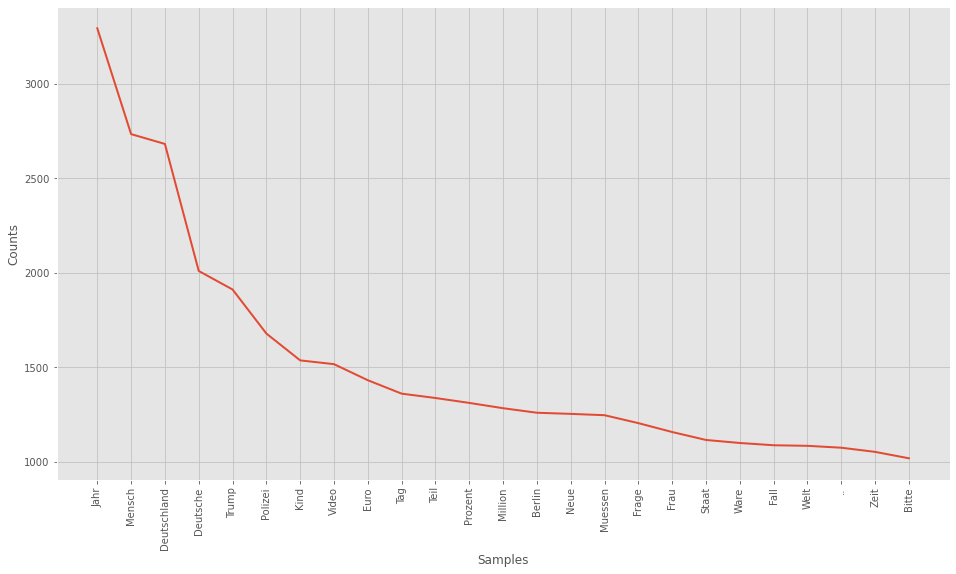

[Stopwatch stopped >>Process data<< (2116.333s)]

In [137]:
if(C_SHORT_RUN == False):
    generateFreqNounsPlot("DS-05-01-2021/ChatExport_2021-01-05-janich", mostCommon=25, outputFilename = "freq-nouns-oliver-janich.svg")

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Generate text<<]

[Stopwatch stopped >>Generate text<< (2.534s)]

[Stopwatch started >>Process data<<]

- Warn: remove stopWords

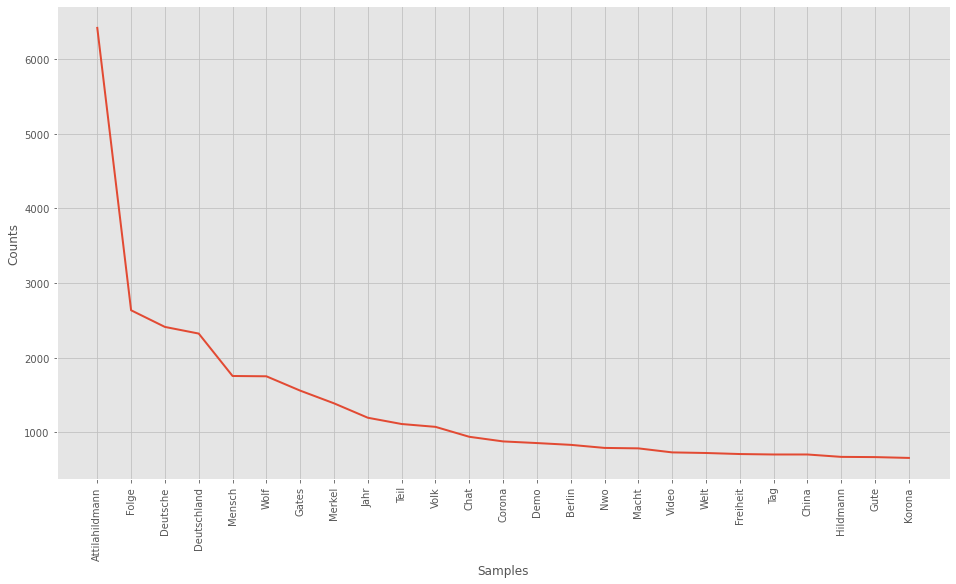

[Stopwatch stopped >>Process data<< (856.506s)]

In [138]:
if(C_SHORT_RUN == False):
    generateFreqNounsPlot("DS-05-01-2021/ChatExport_2021-01-05-hildmann", mostCommon=25, outputFilename = "freq-nouns-attila-hildmann.svg")

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Generate text<<]

[Stopwatch stopped >>Generate text<< (1.489s)]

[Stopwatch started >>Process data<<]

- Warn: remove stopWords

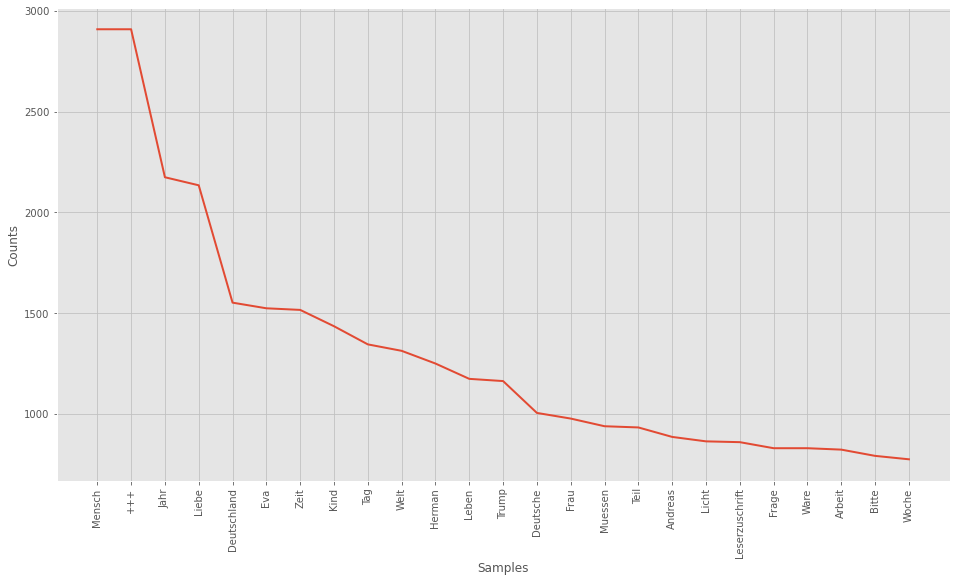

[Stopwatch stopped >>Process data<< (1406.113s)]

In [139]:
if(C_SHORT_RUN == False):
    generateFreqNounsPlot("DS-05-01-2021/ChatExport_2021-01-05-evaherman", mostCommon=25, outputFilename = "freq-nouns-eva-herman.svg")

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Generate text<<]

[Stopwatch stopped >>Generate text<< (0.987s)]

[Stopwatch started >>Process data<<]

- Warn: remove stopWords

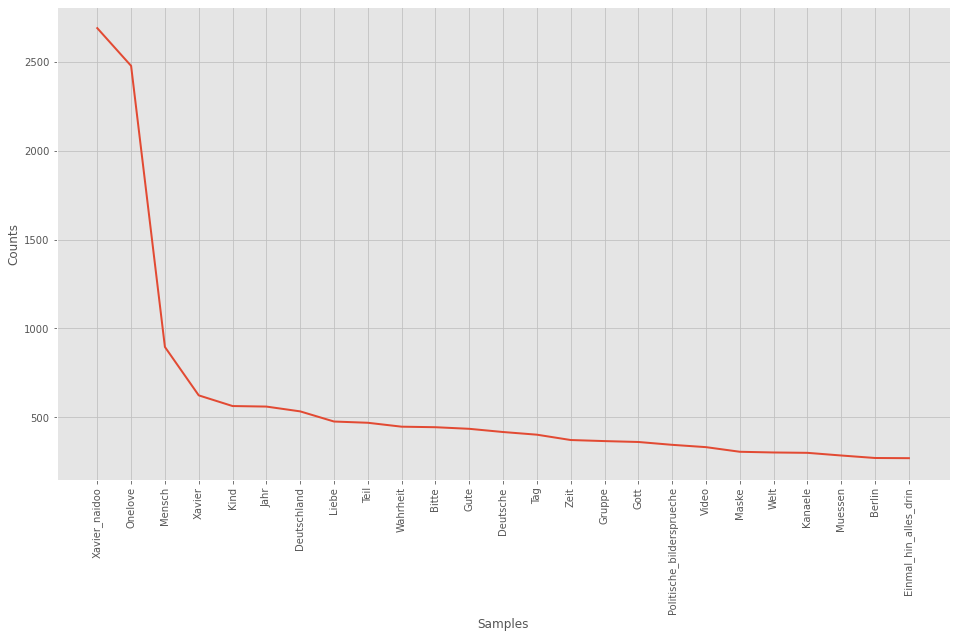

[Stopwatch stopped >>Process data<< (446.547s)]

In [140]:
if(C_SHORT_RUN == False):
    generateFreqNounsPlot("DS-05-01-2021/ChatExport_2021-01-05-xavier", mostCommon=25, outputFilename = "freq-nouns-xavier-naidoo.svg")

## NLP with Bert and co.

### Eval Ner Pipeline

In [141]:
def evalNerPipeline(pipelineKey, inputSelector, configTopN):

    if(inputSelector in C_PIPELINE_DATASET):
        
        filePaths = dfInputFiles[dfInputFiles.inputDesc == inputSelector].inputPath

        for fP in filePaths:
            
            gloStartStopwatch("Process now >>" + str(fP) + "<<")

            if(pipelineKey == "ner-xlm-roberta" or pipelineKey == "ner-bert"):
                
                df = dictMessages[fP].copy()
                df = df[df.procEvalIsValidText == True]
                
                listPer     = list()
                listMisc    = list()
                listOrg     = list()
                listLoc     = list()

                for index, row in df.iterrows():

                    d = row["procPipeline-" + pipelineKey]
                    
                    listPer.extend(d["per"])
                    listMisc.extend(d["misc"])
                    listOrg.extend(d["org"])
                    listLoc.extend(d["loc"])

                print("- Top per -")
                print ("\n".join(map(str, Counter(listPer).most_common(configTopN))))
                print()

                print("- Top misc -")
                print ("\n".join(map(str, Counter(listMisc).most_common(configTopN))))
                print()

                print("- Top org -")
                print ("\n".join(map(str, Counter(listOrg).most_common(configTopN))))
                print()

                print("- Top loc -")
                print ("\n".join(map(str, Counter(listLoc).most_common(configTopN))))
                print()

            else:
                print("Error pipeline not found >>" + str(pipelineKey) + "<<")

            gloStopStopwatch("Process now >>" + str(fP) + "<<")

    else:
        print("Error data not found >>" + inputSelector + "<<")

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [142]:
evalNerPipeline("ner-xlm-roberta", "dataSet0", configTopN = 20)

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<<]

- Top per -

('TTI', 6208)
('LAH', 6131)
('MAN', 6127)
('A', 6062)
('IL', 5935)
('D', 5846)
('N', 5744)
('▁Gates', 1063)
('▁Merkel', 1007)
('▁A', 411)
('▁Trump', 398)
('WO', 387)
('mann', 385)
('LD', 382)
('▁HI', 359)
('h', 354)
('▁Spa', 350)
('n', 336)
('LF', 330)
('TT', 329)

- Top misc -

('-', 2086)
('▁Corona', 845)
('▁DE', 838)
('UT', 717)
('▁deutsche', 649)
('WO', 443)
('S', 433)
('▁Deutschen', 409)
('▁N', 409)
('sche', 383)
('▁deutschen', 378)
('▁Deutsche', 336)
('D', 333)
('▁', 326)
('▁Kommun', 304)
('▁Bol', 283)
('▁BR', 222)
('na', 211)
('ed', 210)
('▁KOMMUN', 210)

- Top org -

('N', 782)
('▁N', 749)
('WO', 738)
('D', 717)
('MAN', 616)
('F', 602)
('rei', 545)
('heit', 545)
('Chat', 534)
('Der', 530)
('-', 469)
('IL', 365)
('▁B', 353)
('igkeit', 330)
('erland', 322)
('▁', 319)
('lumina', 319)
('gerecht', 318)
('ers', 316)
('fu', 314)

- Top loc -

('▁Deutschland', 1455)
('▁DE', 938)
('UT', 917)
('LAND', 860)
('SCH', 807)
('▁China', 518)
('D', 492)
('▁Berlin', 469)
('-', 394)
('▁BR', 377)
('▁BER', 290)
('LIN', 286)
('e', 228)
('G', 207)
('▁', 188)
('S', 186)
('▁USA', 184)
('N', 177)
('en', 174)
('INA', 161)

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<< (2.555s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<<]

- Top per -

('▁Trump', 1842)
('er', 1101)
('▁Merkel', 906)
('e', 788)
('n', 756)
('.', 711)
('▁Bi', 681)
('den', 673)
('s', 623)
('-', 577)
('mann', 567)
('stein', 526)
('h', 499)
('t', 429)
('▁Ep', 423)
('well', 394)
('▁Donald', 383)
('z', 376)
('▁Spa', 367)
('sten', 359)

- Top misc -

('-', 6155)
('▁Corona', 3205)
('▁US', 986)
('er', 681)
('D', 660)
('▁deutsche', 658)
('▁deutschen', 597)
('s', 558)
('en', 515)
('▁', 510)
('▁EU', 505)
('vid', 432)
('e', 415)
('-19', 394)
('▁Co', 377)
('▁Af', 346)
('VID', 346)
('▁Berliner', 329)
('▁CO', 299)
('▁Trump', 294)

- Top org -

('-', 1359)
('D', 1282)
('en', 1213)
('e', 1004)
('s', 814)
('▁Bundes', 668)
('▁', 655)
('▁Af', 635)
('▁Gru', 473)
('C', 459)
('er', 436)
('r', 397)
('F', 381)
('▁@', 374)
('ministeri', 372)
('▁F', 368)
('S', 365)
('i', 357)
('▁EU', 356)
('▁CDU', 348)

- Top loc -

('▁Deutschland', 2430)
('▁Berlin', 1054)
('-', 827)
('en', 825)
('▁USA', 633)
('▁Europa', 541)
('▁China', 481)
('n', 390)
('s', 349)
('▁Frankreich', 322)
('▁#', 301)
('▁O', 287)
('reich', 286)
('land', 277)
('er', 274)
('e', 261)
('ester', 254)
('▁Italien', 225)
('▁Bayern', 210)
('▁Mu', 204)

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<< (3.315s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<<]

- Top per -

('▁Eva', 1485)
('▁Trump', 1176)
('▁Herman', 915)
('▁Andreas', 872)
('▁Bi', 470)
('▁Merkel', 469)
('er', 461)
('den', 429)
('e', 386)
('p', 382)
('▁Pop', 375)
('-', 364)
('▁Gates', 358)
('n', 352)
('s', 341)
('▁Donald', 318)
('stein', 311)
('▁Bill', 285)
('▁Ep', 284)
('h', 269)

- Top misc -

('-', 3440)
('▁Corona', 2674)
('▁US', 899)
('vid', 416)
('e', 414)
('▁Co', 397)
('-19', 390)
('▁', 375)
('▁deutsche', 311)
('s', 311)
('▁deutschen', 304)
('er', 266)
('VID', 252)
('nes', 246)
('▁chi', 244)
('▁CO', 236)
('amerikanische', 217)
('V', 202)
('Co', 186)
('▁S', 182)

- Top org -

('-', 623)
('e', 406)
('s', 379)
('▁&', 369)
('D', 358)
('en', 342)
('p', 337)
('▁Herman', 315)
('▁Pop', 310)
('▁', 302)
('▁WHO', 256)
('▁Bundes', 248)
('er', 200)
('▁BIL', 197)
('S', 190)
('DR', 185)
('ministeri', 182)
('C', 182)
('r', 168)
('a', 153)

- Top loc -

('▁Deutschland', 1403)
('▁China', 589)
('▁USA', 573)
('▁Berlin', 512)
('en', 480)
('▁Europa', 399)
('-', 388)
('see', 258)
('s', 223)
('reich', 209)
('▁O', 202)
('▁Italien', 195)
('ester', 185)
('▁Schweiz', 179)
('land', 178)
('n', 178)
('▁Kanada', 169)
('ber', 154)
('▁W', 153)
('▁Bayern', 152)

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<< (1.567s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<<]

- Top per -

('vier', 2721)
('_', 2720)
('ido', 1995)
('o', 1856)
('X', 1798)
('Na', 1784)
('a', 1571)
('xa', 901)
('nai', 898)
('doo', 890)
('▁Xavier', 551)
('▁Na', 234)
('mann', 206)
('▁Trump', 178)
('er', 145)
('A', 138)
('s', 136)
('▁Merkel', 135)
('N', 130)
('MAN', 129)

- Top misc -

('Love', 1215)
('▁One', 578)
('-', 539)
('one', 490)
('▁Corona', 401)
('s', 137)
('▁', 113)
('▁deutschen', 104)
('▁Ver', 103)
('er', 101)
('▁Deutschen', 98)
('▁Jude', 94)
('▁deutsche', 92)
('▁US', 83)
('▁Deutsche', 80)
('en', 78)
('vid', 70)
('▁russische', 64)
('▁Co', 64)
('amerikanische', 63)

- Top org -

('_', 606)
('u', 328)
('de', 315)
('tsch', 298)
('gruppe', 280)
('▁@', 275)
('ig', 275)
('Wer', 274)
('spr', 271)
('ach', 271)
('be', 250)
('s', 210)
('Ge', 191)
('iten', 191)
('es', 187)
('heim', 182)
('El', 173)
('wis', 170)
('sender', 166)
('e', 156)

- Top loc -

('▁Deutschland', 446)
('▁Berlin', 222)
('-', 112)
('D', 101)
('▁USA', 97)
('en', 94)
('▁Russland', 82)
('▁BR', 80)
('▁Reich', 80)
('▁Israel', 79)
('heim', 69)
('n', 69)
('s', 65)
('e', 65)
('er', 64)
('▁Europa', 59)
('▁Mann', 49)
('▁China', 49)
('▁A', 45)
('reich', 44)

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<< (0.979s)]

In [143]:
evalNerPipeline("ner-bert", "dataSet0", configTopN = 20)

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<<]

- Top per -

('##d', 5375)
('##hil', 4756)
('att', 4409)
('##ila', 3966)
('@', 2726)
('merk', 1327)
('ga', 1131)
('hil', 673)
('##mann', 530)
('##tes', 463)
('##lf', 395)
('bill', 375)
('sp', 358)
('##el', 348)
('rot', 318)
('tr', 313)
('cor', 285)
('##hs', 274)
('wo', 267)
('ma', 226)

- Top misc -

- Top org -

('##d', 931)
('@', 721)
('nw', 686)
('att', 526)
('##ila', 436)
('##o', 416)
('##hil', 414)
('wo', 397)
('br', 388)
('##lf', 377)
('##mann', 336)
('bundes', 317)
('tel', 289)
('ch', 283)
('na', 280)
('##tu', 271)
('##at', 265)
('cor', 247)
('you', 247)
('##be', 215)

- Top loc -

('deutsch', 2202)
('##land', 1033)
('ber', 816)
('ch', 714)
('##lin', 639)
('##ina', 423)
('##ien', 243)
('kor', 209)
('japan', 188)
('usa', 185)
('europa', 176)
('israel', 170)
('amer', 169)
('##en', 158)
('##n', 150)
('##ika', 150)
('bayer', 145)
('##nk', 142)
('fra', 140)
('lei', 137)

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<< (2.465s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<<]

- Top per -

('tr', 1533)
('.', 946)
('##ump', 936)
('merk', 892)
('jo', 839)
('ma', 813)
('##a', 677)
('bi', 645)
('ja', 612)
('##y', 546)
('##e', 532)
('ro', 517)
('mar', 502)
('sch', 477)
('bo', 472)
('ha', 456)
('##l', 444)
('ga', 442)
('j', 425)
('th', 415)

- Top misc -

- Top org -

('##d', 1375)
('bundes', 1238)
('sp', 766)
('c', 669)
('af', 644)
('-', 636)
('##tu', 632)
('##s', 626)
('you', 556)
('##du', 509)
('##be', 496)
('tw', 493)
('fac', 462)
('##itter', 439)
('f', 437)
('eu', 423)
('un', 359)
('##tag', 344)
('##ebook', 341)
('new', 340)

- Top loc -

('deutsch', 2388)
('##land', 1771)
('ber', 1220)
('##lin', 899)
('usa', 593)
('##en', 579)
('fra', 533)
('##nk', 520)
('europa', 511)
('##ien', 507)
('ch', 494)
('ha', 373)
('-', 318)
('##reich', 308)
('##n', 297)
('##ina', 295)
('oe', 250)
('##ika', 242)
('##sterreich', 232)
('##mb', 232)

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<< (3.307s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<<]

- Top per -

('ev', 1371)
('her', 1066)
('tr', 978)
('and', 873)
('##rea', 756)
('##man', 740)
('##s', 719)
('##ump', 680)
('##a', 639)
('jo', 448)
('bi', 440)
('po', 414)
('merk', 388)
('ma', 375)
('##e', 338)
('ga', 332)
('##y', 312)
('christ', 303)
('##ald', 303)
('don', 302)

- Top misc -

- Top org -

('bundes', 450)
('##d', 321)
('-', 312)
('sp', 281)
('##s', 281)
('&', 277)
('po', 275)
('her', 237)
('ad', 214)
('who', 201)
('c', 197)
('##tu', 196)
('##pp', 187)
('tw', 183)
('##man', 182)
('new', 179)
('eu', 177)
('inst', 157)
('##tag', 156)
('##itter', 156)

- Top loc -

('deutsch', 1293)
('##land', 995)
('ber', 519)
('ch', 512)
('usa', 498)
('##lin', 371)
('europa', 356)
('##en', 320)
('##ien', 308)
('##ina', 292)
('##a', 217)
('fra', 194)
('##nk', 193)
('w', 176)
('##z', 175)
('schwei', 173)
('oe', 172)
('erd', 168)
('ha', 163)
('italien', 162)

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<< (1.627s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<<]

- Top per -

('na', 1733)
('x', 1199)
('##av', 1009)
('##ido', 851)
('one', 759)
('##ier', 380)
('##o', 334)
('_', 301)
('##lo', 255)
('je', 230)
('##d', 204)
('##s', 193)
('att', 182)
('p', 161)
('##ve', 161)
('##ila', 160)
('@', 151)
('merk', 145)
('tr', 143)
('##su', 131)

- Top misc -

- Top org -

('##tu', 193)
('you', 173)
('##be', 155)
('##d', 138)
('@', 125)
('tel', 118)
('br', 89)
('bundes', 81)
('sp', 70)
('na', 67)
('##s', 66)
('cor', 55)
('w', 54)
('##am', 53)
('##egr', 52)
('-', 52)
('one', 50)
('fac', 50)
('tw', 47)
('q', 47)

- Top loc -

('deutsch', 378)
('##land', 265)
('ber', 255)
('erd', 181)
('##lin', 171)
('israel', 98)
('usa', 98)
('russ', 85)
('##ien', 79)
('##en', 62)
('ch', 58)
('man', 55)
('europa', 51)
('ha', 49)
('##nh', 48)
('##n', 45)
('ma', 44)
('st', 43)
('##nk', 42)
('fra', 41)

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<< (0.972s)]

### Eval Sen Pipeline

In [144]:
def evalSenPipeline(pipelineKey, inputSelector, outputFilename, configRolling, configShowScatter):

    if(inputSelector in C_PIPELINE_DATASET):
        
        filePaths = dfInputFiles[dfInputFiles.inputDesc == inputSelector].inputPath

        plt.figure(figsize=(32, 18))

        for fP in filePaths:
            
            gloStartStopwatch("Process now >>" + str(fP) + "<<")

            if(pipelineKey == "sen-bert"):
                
                df = dictMessages[fP].copy()
                df = df[df.procEvalIsValidText == True]

                df["date"] = pd.to_datetime(df["date"])
                df = df.set_index("date")
                df = df.sort_index()

                # key = x = time / value = y = score
                dictData = {}

                for index, row in df.iterrows():
                    
                    date = index
                    score = row["procPipeline-sen-bert"]

                    if(score != -1):
                        dictData[date] = score

                # Plot
                x,y = zip(*sorted(dictData.items()))
                
                df = pd.DataFrame(list(zip(x, y)), columns =['x', 'y'])

                df['rolling'] = df.y.rolling(configRolling).mean()

                sns.lineplot(data=df, x="x", y="rolling", label = queryChatName(fP))

                if(configShowScatter):
                    sns.scatterplot(data=df, x="x", y="y", label = queryChatName(fP), marker="+")

                plt.gcf().autofmt_xdate()

                # Add vlines
                vLineMin = 2
                vLineMax = 4

            elif(pipelineKey=="sentiment"):

                df = dictMessages[fP].copy()
                df = df[df.procEvalIsValidText == True]

                df["date"] = pd.to_datetime(df["date"])
                df = df.set_index("date")
                df = df.sort_index()

                # key = x = time / value = y = score
                dictData = {}

                for index, row in df.iterrows():
                    
                    date = index
                    retDict = row["procPipeline-sentiment"]

                    if(retDict != None):
                        polarity = retDict["polarity"]
                        dictData[date] = polarity

                # Plot
                x,y = zip(*sorted(dictData.items()))

                df = pd.DataFrame(list(zip(x, y)), columns =['x', 'y'])

                df['rolling'] = df.y.rolling(configRolling).mean()

                sns.lineplot(data=df, x="x", y="rolling", label = queryChatName(fP))

                if(configShowScatter):
                    sns.scatterplot(data=df, x="x", y="y", label = queryChatName(fP), marker="+")

                plt.gcf().autofmt_xdate()

                # Add vlines
                vLineMin = -0.05
                vLineMax = 0.175

            elif(pipelineKey=="subjectivity"):

                df = dictMessages[fP].copy()
                df = df[df.procEvalIsValidText == True]

                df["date"] = pd.to_datetime(df["date"])
                df = df.set_index("date")
                df = df.sort_index()

                # key = x = time / value = y = score
                dictData = {}

                for index, row in df.iterrows():
                    
                    date = index
                    retDict = row["procPipeline-sentiment"]

                    if(retDict != None):

                        subjectivity = retDict["subjectivity"]
                        dictData[date] = subjectivity

                # Plot
                x,y = zip(*sorted(dictData.items()))

                df = pd.DataFrame(list(zip(x, y)), columns =['x', 'y'])

                df['rolling'] = df.y.rolling(configRolling).mean()

                sns.lineplot(data=df, x="x", y="rolling", label = queryChatName(fP))

                if(configShowScatter):
                    sns.scatterplot(data=df, x="x", y="y", label = queryChatName(fP), marker="+")

                plt.gcf().autofmt_xdate()

                # Add vlines
                vLineMin = 0
                vLineMax = 0.10
                
            else:
                print("Error pipeline not found >>" + str(pipelineKey) + "<<")

            gloStopStopwatch("Process now >>" + str(fP) + "<<")

        # yy - mm - dd
        # TODO: Double check https://www.bundesgesundheitsministerium.de/coronavirus/chronik-coronavirus.html?stand=20210104
        plt.vlines(x = ["2018-12-10"], ymin=vLineMin, ymax=vLineMax, color="orange", ls='--', label="Global Compact for Migration (2018-12-10)")
        plt.vlines(x = ["2020-01-27"], ymin=vLineMin, ymax=vLineMax, color="grey", ls='--', label="Corona Patient Zero Germany")
        plt.vlines(x = ["2020-03-23"], ymin=vLineMin, ymax=vLineMax, color="purple", ls='--', label="1. Lockdown Germany (2020-03-23)")
        plt.vlines(x = ["2020-11-02"], ymin=vLineMin, ymax=vLineMax, color="purple", ls='--', label="2. Lockdown light Germany (2020-11-02)")
        plt.vlines(x = ["2020-12-16"], ymin=vLineMin, ymax=vLineMax, color="purple", ls='--', label="3. Lockdown Germany (2020-12-16)")

        _ = plt.legend()

        if(outputFilename != ""):
            plt.savefig(dir_var_output + outputFilename)

    else:
        print("Error data not found >>" + inputSelector + "<<")

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<< (3.730s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<< (4.934s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<< (2.218s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<< (1.402s)]

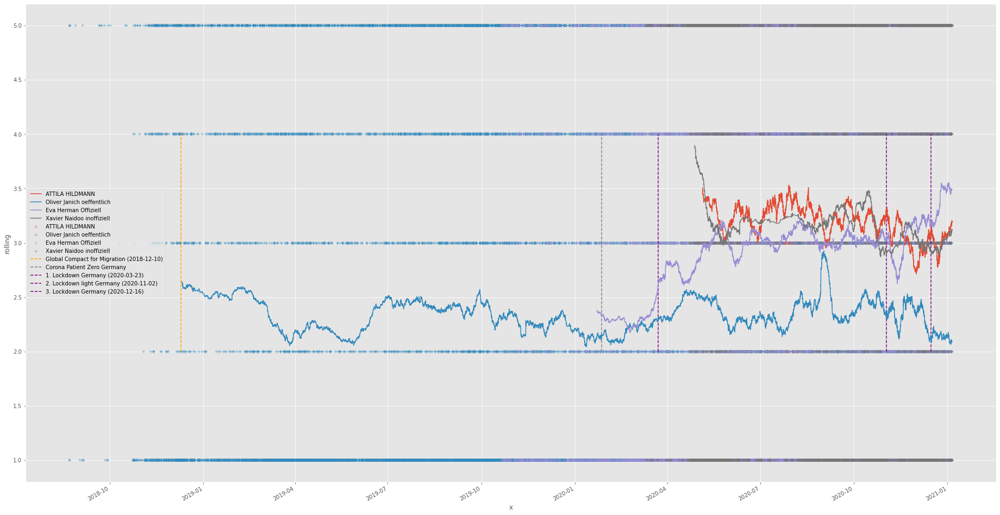

In [145]:
evalSenPipeline("sen-bert", "dataSet0", outputFilename = "", configRolling = 600, configShowScatter = True)

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<< (3.655s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<< (4.726s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<< (2.178s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<< (1.430s)]

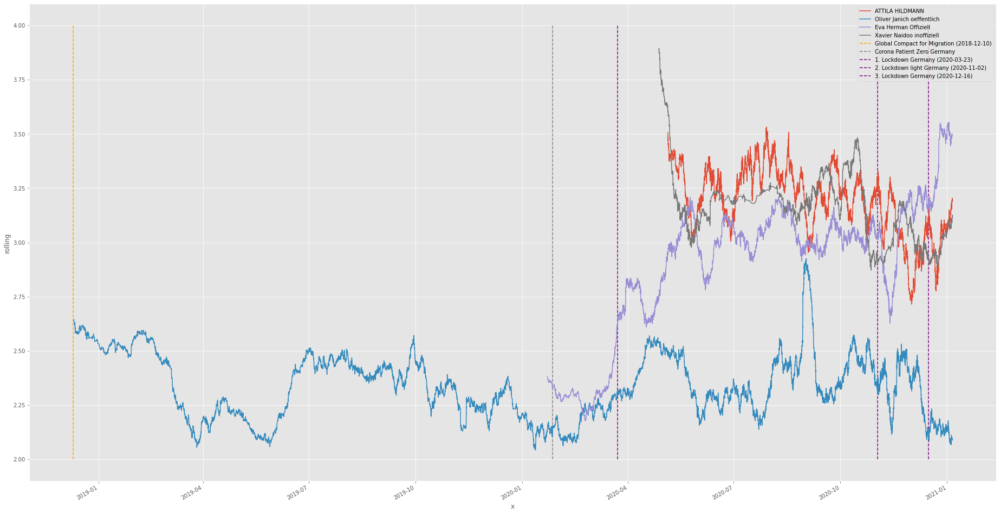

In [146]:
evalSenPipeline("sen-bert", "dataSet0", outputFilename = "eval-pipeline-sen-dataSet0.svg", configRolling = 600, configShowScatter = False)

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<< (3.741s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<< (4.960s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<< (2.256s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<< (1.419s)]

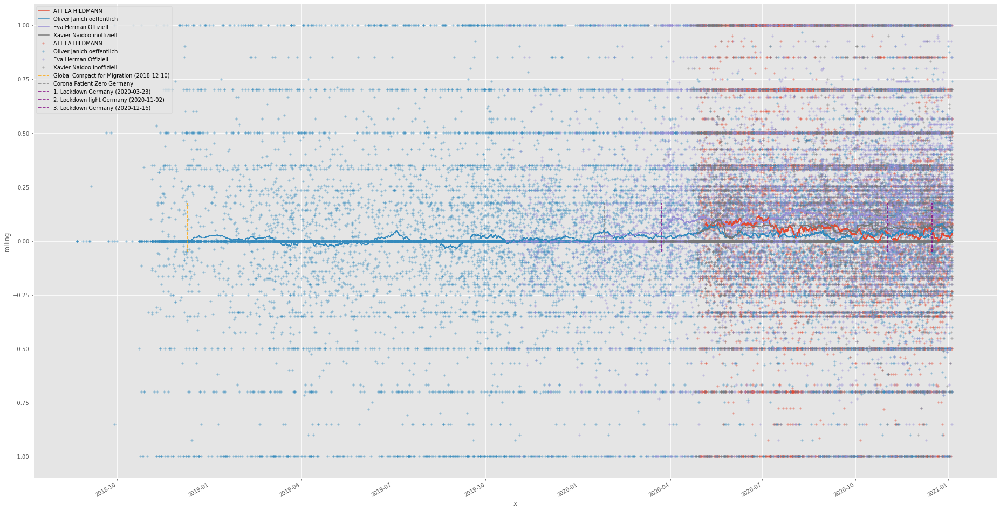

In [147]:
evalSenPipeline("sentiment", "dataSet0", outputFilename = "", configRolling = 600, configShowScatter = True)

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<< (6.332s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<< (4.902s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<< (2.215s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<< (1.413s)]

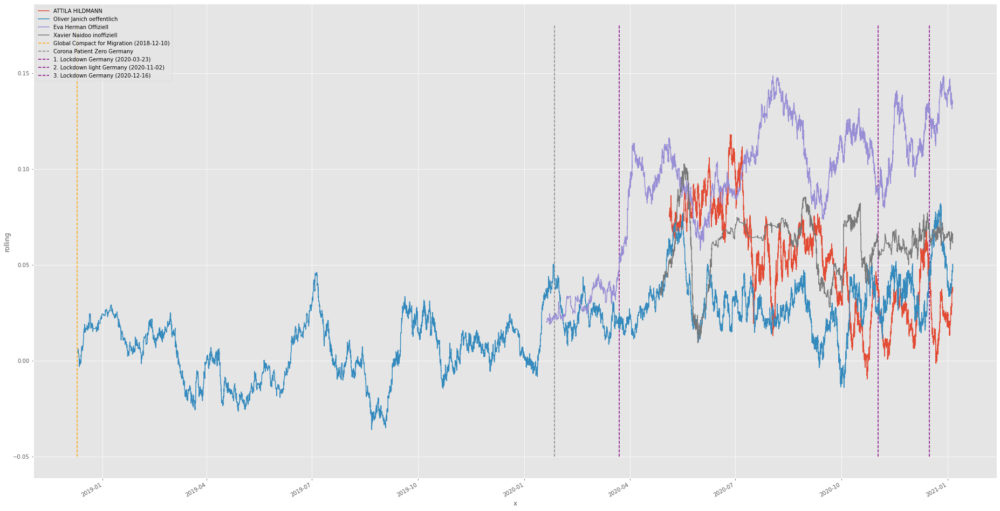

In [148]:
evalSenPipeline("sentiment", "dataSet0", outputFilename = "eval-pipeline-sen-textblob-dataSet0.svg", configRolling = 600, configShowScatter = False)

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<< (3.798s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<< (5.041s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<< (2.274s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<< (1.477s)]

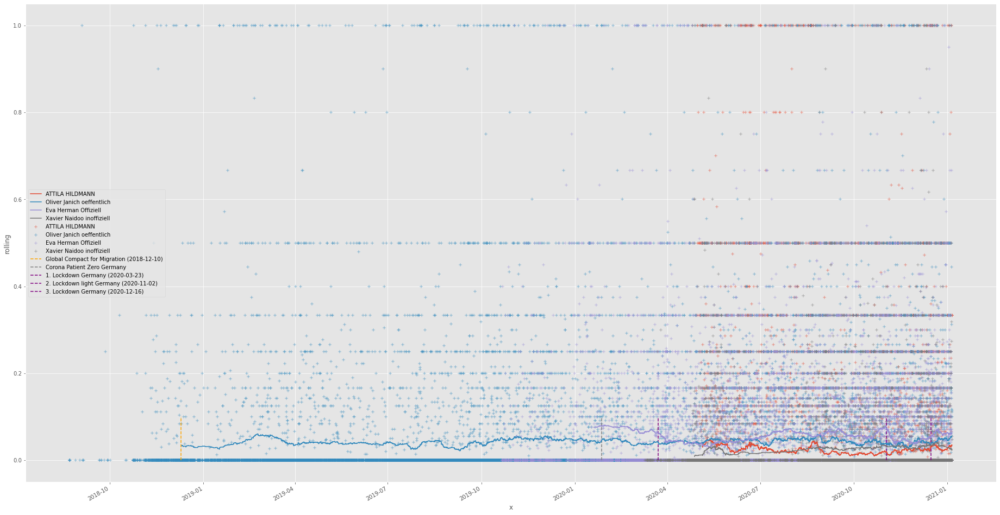

In [149]:
evalSenPipeline("subjectivity", "dataSet0", outputFilename = "", configRolling = 600, configShowScatter = True)

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<< (3.689s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<< (4.794s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<< (2.183s)]

[Stopwatch started >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<<]

[Stopwatch stopped >>Process now >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<< (1.365s)]

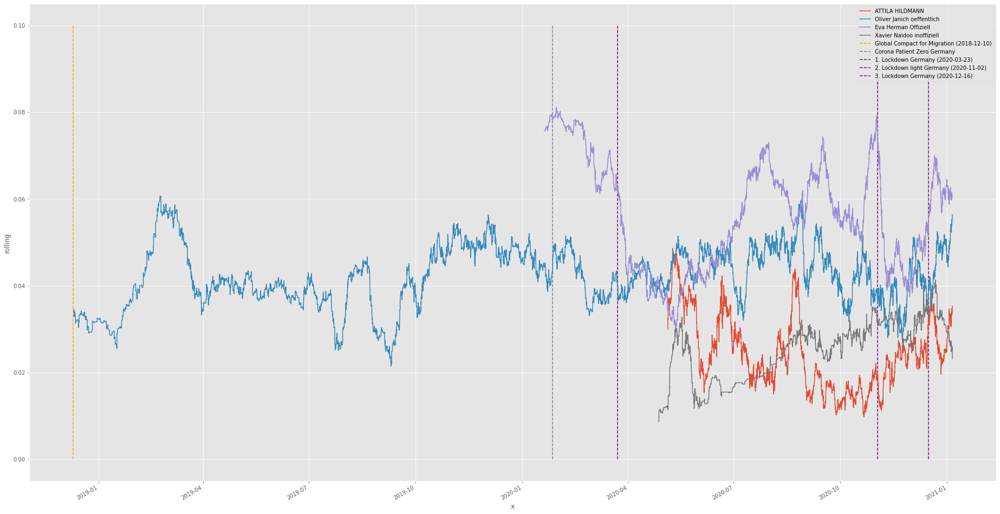

In [150]:
evalSenPipeline("subjectivity", "dataSet0", outputFilename = "eval-pipeline-subjectivity-dataSet0.svg", configRolling = 600, configShowScatter = False)

### Tests

In [151]:
print(str(processSentimentAnalysisPython("Heute ist ein toller Tag. Ich freue mich hier zu sein!")))

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/opt/conda/lib/python3.8/site-packages/textblob_de/ext/_pattern/text/__init__.py:257: ResourceWarning: unclosed file <_io.TextIOWrapper name='/opt/conda/lib/python3.8/site-packages/textblob_de/ext/_pattern/text/de/de-lexicon.txt' mode='r' encoding='utf-8'>
  dict.update(self, (x.split(" ")[:2] for x in _read(self._path)))


/opt/conda/lib/python3.8/site-packages/textblob_de/ext/_pattern/text/__init__.py:496: ResourceWarning: unclosed file <_io.TextIOWrapper name='/opt/conda/lib/python3.8/site-packages/textblob_de/ext/_pattern/text/de/de-context.txt' mode='r' encoding='utf-8'>
  list.extend(self, (x.split() for x in _read(self._path)))


/opt/conda/lib/python3.8/site-packages/textblob_de/ext/_pattern/text/__init__.py:1668: ResourceWarning: unclosed file <_io.TextIOWrapper name='/opt/conda/lib/python3.8/site-packages/textblob_de/ext/_pattern/text/de/de-verbs.txt' mode='r' encoding='utf-8'>
  for v in _read(self._path):


/opt/conda/lib/python3.8/site-packages/textblob_de/ext/_pattern/text/__init__.py:401: ResourceWarning: unclosed file <_io.TextIOWrapper name='/opt/conda/lib/python3.8/site-packages/textblob_de/ext/_pattern/text/de/de-morphology.txt' mode='r' encoding='utf-8'>
  list.extend(self, (x.split() for x in _read(self._path)))


{'polarity': 0.5, 'subjectivity': 0.0}

In [152]:
print(str(processSentimentAnalysisPython("Heute war ein furchtbarer Tag. Ich hasse alles.")))

{'polarity': -0.5, 'subjectivity': 0.0}

In [153]:
processSenPipeline("Das ist toll. Ich würde es mir wieder kaufen!", "sen-bert", 0)

5

In [154]:
processSenPipeline("Das ist toll. Ich würde es aber nicht mehr kaufen!", "sen-bert", 0)

3

In [155]:
processSenPipeline("Das funktioniert nicht.", "sen-bert", 0)

1

In [156]:
def processTextGenPipeline(inputText, pipelineKey, cMaxLength):
    if(pipelineKey in pipelineKeys):
        return dictPipelines[pipelineKey](inputText, max_length=cMaxLength)

In [157]:
sText = "Hallo, mein Name ist Max und ich esse gerne Eis. Ich schreibe gerade an meiner Masterarbeit und teste neue Verfahren. Ich komme aus dem Großraum München und bin Informatiker."

In [158]:
processNerPipeline(sText, "ner-xlm-roberta", 0)

{'per': ['▁Max'], 'misc': [], 'org': [], 'loc': ['▁München']}

In [159]:
processNerPipeline(sText, "ner-bert", 0)

Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.


{'per': ['max'], 'misc': [], 'org': [], 'loc': ['mu', '##nchen']}

In [160]:
processTextGenPipeline(sText, "text-gen-gpt2", cMaxLength = 100)

Setting `pad_token_id` to `eos_token_id`:52000 for open-end generation.


[{'generated_text': 'Hallo, mein Name ist Max und ich esse gerne Eis. Ich schreibe gerade an meiner Masterarbeit und teste neue Verfahren. Ich komme aus dem Großraum München und bin Informatiker.\nEs beginnt bei meiner Masterarbeit, bin mir sehr bewusst, dass ich viele Dinge in seinem Kopf tun muss, und mein Name ist Max.\nMeine Arbeit, meine Lehre und alle anderen Interessen habe ich natürlich für mich selbst.\nAlso meine Mutter, meine Schwester: "\nIch bin die einzige Mutter, die die'}]

In [161]:
processTextGenPipeline(sText, "text-gen-gpt2-faust", cMaxLength = 100)

Setting `pad_token_id` to `eos_token_id`:52000 for open-end generation.


[{'generated_text': 'Hallo, mein Name ist Max und ich esse gerne Eis. Ich schreibe gerade an meiner Masterarbeit und teste neue Verfahren. Ich komme aus dem Großraum München und bin Informatiker.Mephistopheles. Nacht.edelweiss nicht, ist ein deutscher Beruf.Laut. Du hast recht, ich finde das auch schön. Stellt er in den Spiegel, gibt es ein Wort, ist das auch Geschichte?Faust.Du bist ein wahrer Jungfern-Sohn?Mephistophel'}]

## Topic Modeling

Overview Topic Modeling
https://nlpforhackers.io/topic-modeling/

- LDA (Probabilistic Graphical Models)
- LSA or LSI (Linear Algebra Singular Value Decomposition)
- NMF (Linear Algebra Non-Negative Matrix Factorization)

### Latent Dirichlet Allocation (LDA) with Gensim

https://towardsdatascience.com/end-to-end-topic-modeling-in-python-latent-dirichlet-allocation-lda-35ce4ed6b3e0

In [162]:
# TODO: Get clean words from it (arrays)
def sendToWords(sentences):
    for sentence in sentences:
        # deacc= removes punctuations
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))
        
def removeStopwords(texts, stop_words):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]

In [163]:
"""
return  (lda_model, corpus, id2word)
"""
def processLda(df, num_topics, debugPrint, filterList):

    df = df.copy()

    df = df[df.procEvalIsValidText == True]

    df = df[["date", "procTDSafeLowercaseText"]]

    df = df.set_index("date")
    df = df.sort_index()

    # ###############################
    # ### Transform Data ############
    # ###############################
    stops_words = gloGetStopWordsList(filterList)

    msgList     = df.procTDSafeLowercaseText.values.tolist()

    # Create words
    msg_words   = list(sendToWords(msgList))
    msg_word    = removeStopwords(texts = msg_words, stop_words = stops_words)

    # Create Dictionary (id to word)
    id2word = corpora.Dictionary(msg_word)

    # Create Corpus
    texts = msg_word

    # Term Document Frequency (dict to bag of words)
    corpus = [id2word.doc2bow(text) for text in texts]

    # Build LDA model
    lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics)

    if(debugPrint):
        pprint(lda_model.print_topics())
        #doc_lda = lda_model[corpus] # TODO: ?

    return (lda_model, corpus, id2word)

In [164]:
"""
param   outputLabel required
"""
def ldaToHtml(lda_model, corpus, id2word, outputLabel):

    # pyLDAvis.enable_notebook()

    LDAvis_data_filepath = os.path.join(dir_var_output + 'pyLDAvis/' + outputLabel + '-data')

    # # this is a bit time consuming - make the if statement True
    # # if you want to execute visualization prep yourself
    """
    if 1 == 1:
        LDAvis_prepared = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
        with open(LDAvis_data_filepath, 'wb') as f:
            pickle.dump(LDAvis_prepared, f)

    # load the pre-prepared pyLDAvis data from disk
    with open(LDAvis_data_filepath, 'rb') as f:
        LDAvis_prepared = pickle.load(f)
    """

    LDAvis_prepared = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)

    pyLDAvis.save_html(LDAvis_prepared, dir_var_output + 'pyLDAvis/' + outputLabel + '-report.html')

In [165]:
# param outputLabel required
def autoLda(df, debugPrint, outputLabel, filterList, listNumberTopics):

    for iTopics in listNumberTopics:

        iLabel = outputLabel + "-t-" + str(iTopics)

        gloStartStopwatch("Process LDA (" + str(iTopics) + " topics) >> "+ iLabel + "<<")

        try:
            
            lda_model, corpus, id2word = processLda(
                df = df,
                num_topics = iTopics,
                debugPrint = debugPrint,
                filterList = filterList
            )

            ldaToHtml(
                lda_model = lda_model,
                corpus = corpus,
                id2word = id2word,
                outputLabel = iLabel
            )

        except:
            print("Error in process lda")

        gloStopStopwatch("Process LDA (" + str(iTopics) + " topics) >> "+ iLabel + "<<")

In [166]:
if(C_SHORT_RUN == False):
    autoLda(
        df = dictMessages["DS-05-01-2021/ChatExport_2021-01-05-janich"],
        debugPrint = False,
        outputLabel = "oliver-janich",
        filterList = [],
        listNumberTopics = [2,4,8,16]
    )

[Stopwatch started >>Process LDA (2 topics) >> oliver-janich-t-2<<<<]

<ipython-input-164-e64211a25665>:25: ResourceWarning: unclosed file <_io.TextIOWrapper name='./work/notebooks/output/pyLDAvis/oliver-janich-t-2-report.html' mode='w' encoding='UTF-8'>
  pyLDAvis.save_html(LDAvis_prepared, dir_var_output + 'pyLDAvis/' + outputLabel + '-report.html')


[Stopwatch stopped >>Process LDA (2 topics) >> oliver-janich-t-2<<<< (37.316s)]

[Stopwatch started >>Process LDA (4 topics) >> oliver-janich-t-4<<<<]

<ipython-input-164-e64211a25665>:25: ResourceWarning: unclosed file <_io.TextIOWrapper name='./work/notebooks/output/pyLDAvis/oliver-janich-t-4-report.html' mode='w' encoding='UTF-8'>
  pyLDAvis.save_html(LDAvis_prepared, dir_var_output + 'pyLDAvis/' + outputLabel + '-report.html')


[Stopwatch stopped >>Process LDA (4 topics) >> oliver-janich-t-4<<<< (32.295s)]

[Stopwatch started >>Process LDA (8 topics) >> oliver-janich-t-8<<<<]

<ipython-input-164-e64211a25665>:25: ResourceWarning: unclosed file <_io.TextIOWrapper name='./work/notebooks/output/pyLDAvis/oliver-janich-t-8-report.html' mode='w' encoding='UTF-8'>
  pyLDAvis.save_html(LDAvis_prepared, dir_var_output + 'pyLDAvis/' + outputLabel + '-report.html')


[Stopwatch stopped >>Process LDA (8 topics) >> oliver-janich-t-8<<<< (31.723s)]

[Stopwatch started >>Process LDA (16 topics) >> oliver-janich-t-16<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (16 topics) >> oliver-janich-t-16<<<< (28.627s)]

In [167]:
if(C_SHORT_RUN == False):
    autoLda(
        df = dictMessages["DS-05-01-2021/ChatExport_2021-01-05-hildmann"],
        debugPrint = False,
        outputLabel = "attila-hildmann",
        filterList = [],
        listNumberTopics = [2,4,8,16]
    )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Process LDA (2 topics) >> attila-hildmann-t-2<<<<]

<ipython-input-164-e64211a25665>:25: ResourceWarning: unclosed file <_io.TextIOWrapper name='./work/notebooks/output/pyLDAvis/attila-hildmann-t-2-report.html' mode='w' encoding='UTF-8'>
  pyLDAvis.save_html(LDAvis_prepared, dir_var_output + 'pyLDAvis/' + outputLabel + '-report.html')


[Stopwatch stopped >>Process LDA (2 topics) >> attila-hildmann-t-2<<<< (19.804s)]

[Stopwatch started >>Process LDA (4 topics) >> attila-hildmann-t-4<<<<]

<ipython-input-164-e64211a25665>:25: ResourceWarning: unclosed file <_io.TextIOWrapper name='./work/notebooks/output/pyLDAvis/attila-hildmann-t-4-report.html' mode='w' encoding='UTF-8'>
  pyLDAvis.save_html(LDAvis_prepared, dir_var_output + 'pyLDAvis/' + outputLabel + '-report.html')


[Stopwatch stopped >>Process LDA (4 topics) >> attila-hildmann-t-4<<<< (17.404s)]

[Stopwatch started >>Process LDA (8 topics) >> attila-hildmann-t-8<<<<]

<ipython-input-164-e64211a25665>:25: ResourceWarning: unclosed file <_io.TextIOWrapper name='./work/notebooks/output/pyLDAvis/attila-hildmann-t-8-report.html' mode='w' encoding='UTF-8'>
  pyLDAvis.save_html(LDAvis_prepared, dir_var_output + 'pyLDAvis/' + outputLabel + '-report.html')


[Stopwatch stopped >>Process LDA (8 topics) >> attila-hildmann-t-8<<<< (16.357s)]

[Stopwatch started >>Process LDA (16 topics) >> attila-hildmann-t-16<<<<]

<ipython-input-164-e64211a25665>:25: ResourceWarning: unclosed file <_io.TextIOWrapper name='./work/notebooks/output/pyLDAvis/attila-hildmann-t-16-report.html' mode='w' encoding='UTF-8'>
  pyLDAvis.save_html(LDAvis_prepared, dir_var_output + 'pyLDAvis/' + outputLabel + '-report.html')


[Stopwatch stopped >>Process LDA (16 topics) >> attila-hildmann-t-16<<<< (16.779s)]

In [168]:
if(C_SHORT_RUN == False):
    autoLda(
        df = dictMessages["DS-05-01-2021/ChatExport_2021-01-05-evaherman"],
        debugPrint = False,
        outputLabel = "eva-herman",
        filterList = [],
        listNumberTopics = [2,4,8,16]
    )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Process LDA (2 topics) >> eva-herman-t-2<<<<]

<ipython-input-164-e64211a25665>:25: ResourceWarning: unclosed file <_io.TextIOWrapper name='./work/notebooks/output/pyLDAvis/eva-herman-t-2-report.html' mode='w' encoding='UTF-8'>
  pyLDAvis.save_html(LDAvis_prepared, dir_var_output + 'pyLDAvis/' + outputLabel + '-report.html')


[Stopwatch stopped >>Process LDA (2 topics) >> eva-herman-t-2<<<< (19.698s)]

[Stopwatch started >>Process LDA (4 topics) >> eva-herman-t-4<<<<]

<ipython-input-164-e64211a25665>:25: ResourceWarning: unclosed file <_io.TextIOWrapper name='./work/notebooks/output/pyLDAvis/eva-herman-t-4-report.html' mode='w' encoding='UTF-8'>
  pyLDAvis.save_html(LDAvis_prepared, dir_var_output + 'pyLDAvis/' + outputLabel + '-report.html')


[Stopwatch stopped >>Process LDA (4 topics) >> eva-herman-t-4<<<< (18.495s)]

[Stopwatch started >>Process LDA (8 topics) >> eva-herman-t-8<<<<]

<ipython-input-164-e64211a25665>:25: ResourceWarning: unclosed file <_io.TextIOWrapper name='./work/notebooks/output/pyLDAvis/eva-herman-t-8-report.html' mode='w' encoding='UTF-8'>
  pyLDAvis.save_html(LDAvis_prepared, dir_var_output + 'pyLDAvis/' + outputLabel + '-report.html')


[Stopwatch stopped >>Process LDA (8 topics) >> eva-herman-t-8<<<< (18.547s)]

[Stopwatch started >>Process LDA (16 topics) >> eva-herman-t-16<<<<]

<ipython-input-164-e64211a25665>:25: ResourceWarning: unclosed file <_io.TextIOWrapper name='./work/notebooks/output/pyLDAvis/eva-herman-t-16-report.html' mode='w' encoding='UTF-8'>
  pyLDAvis.save_html(LDAvis_prepared, dir_var_output + 'pyLDAvis/' + outputLabel + '-report.html')


[Stopwatch stopped >>Process LDA (16 topics) >> eva-herman-t-16<<<< (19.896s)]

In [169]:
if(C_SHORT_RUN == False):
    autoLda(
        df = dictMessages["DS-05-01-2021/ChatExport_2021-01-05-xavier"],
        debugPrint = False,
        outputLabel = "xavier-naidoo",
        filterList = [],
        listNumberTopics = [2,4,8,16]
    )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Process LDA (2 topics) >> xavier-naidoo-t-2<<<<]

<ipython-input-164-e64211a25665>:25: ResourceWarning: unclosed file <_io.TextIOWrapper name='./work/notebooks/output/pyLDAvis/xavier-naidoo-t-2-report.html' mode='w' encoding='UTF-8'>
  pyLDAvis.save_html(LDAvis_prepared, dir_var_output + 'pyLDAvis/' + outputLabel + '-report.html')


[Stopwatch stopped >>Process LDA (2 topics) >> xavier-naidoo-t-2<<<< (9.867s)]

[Stopwatch started >>Process LDA (4 topics) >> xavier-naidoo-t-4<<<<]

<ipython-input-164-e64211a25665>:25: ResourceWarning: unclosed file <_io.TextIOWrapper name='./work/notebooks/output/pyLDAvis/xavier-naidoo-t-4-report.html' mode='w' encoding='UTF-8'>
  pyLDAvis.save_html(LDAvis_prepared, dir_var_output + 'pyLDAvis/' + outputLabel + '-report.html')


[Stopwatch stopped >>Process LDA (4 topics) >> xavier-naidoo-t-4<<<< (8.835s)]

[Stopwatch started >>Process LDA (8 topics) >> xavier-naidoo-t-8<<<<]

<ipython-input-164-e64211a25665>:25: ResourceWarning: unclosed file <_io.TextIOWrapper name='./work/notebooks/output/pyLDAvis/xavier-naidoo-t-8-report.html' mode='w' encoding='UTF-8'>
  pyLDAvis.save_html(LDAvis_prepared, dir_var_output + 'pyLDAvis/' + outputLabel + '-report.html')


[Stopwatch stopped >>Process LDA (8 topics) >> xavier-naidoo-t-8<<<< (8.572s)]

[Stopwatch started >>Process LDA (16 topics) >> xavier-naidoo-t-16<<<<]

<ipython-input-164-e64211a25665>:25: ResourceWarning: unclosed file <_io.TextIOWrapper name='./work/notebooks/output/pyLDAvis/xavier-naidoo-t-16-report.html' mode='w' encoding='UTF-8'>
  pyLDAvis.save_html(LDAvis_prepared, dir_var_output + 'pyLDAvis/' + outputLabel + '-report.html')


[Stopwatch stopped >>Process LDA (16 topics) >> xavier-naidoo-t-16<<<< (9.450s)]

In [170]:
if(C_SHORT_RUN == False):
    if("dataSet1a" in C_LOAD_DATASET):
        autoLda(
            df = dictMessages["DS-05-01-2021a/ChatExport_2021-01-05-freiheitsChat"],
            debugPrint = False,
            outputLabel = "group-freiheitsChat",
            filterList = [],
            listNumberTopics = [2,4,8,16,32]
        )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Process LDA (2 topics) >> group-freiheitsChat-t-2<<<<]

<ipython-input-164-e64211a25665>:25: ResourceWarning: unclosed file <_io.TextIOWrapper name='./work/notebooks/output/pyLDAvis/group-freiheitsChat-t-2-report.html' mode='w' encoding='UTF-8'>
  pyLDAvis.save_html(LDAvis_prepared, dir_var_output + 'pyLDAvis/' + outputLabel + '-report.html')


[Stopwatch stopped >>Process LDA (2 topics) >> group-freiheitsChat-t-2<<<< (162.316s)]

[Stopwatch started >>Process LDA (4 topics) >> group-freiheitsChat-t-4<<<<]

<ipython-input-164-e64211a25665>:25: ResourceWarning: unclosed file <_io.TextIOWrapper name='./work/notebooks/output/pyLDAvis/group-freiheitsChat-t-4-report.html' mode='w' encoding='UTF-8'>
  pyLDAvis.save_html(LDAvis_prepared, dir_var_output + 'pyLDAvis/' + outputLabel + '-report.html')


[Stopwatch stopped >>Process LDA (4 topics) >> group-freiheitsChat-t-4<<<< (157.097s)]

[Stopwatch started >>Process LDA (8 topics) >> group-freiheitsChat-t-8<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (8 topics) >> group-freiheitsChat-t-8<<<< (147.521s)]

[Stopwatch started >>Process LDA (16 topics) >> group-freiheitsChat-t-16<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (16 topics) >> group-freiheitsChat-t-16<<<< (144.219s)]

[Stopwatch started >>Process LDA (32 topics) >> group-freiheitsChat-t-32<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (32 topics) >> group-freiheitsChat-t-32<<<< (145.406s)]

In [171]:
if(C_SHORT_RUN == False):
    if("dataSet1a" in C_LOAD_DATASET):
        autoLda(
            df = dictMessages["DS-05-01-2021a/ChatExport_2021-01-05-freiheitsChatBlitz"],
            debugPrint = False,
            outputLabel = "group-freiheitsChatBlitz",
            filterList = [],
            listNumberTopics = [2,4,8,16,32]
        )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Process LDA (2 topics) >> group-freiheitsChatBlitz-t-2<<<<]

<ipython-input-164-e64211a25665>:25: ResourceWarning: unclosed file <_io.TextIOWrapper name='./work/notebooks/output/pyLDAvis/group-freiheitsChatBlitz-t-2-report.html' mode='w' encoding='UTF-8'>
  pyLDAvis.save_html(LDAvis_prepared, dir_var_output + 'pyLDAvis/' + outputLabel + '-report.html')


[Stopwatch stopped >>Process LDA (2 topics) >> group-freiheitsChatBlitz-t-2<<<< (66.639s)]

[Stopwatch started >>Process LDA (4 topics) >> group-freiheitsChatBlitz-t-4<<<<]

<ipython-input-164-e64211a25665>:25: ResourceWarning: unclosed file <_io.TextIOWrapper name='./work/notebooks/output/pyLDAvis/group-freiheitsChatBlitz-t-4-report.html' mode='w' encoding='UTF-8'>
  pyLDAvis.save_html(LDAvis_prepared, dir_var_output + 'pyLDAvis/' + outputLabel + '-report.html')


[Stopwatch stopped >>Process LDA (4 topics) >> group-freiheitsChatBlitz-t-4<<<< (58.298s)]

[Stopwatch started >>Process LDA (8 topics) >> group-freiheitsChatBlitz-t-8<<<<]

<ipython-input-164-e64211a25665>:25: ResourceWarning: unclosed file <_io.TextIOWrapper name='./work/notebooks/output/pyLDAvis/group-freiheitsChatBlitz-t-8-report.html' mode='w' encoding='UTF-8'>
  pyLDAvis.save_html(LDAvis_prepared, dir_var_output + 'pyLDAvis/' + outputLabel + '-report.html')


[Stopwatch stopped >>Process LDA (8 topics) >> group-freiheitsChatBlitz-t-8<<<< (54.438s)]

[Stopwatch started >>Process LDA (16 topics) >> group-freiheitsChatBlitz-t-16<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (16 topics) >> group-freiheitsChatBlitz-t-16<<<< (50.099s)]

[Stopwatch started >>Process LDA (32 topics) >> group-freiheitsChatBlitz-t-32<<<<]

Error in process lda

[Stopwatch stopped >>Process LDA (32 topics) >> group-freiheitsChatBlitz-t-32<<<< (49.171s)]

In [172]:
if(C_SHORT_RUN == False):
    if("dataSet1a" in C_LOAD_DATASET):
        autoLda(
            df = dictMessages["DS-05-01-2021a/ChatExport_2021-01-05-liveFuerDeOsSc"],
            debugPrint = False,
            outputLabel = "group-liveFuerDeOsSc",
            filterList = [],
            listNumberTopics = [2,4,8,16,32]
        )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Process LDA (2 topics) >> group-liveFuerDeOsSc-t-2<<<<]

<ipython-input-164-e64211a25665>:25: ResourceWarning: unclosed file <_io.TextIOWrapper name='./work/notebooks/output/pyLDAvis/group-liveFuerDeOsSc-t-2-report.html' mode='w' encoding='UTF-8'>
  pyLDAvis.save_html(LDAvis_prepared, dir_var_output + 'pyLDAvis/' + outputLabel + '-report.html')


[Stopwatch stopped >>Process LDA (2 topics) >> group-liveFuerDeOsSc-t-2<<<< (4.176s)]

[Stopwatch started >>Process LDA (4 topics) >> group-liveFuerDeOsSc-t-4<<<<]

<ipython-input-164-e64211a25665>:25: ResourceWarning: unclosed file <_io.TextIOWrapper name='./work/notebooks/output/pyLDAvis/group-liveFuerDeOsSc-t-4-report.html' mode='w' encoding='UTF-8'>
  pyLDAvis.save_html(LDAvis_prepared, dir_var_output + 'pyLDAvis/' + outputLabel + '-report.html')


[Stopwatch stopped >>Process LDA (4 topics) >> group-liveFuerDeOsSc-t-4<<<< (3.550s)]

[Stopwatch started >>Process LDA (8 topics) >> group-liveFuerDeOsSc-t-8<<<<]

<ipython-input-164-e64211a25665>:25: ResourceWarning: unclosed file <_io.TextIOWrapper name='./work/notebooks/output/pyLDAvis/group-liveFuerDeOsSc-t-8-report.html' mode='w' encoding='UTF-8'>
  pyLDAvis.save_html(LDAvis_prepared, dir_var_output + 'pyLDAvis/' + outputLabel + '-report.html')


[Stopwatch stopped >>Process LDA (8 topics) >> group-liveFuerDeOsSc-t-8<<<< (3.421s)]

[Stopwatch started >>Process LDA (16 topics) >> group-liveFuerDeOsSc-t-16<<<<]

<ipython-input-164-e64211a25665>:25: ResourceWarning: unclosed file <_io.TextIOWrapper name='./work/notebooks/output/pyLDAvis/group-liveFuerDeOsSc-t-16-report.html' mode='w' encoding='UTF-8'>
  pyLDAvis.save_html(LDAvis_prepared, dir_var_output + 'pyLDAvis/' + outputLabel + '-report.html')


[Stopwatch stopped >>Process LDA (16 topics) >> group-liveFuerDeOsSc-t-16<<<< (3.561s)]

[Stopwatch started >>Process LDA (32 topics) >> group-liveFuerDeOsSc-t-32<<<<]

<ipython-input-164-e64211a25665>:25: ResourceWarning: unclosed file <_io.TextIOWrapper name='./work/notebooks/output/pyLDAvis/group-liveFuerDeOsSc-t-32-report.html' mode='w' encoding='UTF-8'>
  pyLDAvis.save_html(LDAvis_prepared, dir_var_output + 'pyLDAvis/' + outputLabel + '-report.html')


[Stopwatch stopped >>Process LDA (32 topics) >> group-liveFuerDeOsSc-t-32<<<< (7.469s)]

## Word Tracer

In [173]:
# https://www.bundestag.de/parlament/plenum/sitzverteilung_19wp
highlightwords = ["cdu", "spd", "afd", "fdp", "linke", "gruenen", "merkel"]

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Time Plot<<]

[Stopwatch started >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-janich<<<< (950.402s)]

[Stopwatch stopped >>Time Plot<< (950.869s)]

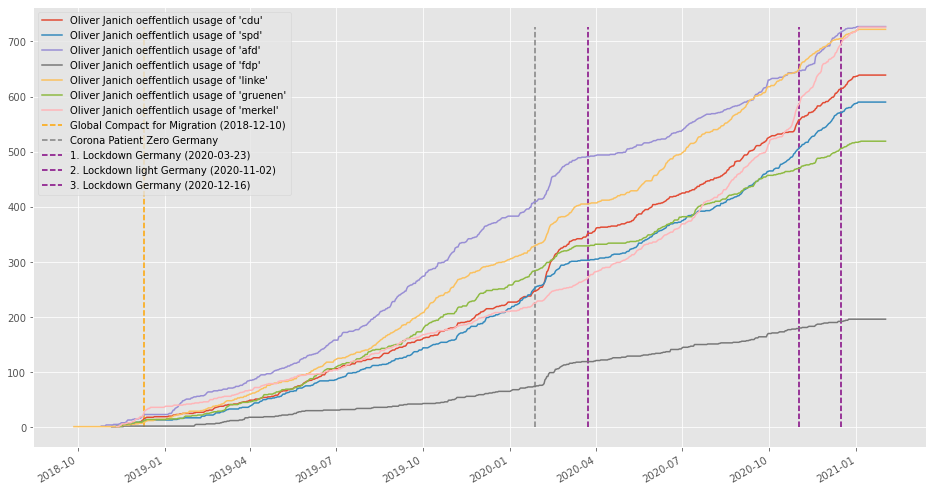

In [174]:
if(C_SHORT_RUN == False):
    drawTimePlot(
        filePathList = list(["DS-05-01-2021/ChatExport_2021-01-05-janich"]),
        outputFilename = "word-tracer-oliver-janich.svg",
        highlightWords = highlightwords,
        configFrequency=C_TIME_PLOT_FREQ
    )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Time Plot<<]

[Stopwatch started >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-hildmann<<<< (676.659s)]

[Stopwatch stopped >>Time Plot<< (677.307s)]

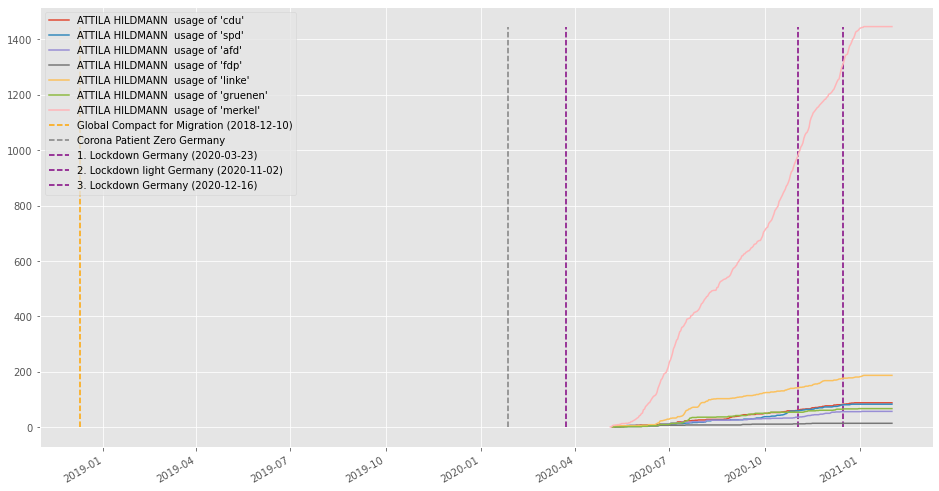

In [175]:
if(C_SHORT_RUN == False):
    drawTimePlot(
        filePathList = list(["DS-05-01-2021/ChatExport_2021-01-05-hildmann"]),
        outputFilename = "word-tracer-attila-hildmann.svg",
        highlightWords = highlightwords,
        configFrequency=C_TIME_PLOT_FREQ
    )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Time Plot<<]

[Stopwatch started >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-evaherman<<<< (525.060s)]

[Stopwatch stopped >>Time Plot<< (525.568s)]

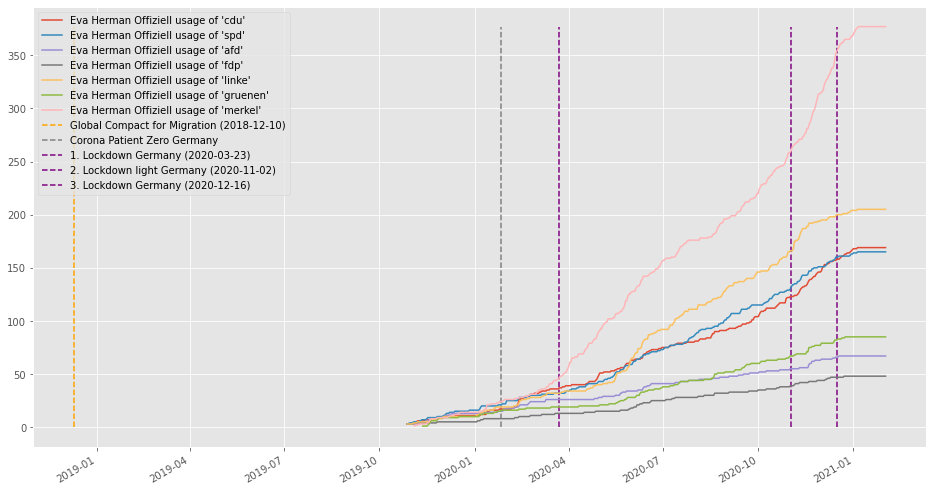

In [176]:
if(C_SHORT_RUN == False):
    drawTimePlot(
        filePathList = list(["DS-05-01-2021/ChatExport_2021-01-05-evaherman"]),
        outputFilename = "word-tracer-eva-herman.svg",
        highlightWords = highlightwords,
        configFrequency=C_TIME_PLOT_FREQ
    )

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch started >>Time Plot<<]

[Stopwatch started >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<<]

[Stopwatch stopped >>Time Plot >>DS-05-01-2021/ChatExport_2021-01-05-xavier<<<< (170.919s)]

[Stopwatch stopped >>Time Plot<< (171.257s)]

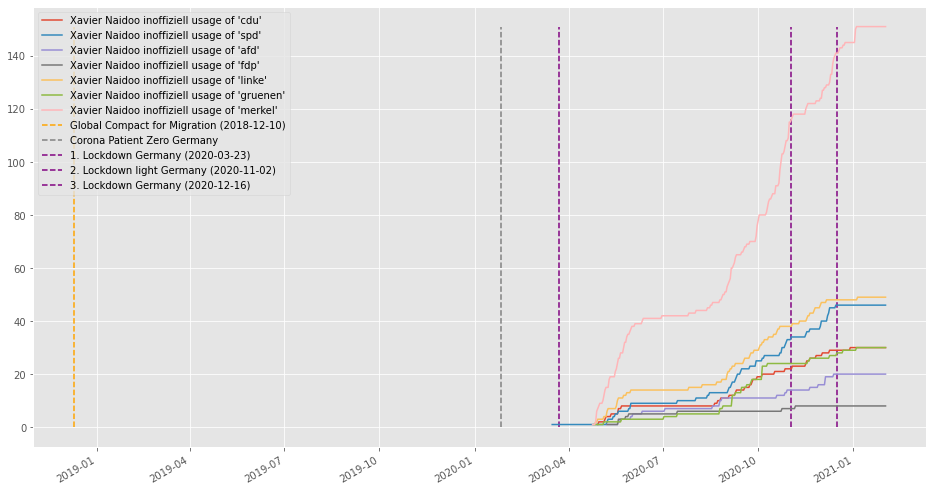

In [177]:
if(C_SHORT_RUN == False):
    drawTimePlot(
        filePathList = list(["DS-05-01-2021/ChatExport_2021-01-05-xavier"]),
        outputFilename = "word-tracer-xavier-naidoo.svg",
        highlightWords = highlightwords,
        configFrequency=C_TIME_PLOT_FREQ
    )

## Future Stuff

In [178]:
gloStopStopwatch("Global notebook")

/opt/conda/lib/python3.8/site-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[Stopwatch stopped >>Global notebook<< (13150.825s)]

In [179]:
# Next Steps
"""
- Add freq words to word tracer
- Python NatrualLanguage Toolkit tools?
"""

'\n- Add freq words to word tracer\n- Python NatrualLanguage Toolkit tools?\n'

In [180]:
# https://towardsai.net/p/data-mining/text-mining-in-python-steps-and-examples-78b3f8fd913b
"""
- Concordance (and Kookkurrenz and Correl?)
- Tokenization
- Finding frequency distinct in the text
- Stemming
- Lemmatization
- Stop words?
- Part of speech tagging (POS)
- Named entity recognition
- Chunking
"""

# https://towardsdatascience.com/text-mining-for-dummies-text-classification-with-python-98e47c3a9deb
"""
- Sentiment Analysis
"""

# https://www.analyticsvidhya.com/blog/2018/02/the-different-methods-deal-text-data-predictive-python/
"""
- Features: (Number of words, Number of characters, Average word length, Number of stopwords, Number of special characters, Number of nummberics, Number of uppercase words)
- Pre-processing (Lower casing, Punctuation removal, Stopwrods removal, Frequent word removal, Rare words removal, Spelling correction, Tokenization, Stemming, Lemmatization)
- Adv-processing (N-grams, Term Frequency, Inverse Document Frequency, Term Frequency-Inverse Document Frequency 'TF-IDF', Bag of words, Sentiment Analysis, Word Embedding)
"""

# https://realpython.com/python-keras-text-classification/
"""
- Text Analysis with Keras
"""

# https://www.tidytextmining.com/ngrams.html
"""
- Relationships between words: n-grams and correlations
"""

# http://seaborn.pydata.org/tutorial/categorical.html?highlight=bar%20plot
"""
- Plotting with categorical data (Box Plot)
"""

# https://towardsdatascience.com/visualizing-data-with-pair-plots-in-python-f228cf529166
"""
- Visualizing Data with Pairs Plots in Python
"""

# https://www.kirenz.com/post/2019-08-13-network_analysis/
"""
- Social Network Analysis with Python
"""

# https://tgstat.com
"""
- Compare website with my analyse
"""

# https://huggingface.co/bert-base-german-cased
"""
- Language Model Bert German
"""

# https://github.com/sekhansen/text-mining-tutorial/tree/master
"""
- An Introduction to Topic Modelling via Gibbs sampling
"""

# https://www.machinelearningplus.com/nlp/topic-modeling-gensim-python/
"""
- Topic Modeling with Gensim (Python)
"""

# https://towardsdatascience.com/end-to-end-topic-modeling-in-python-latent-dirichlet-allocation-lda-35ce4ed6b3e0
"""
- Topic Modeling in Python: Latent Dirichlet Allocation (LDA)
"""

# https://github.com/sekhansen/text-mining-tutorial/blob/master/tutorial_notebook.ipynb
"""
- Text Mining Python Tutorial
"""

# https://textmining.wp.hs-hannover.de/Preprocessing.html
"""
- Preprocessing samples
"""

# https://likegeeks.com/nlp-tutorial-using-python-nltk/
"""
- NLTK and NLP Tutorial
"""

# https://www.datacamp.com/community/tutorials/text-analytics-beginners-nltk
"""
- Another NLTK Tutorial
"""

# https://data-flair.training/blogs/nltk-python-tutorial/
"""
- NLTK Overview
"""

# https://github.com/expectocode/telegram-analysis
"""
- Telegram Python Sample
"""

'\n- Telegram Python Sample\n'